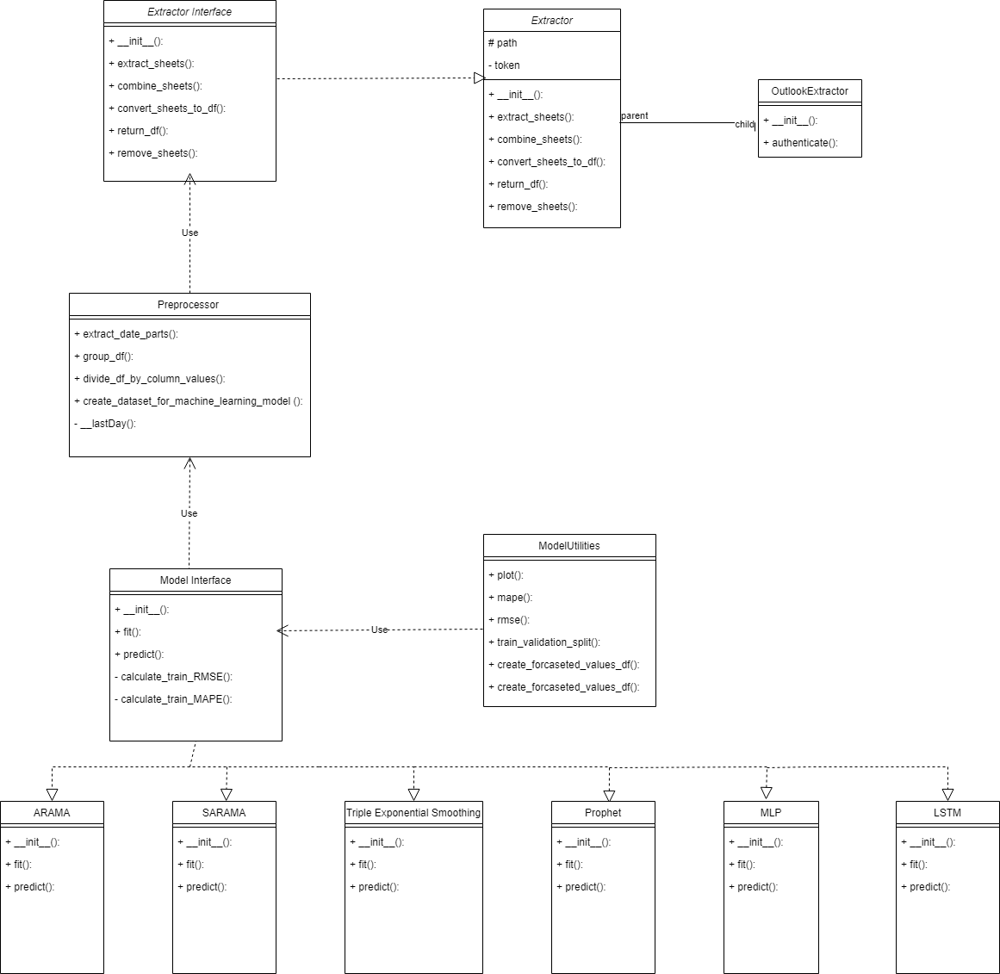

# Required Libararies

In [ ]:
!pip install pmdarima
!pip install minisom
!pip install tslearn

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
import calendar

from tensorflow import keras
import tensorflow
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm

import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

import itertools
import os
import math
from sklearn.preprocessing import MinMaxScaler
from minisom import MiniSom
from tslearn.barycenters import dtw_barycenter_averaging
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import silhouette_score


from pathlib import Path
import re
#import win32com.client
#import win32timezone
from openpyxl import load_workbook, Workbook
from datetime import datetime, timedelta
import datetime
import zipfile

import warnings
import pmdarima as pm
from pmdarima.arima import auto_arima
import plotly.express as px
warnings.filterwarnings("ignore")







# Interfaces And Utilities

In [ ]:
from abc import ABC, abstractmethod
class ExtractorInterface(ABC):
  @abstractmethod
  def __init__(self):
    pass
  @abstractmethod
  def extract_sheets_from_mails(self):
    pass
  @abstractmethod
  def combine_sheets(self):
    pass
  @abstractmethod
  def convert_sheets_to_dataframe(self):
    pass
  @abstractmethod
  def return_the_dataframe(self):
    pass
  @abstractmethod
  def remove_sheets(self):
    pass



In [ ]:
class EmptyDataFrameException(Exception):
    def __init__(self, message='The values are Empty'):
        self.message = message
        super().__init__(self.message)

In [ ]:
class ModelingUtilities:
    @staticmethod
    def plot(plot_y_label, plot_title, actual_data_dates, actual_values,
             train_dates, forecasted_train,
             validation_dates=None, forecasted_validation=None,
             test_dates=None, forecasted_test=None):

        # Create a figure
        fig = px.line()

        # Add actual data
        fig.add_scatter(x=actual_data_dates, y=actual_values, mode='lines+markers', name='Actual', line=dict(color='blue'))

        # Add predicted train data
        fig.add_scatter(x=train_dates, y=forecasted_train, mode='lines+markers', name='Predicted_Train', line=dict(color='green'))

        if validation_dates is not None and forecasted_validation is not None:
            # Add predicted validation data
            fig.add_scatter(x=validation_dates, y=forecasted_validation, mode='lines+markers', name='Predicted_Validation', line=dict(color='yellow'))

        if test_dates is not None and forecasted_test is not None:
            # Add predicted test data
            fig.add_scatter(x=test_dates, y=forecasted_test, mode='lines+markers', name='Predicted_Test', line=dict(color='red'))

        # Update layout

        fig.update_layout(
            xaxis_title='Dates',
            yaxis_title=plot_y_label,
            title=plot_title,
            xaxis=dict(tickangle=45),
            showlegend=True,
            grid=dict(
                rows=1,  # Number of rows in the grid
                columns=1,  # Number of columns in the grid
            )
        )
        # Show the plot
        fig.show()
    @staticmethod
    def mape(y_true, y_pred):
        epsilon = 1e-6
        # replace zero value with epsilion to aviod division by zero when calculating MAPE
        y_true = y_true.replace(0, epsilon)
        y_pred = y_pred.replace(0, epsilon)
        return np.mean(np.abs(y_true - y_pred) / y_true) * 100


    @staticmethod
    def rmse(y_true, y_pred):
        return np.sqrt(mean_squared_error(y_true, y_pred))


    @staticmethod
    def train_validation_split(df, percentage):# this function will take the data frame and the percentage and return two data frame
                                               # the first one represent the train data_set and the second_one is validation data set

       # Split data into train, test, and validation sets
        train_size = int( percentage* len(df))
        train = df.iloc[:train_size]
        validation = df.iloc[train_size:]
        return train.reset_index(drop=True), validation.reset_index(drop=True)


    @staticmethod
    def create_forcaseted_values_df(dataset_Type, link_name, dates, values):
        if len(dates) == 0:
            raise EmptyDataFrameException('The Dates Are Empty')
        if len(values) == 0:
            raise EmptyDataFrameException('The Values Are Empty')
        forecasted_values_df = pd.DataFrame({'DataSet Type':[],'Link':[], 'Date':[], 'Forecasted_Utilization':[]})
        #for i in range(len(dates)):
        for date, value in zip(dates, values):
            temp_df = pd.DataFrame([[dataset_Type, link_name, date, value]], columns=['DataSet Type', 'Link', 'Date', 'Forecasted_Utilization'])
            forecasted_values_df = pd.concat([forecasted_values_df, temp_df])
        return forecasted_values_df


# Implementation

## PreProcessor

In [ ]:
class Preprocessor():

    @staticmethod
    def __lastDay(date):
        """ This Function get the last day of the month"""
        d = date.replace(day = calendar.monthrange(date.year, date.month)[1])
        return d

    @staticmethod
    def extract_date_parts(df, date_column):
        date_column = pd.to_datetime(date_column)
        df['DateTime'] = pd.to_datetime(date_column)
        df['Day'] = pd.to_datetime(date_column).dt.day
        df['Month'] = pd.to_datetime(date_column).dt.month
        df['Year'] = pd.to_datetime(date_column).dt.year
        df['Week'] = pd.to_datetime(date_column).dt.week
        df['Week_Full_Date'] = pd.to_datetime(date_column).dt.to_period('W').dt.start_time
        df['Month_Full_Date'] = pd.to_datetime(date_column).apply(Preprocessor.__lastDay)
        df['Year_Full_Date'] = date_column.dt.strftime('%Y-12-31')
        return df


    @staticmethod
    def group_df(df, group_by_columns, aggregated_columns):
        grouped_df = df.groupby(group_by_columns).mean()[aggregated_columns].reset_index()
        return grouped_df


    @staticmethod # this will use for
    def divide_df_by_column_values(df, column):
        links_df = []
        links_name = column.unique()
        for link in links_name:
            link_df = df[column == link]
            links_df.append(link_df)
        return links_df


    # Convert an array of values into a dataset matrix
    @staticmethod
    def create_dataset_for_machine_learning_model(dataset, look_back=1):
        m = len(dataset)
        X = []
        y = []
        for i in range(look_back, m):
            X.append(dataset[i - look_back: i, 0])
            y.append(dataset[i, 0])
        return np.array(X), np.array(y)

## Extractor

In [ ]:
class Extractor(ExtractorInterface):
  def __init__(self):
    pass
  def extract_sheets_from_mails(self):
    pass
  def combine_sheets(self):
    pass
  def convert_sheets_to_dataframe(self):
    pass
  def return_the_dataframe(self):
    pass
  def remove_sheets(self):
    pass

In [ ]:
class GmailExtractor(Extractor):
  def __init__(self):
    pass
  def authenticate(self):
    pass


class OutlookExtractor(Extractor):
  def __init__(self):
    pass
  def authenticate(self):
    pass


# Create an instance of the Extractor class

extractor = Extractor()
gmail = GmailExtractor()
outlook = OutlookExtractor()
df = extractor.extract(outlook)

##outlook extractor

In [ ]:
class EmailAttachmentExtractor:
    """
    A class for extracting email attachments and bodies from Outlook emails.
    """
    def __init__(self, output_folder_input, mailbox_name, folder_name, parent_directory):
        self.output_folder_input = output_folder_input
        self.mailbox_name = mailbox_name
        self.folder_name = folder_name
        self.parent_directory = parent_directory

    def extract_sheets_from_mails(self):
        """
        Extracts email attachments, bodies, and received dates based on specified criteria.
        """
        # Determine the output folder
        output_folder = Path(self.output_folder_input) if self.output_folder_input else Path.home() / "Desktop" / "DEBI"
        output_folder.mkdir(parents=True, exist_ok=True)

        # Connect to Outlook
        outlook = win32com.client.Dispatch("Outlook.Application").GetNamespace("MAPI")

        inbox = outlook.GetDefaultFolder(6)

        # Access the "test" subfolder within the "Inbox"
        subfolder_name = input("Enter the name of the subfolder within 'Inbox': ")
        test_subfolder = inbox.Folders[subfolder_name]

        # Compile subject pattern if provided
        email_subject_input = input("Enter the first words of the subject: ").strip()
        subject_pattern = re.compile(fr"^{re.escape(email_subject_input)}", re.IGNORECASE) if email_subject_input else None

        # You've accessed the "test" subfolder, you can now interact with it
        print(f"Accessed the {subfolder_name} subfolder within the 'Inbox'.")

        messages = test_subfolder.Items
        processed_subjects = set()

        for message in messages:
            subject = message.Subject
            received_date = message.ReceivedTime

            # Check if the subject matches the pattern or if no pattern provided
            if subject_pattern is None or (subject and subject_pattern.search(subject)):
                attachments = message.Attachments

                # Sanitize subject for folder naming
                sanitized_subject = re.sub('[^0-9a-zA-Z]+', '', subject) if subject else "NoSubject"

                # Generate a unique counter for folders with the same sanitized subject
                counter = 1
                while f"{sanitized_subject}_{counter}" in processed_subjects:
                    counter += 1
                processed_subjects.add(f"{sanitized_subject}_{counter}")

                # Create target folder for email
                target_folder = output_folder / f"{sanitized_subject}_{counter}_{received_date.strftime('%Y-%m-%d_%H-%M-%S')}"
                target_folder.mkdir(parents=True, exist_ok=True)

                # Save received date
                received_date_str = received_date.strftime("%Y-%m-%d %H:%M:%S")
                with open(target_folder / "received_date.txt", "w") as date_file:
                    date_file.write(received_date_str)

                # Save email body
                email_body = message.Body
                with open(target_folder / "email_body.txt", "w", encoding="utf-8") as body_file:
                    body_file.write(email_body)

                # Save attachments
                for attachment in attachments:
                    attachment_name = re.sub('[^0-9a-zA-Z\.]+', '', attachment.FileName)
                    attachment.SaveAsFile(target_folder / attachment_name)

        print("Email attachments, bodies, and received dates downloaded successfully.")

    def extract_zip_files(self, zip_file_prefix):
        for subdir in os.listdir(self.parent_directory):
            subdir_path = os.path.join(self.parent_directory, subdir)

            if os.path.isdir(subdir_path):
                # Extract zip files
                zip_files = [file for file in os.listdir(subdir_path) if file.endswith(".zip")]
                for zip_file in zip_files:
                    zip_file_path = os.path.join(subdir_path, zip_file)
                    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
                        # List files within the ZIP archive
                        files_in_zip = zip_ref.namelist()

                        # Filter and extract files that start with the provided prefix
                        for file_in_zip in files_in_zip:
                            if file_in_zip.startswith(zip_file_prefix):
                                zip_ref.extract(file_in_zip, subdir_path)

    def process_bh_excel_files(self):
        output_directory = os.path.join(self.parent_directory, "output")

        if not os.path.exists(output_directory):
            os.makedirs(output_directory)

        header_mapping = {}
        concatenated_data = {"PTN_Utilization": [], "PTN_GE": [], "AVG_Dir_Util": []}

        for subdir in os.listdir(self.parent_directory):
            subdir_path = os.path.join(self.parent_directory, subdir)

            if os.path.isdir(subdir_path):
                xlsx_files = [file for file in os.listdir(subdir_path) if file.startswith("BHDaily")]
                for xlsx_file in xlsx_files:
                    file_path = os.path.join(subdir_path, xlsx_file)
                    input_wb = load_workbook(file_path, data_only=True)
                    for sheet_name in ["PTN_Utilization", "PTN_GE", "AVG_Dir_Util"]:
                        if sheet_name in input_wb.sheetnames:
                            if sheet_name not in header_mapping:
                                header_mapping[sheet_name] = next(input_wb[sheet_name].iter_rows(values_only=True))
                            input_sheet = input_wb[sheet_name]
                            rows = input_sheet.iter_rows(min_row=2, values_only=True)  # Skip header
                            date_file_path = os.path.join(subdir_path, "received_date.txt")
                            with open(date_file_path, "r") as date_file:
                                date_value = date_file.read().strip()
                            parsed_datetime = datetime.strptime(date_value, "%Y-%m-%d %H:%M:%S")
                            formatted_date = parsed_datetime.strftime("%d-%m-%Y")
                            if sheet_name in ["PTN_GE", "AVG_Dir_Util", "PTN_Utilization"]:
                                modified_date = parsed_datetime - timedelta(days=1)  # Subtract one day
                                formatted_modified_date = modified_date.strftime("%d-%m-%Y")
                                for row in rows:
                                    row_with_date = row + (formatted_date,)
                                    row_with_modified_date = row + (formatted_modified_date,)  # Use modified date
                                    concatenated_data[sheet_name].append(row_with_modified_date)
                            else:
                                for row in rows:
                                    row_with_date = row + (formatted_date,)
                                    concatenated_data[sheet_name].append(row_with_date)

        for sheet_name, data in concatenated_data.items():
            output_wb = Workbook()
            output_ws = output_wb.active
            output_ws.append(header_mapping[sheet_name] + ("Date",))  # Add "Date" to header
            for data_row in data:
                output_ws.append(data_row)
            output_path = os.path.join(output_directory, f"{sheet_name}.xlsx")
            output_wb.save(output_path)

        print("Extraction, concatenation, and date addition completed!")


    def process_international_summary_sheets(self):
        output_directory = os.path.join(self.parent_directory, "output")

        if not os.path.exists(output_directory):
            os.makedirs(output_directory)

        concatenated_data = {"Summary": []}
        summary_header = None  # Initialize the header for the "Summary" sheet

        for subdir in os.listdir(self.parent_directory):
            subdir_path = os.path.join(self.parent_directory, subdir)

            if os.path.isdir(subdir_path):
                xlsx_files = [file for file in os.listdir(subdir_path) if file.lower().startswith("daily") and file.lower().endswith(".xlsx")]
                for xlsx_file in xlsx_files:
                    file_path = os.path.join(subdir_path, xlsx_file)
                    input_wb = load_workbook(file_path, data_only=True)
                    sheet_name = "Summary"  # The sheet you want to process
                    if sheet_name in input_wb.sheetnames:
                        print(f"Processing sheet '{sheet_name}' in '{xlsx_file}'")
                        input_sheet = input_wb[sheet_name]
                        if summary_header is None:
                            summary_header = next(input_sheet.iter_rows(values_only=True))
                        rows = input_sheet.iter_rows(min_row=2, values_only=True)  # Skip header

                        # Get the date from received_date.txt
                        date_file_path = os.path.join(subdir_path, "received_date.txt")
                        with open(date_file_path, "r") as date_file:
                            raw_date_value = date_file.read().strip()
                            parsed_datetime = datetime.strptime(raw_date_value, "%Y-%m-%d %H:%M:%S")
                            formatted_date_value = parsed_datetime.strftime("%d-%m-%Y")

                        for row in rows:
                            print(f"Row values: {row}")
                            concatenated_data[sheet_name].append(row + (formatted_date_value,))  # Adding date at the end

        for sheet_name, data in concatenated_data.items():
            output_wb = Workbook()
            output_ws = output_wb.active
            if summary_header:
                output_ws.append(summary_header + ("Date",))  # Add the manually set header
            for data_row in data:
                output_ws.append(data_row)

            for row in output_ws.iter_rows(min_row=2, max_row=output_ws.max_row, min_col=output_ws.max_column, max_col=output_ws.max_column):  # Format the date column
                for cell in row:
                    cell.number_format = "DD-MM-YYYY"

            output_path = os.path.join(output_directory, f"{sheet_name}.xlsx")
            output_wb.save(output_path)
            print(f"Saved {sheet_name}.xlsx with {len(data)} rows")

        print("Data extraction and concatenation completed!")


def main():
    """
    Main function to interact with the user and initiate email attachment extraction and Excel processing.
    """
    output_folder_input = input("Enter the path where you want to create the output folder (or leave empty for Desktop): ").strip()
    mailbox_name = input("Enter the mailbox name (leave empty for the default Outlook mailbox): ").strip()
    folder_name = input("Enter the folder name (leave empty for the default Inbox folder): ").strip()

    if not output_folder_input:
        output_folder_input = os.path.join(os.path.expanduser("~"), "Desktop", "DEBI")

    # Ensure that output_folder_input exists
    if not os.path.exists(output_folder_input):
        os.makedirs(output_folder_input)

    # Set parent_directory to be the same as output_folder_input
    parent_directory = output_folder_input

    extractor = EmailAttachmentExtractor(output_folder_input, mailbox_name, folder_name, parent_directory)
    extractor.extract_sheets_from_mails()
    extractor.extract_sheets_from_mails()

    # Prompt the user for the prefix to filter ZIP files
    zip_file_prefix = input("Enter the prefix to filter ZIP files (or leave empty to skip): ").strip()

    if zip_file_prefix:
        extractor.extract_zip_files(zip_file_prefix)

    extractor.process_bh_excel_files()
    extractor.process_international_summary_sheets()

if __name__ == "__main__":
    main()

# Models

## 1. Exponential Smoothing

#### 1.1 Model Blue Print

In [ ]:
class Exponential_smoothing(ExponentialSmoothing):
    def __init__(self, dates, train_values, frequency, validation_values=None, forecast_test_peroid=0,
                 trend=None, seasonal=None, seasonal_periods=None):
        self.dates = dates
        self.train_values = train_values
        self.frequency = frequency
        self.validation_values = validation_values
        self.forecast_test_peroid = forecast_test_peroid
        self.trend = trend
        self.seasonal = seasonal
        self.seasonal_periods = seasonal_periods
        self.fitted_model = None
        self.__forecasted_validation_and_test = None
        self.forecasted_train = None
        self.forecasted_validation = None
        self.forecasted_test = None
        self.train_dates = self.dates[:len(self.train_values)].reset_index(drop=True)
        self.test_dates = None
        self.validation_dates = self.dates[len(self.train_values):].reset_index(drop=True)
        self.validation_len = len(validation_values)
        self.fitted_model = None
        super().__init__(train_values, trend=trend, seasonal=seasonal, seasonal_periods=seasonal_periods)

    def fit(self, optimized=True):
        self.fitted_model = super().fit(optimized=optimized)
        self.forecasted_train = self.fitted_model.fittedvalues.reset_index(drop=True)

    def forecast(self):
        forecast_length = 0
        if len(self.validation_values) > 0:
            forecast_length += len(self.validation_values)
        if self.forecast_test_peroid != 0:
            forecast_length += self.forecast_test_peroid
            start_date = self.dates.max() + datetime.timedelta(days=1)
            self.test_dates = pd.date_range(start=start_date, periods=self.forecast_test_peroid, freq=self.frequency)
        self.__forecasted_validation_and_test = self.fitted_model.forecast(steps=forecast_length)
        #print(self.__forecasted_validation_and_test)
        self.forecasted_validation = self.__forecasted_validation_and_test[:self.validation_len].reset_index(drop=True)
        self.forecasted_test = self.__forecasted_validation_and_test[self.validation_len:].reset_index(drop=True)
        #print(self.forecasted_validation)

#### 1.2 Data Load

In [ ]:
all_links = pd.read_csv('/content/388_links_daily_after_prepro.csv').reset_index(drop=True)

In [ ]:
all_links.head()

,Date,Link Name,MTX_M,Hub_M,Utilization,trend\Abrupt,Capacity status,remain_percent,Day_Diff,num_non_continuous_days
0,12/31/2020,1,MK,H085,84.91,Trend,No Capacity Change,57.0,NaN,489.0
1,1/1/2021,1,MK,H085,84.45,Trend,No Capacity Change,57.0,1.0,489.0
2,1/2/2021,1,MK,H085,88.93,Trend,No Capacity Change,57.0,1.0,489.0
3,1/3/2021,1,MK,H085,10.69,Trend,No Capacity Change,57.0,1.0,489.0
4,1/4/2021,1,MK,H085,10.28,Trend,Capacity increase,57.0,1.0,489.0


#### 1.3 Data Preprocessing

In [ ]:
preprocess = Preprocessor()
all_links = preprocess.extract_date_parts(all_links, all_links['Date'])
daily_utilization = preprocess.group_df(all_links, group_by_columns= ['Link Name', 'DateTime'], aggregated_columns='Utilization')
weekly_utilization = preprocess.group_df(all_links, group_by_columns= ['Link Name', 'Week_Full_Date'], aggregated_columns='Utilization')
monthly_utilization = preprocess.group_df(all_links, group_by_columns= ['Link Name', 'Month_Full_Date'], aggregated_columns='Utilization')
daily_links_utilization_df = preprocess.divide_df_by_column_values(daily_utilization, daily_utilization['Link Name'])
weekly_links_utilization_df = preprocess.divide_df_by_column_values(weekly_utilization, weekly_utilization['Link Name'])
monthly_links_utilization_df = preprocess.divide_df_by_column_values(monthly_utilization, monthly_utilization['Link Name'])

In [ ]:
weekly_links_utilization_df[0].head()

,Link Name,Week_Full_Date,Utilization
0,1,2020-12-28,67.245000
1,1,2021-01-04,10.855714
2,1,2021-01-11,65.898571
3,1,2021-01-18,87.662857
4,1,2021-01-25,88.302857


#### 1.4 Model Creation And Prediction

In [ ]:
def forecast_links_utilization(links_df, frequency, date_column_name, forecasted_peroid ,trend=None, seasonaliy=None, seasonality_peroid=None):
    # create Metrics dataframe to save metrics of validation and train on it.
    Metrics_df = pd.DataFrame({'Link': [], 'Trian RMSE': [], 'Train MAPE': [], 'Validation RMSE': [], 'Validation MAPE': []})
    all_forecasted_values_df = pd.DataFrame({'DataSet Type':[],'Link':[], 'Date':[], 'Forecasted_Utilization':[]})
    for link_no in range(len(links_df)):
        # train and validation split
        train, validation = ModelingUtilities.train_validation_split(links_df[link_no], 0.7)

        exp = Exponential_smoothing(links_df[link_no][date_column_name],
                                    train['Utilization'], frequency,
                                    validation['Utilization'],
                                    forecasted_peroid,
                                    trend,
                                    seasonaliy,
                                    seasonality_peroid
                                   )

        exp.fit()
        exp.forecast()

        # calculate the root mean squre error and mean absoulte precentage error for train and validation
        rmse_train = ModelingUtilities.rmse(train['Utilization'], exp.forecasted_train)
        rmse_validation = ModelingUtilities.rmse(validation['Utilization'], exp.forecasted_validation)

        mape_train = ModelingUtilities.mape(train['Utilization'], exp.forecasted_train)
        mape_validation = ModelingUtilities.mape(validation['Utilization'], exp.forecasted_validation)

        temp_df = pd.DataFrame([['link {}'.format(link_no + 1), rmse_train, mape_train, rmse_validation, mape_validation, 'Exponential Smoothing', exp]], columns=['Link','Trian RMSE','Train MAPE', 'Validation RMSE', 'Validation MAPE', 'Model Name', 'Model Object'])
        Metrics_df = pd.concat([Metrics_df, temp_df])

        # creating forecasted_values_df to save all forecasted values on it.
        train_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Train', 'link {}'.format(link_no + 1), exp.train_dates, exp.forecasted_train)
        validation_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Validation','link {}'.format(link_no + 1), exp.validation_dates, exp.forecasted_validation)
        test_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Test', 'link {}'.format(link_no + 1), exp.test_dates, exp.forecasted_test)

        all_forecasted_values_df = pd.concat([all_forecasted_values_df, train_forecasted_values_df, validation_forecasted_values_df, test_forecasted_values_df])
        # ploting the actual, train, validation and test data
        actual_data_dates = links_df[link_no][date_column_name]
        actual_values = links_df[link_no]['Utilization']
        if link_no > 15:
          continue
        ModelingUtilities.plot('Utilization', f'Exponential Smoothing - Link {link_no+1}',
                               actual_data_dates, actual_values,
                               exp.train_dates, exp.forecasted_train,
                               exp.validation_dates, exp.forecasted_validation,
                               exp.test_dates, exp.forecasted_test
                              )
    all_forecasted_values_df = all_forecasted_values_df.reset_index(drop=True)
    return Metrics_df, all_forecasted_values_df


In [ ]:
daily_Metrics_df, daily_all_forecasted_values_df = forecast_links_utilization(daily_links_utilization_df, 'd', 'DateTime', 50 ,trend='mul', seasonaliy='mul', seasonality_peroid=7)
daily_Metrics_df, daily_all_forecasted_values_df

(        Link  Trian RMSE  Train MAPE  Validation RMSE  Validation MAPE  \
 0     link 1   12.697827   24.388789        19.830914        93.233991   
 0     link 2    9.922763   12.433824        11.084558        76.266106   
 0     link 3    7.562874   16.837944        13.591108        82.685718   
 0     link 4    6.943501   14.427202        18.738653        62.701497   
 0     link 5    3.732477   12.042983         6.779951        50.385742   
 ..       ...         ...         ...              ...              ...   
 0   link 384    0.627215    3.738272         6.379893        42.906032   
 0   link 385    1.561306    9.632752         2.752173        26.432443   
 0   link 386    1.911475   12.378085        19.329041        89.376152   
 0   link 387    4.255030   18.996849         5.624382        13.211162   
 0   link 388    0.311552    5.732774         1.908139        35.664132   
 
                Model Name                                       Model Object  
 0   Exponential S

In [ ]:
daily_Metrics_df

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE,Model Name,Model Object
0,link 1,12.697827,24.388789,19.830914,93.233991,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
0,link 2,9.922763,12.433824,11.084558,76.266106,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
0,link 3,7.562874,16.837944,13.591108,82.685718,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
0,link 4,6.943501,14.427202,18.738653,62.701497,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
0,link 5,3.732477,12.042983,6.779951,50.385742,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
...,...,...,...,...,...,...,...
0,link 384,0.627215,3.738272,6.379893,42.906032,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
0,link 385,1.561306,9.632752,2.752173,26.432443,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
0,link 386,1.911475,12.378085,19.329041,89.376152,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
0,link 387,4.255030,18.996849,5.624382,13.211162,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...


In [ ]:
weekly_Metrics_df, weekly_all_forecasted_values_df = forecast_links_utilization(weekly_links_utilization_df, 'W', 'Week_Full_Date', 8 ,trend='mul', seasonaliy='mul', seasonality_peroid=4)
weekly_Metrics_df, weekly_all_forecasted_values_df

(        Link  Trian RMSE  Train MAPE  Validation RMSE  Validation MAPE  \
 0     link 1    9.688370   28.638343         2.631888        11.021032   
 0     link 2   11.001367   21.744470        12.906345        86.802186   
 0     link 3    6.337947   21.923165         8.929015        51.971647   
 0     link 4    3.297879   13.467725         8.220352        24.663529   
 0     link 5    3.634646   19.978179         5.254793        39.884009   
 ..       ...         ...         ...              ...              ...   
 0   link 384    0.626931    4.351784         1.454314         8.739937   
 0   link 385    1.477116   11.546531         2.781931        28.155341   
 0   link 386    1.574104    9.305441         7.337098        30.508015   
 0   link 387    4.162860   14.164367         5.193122        11.583814   
 0   link 388    0.244965    5.648386         0.562534         9.557501   
 
                Model Name                                       Model Object  
 0   Exponential S

In [ ]:
weekly_Metrics_df

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE,Model Name,Model Object
0,link 1,9.688370,28.638343,2.631888,11.021032,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7b...
0,link 2,11.001367,21.744470,12.906345,86.802186,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7b...
0,link 3,6.337947,21.923165,8.929015,51.971647,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7b...
0,link 4,3.297879,13.467725,8.220352,24.663529,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7b...
0,link 5,3.634646,19.978179,5.254793,39.884009,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7b...
...,...,...,...,...,...,...,...
0,link 384,0.626931,4.351784,1.454314,8.739937,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7b...
0,link 385,1.477116,11.546531,2.781931,28.155341,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7b...
0,link 386,1.574104,9.305441,7.337098,30.508015,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7b...
0,link 387,4.162860,14.164367,5.193122,11.583814,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7b...


In [ ]:
monthly_Metrics_df, monthly_all_forecasted_values_df = forecast_links_utilization(monthly_links_utilization_df, 'M', 'Month_Full_Date', 4 ,trend='mul', seasonaliy='mul', seasonality_peroid=5)
monthly_Metrics_df, monthly_all_forecasted_values_df

(        Link  Trian RMSE  Train MAPE  Validation RMSE  Validation MAPE  \
 0     link 1    3.783073   16.437130         2.166575         9.702685   
 0     link 2    4.778259    7.474067         7.290999        54.236824   
 0     link 3    4.130139   15.256076         8.702188        49.387561   
 0     link 4    1.479757    6.918645         3.169270         9.308001   
 0     link 5    4.065418   21.463287         4.905785        36.808478   
 ..       ...         ...         ...              ...              ...   
 0   link 384    0.270291    2.235234         0.794695         5.091836   
 0   link 385    1.293022   12.492743         1.442564        14.403445   
 0   link 386    0.728517    5.086501         3.497905        14.420234   
 0   link 387    2.942141   11.667851         5.034454         9.577709   
 0   link 388    0.132581    3.037091         0.405373         6.854656   
 
                Model Name                                       Model Object  
 0   Exponential S

In [ ]:
monthly_Metrics_df

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE,Model Name,Model Object
0,link 1,3.783073,16.437130,2.166575,9.702685,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
0,link 2,4.778259,7.474067,7.290999,54.236824,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
0,link 3,4.130139,15.256076,8.702188,49.387561,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
0,link 4,1.479757,6.918645,3.169270,9.308001,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
0,link 5,4.065418,21.463287,4.905785,36.808478,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
...,...,...,...,...,...,...,...
0,link 384,0.270291,2.235234,0.794695,5.091836,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
0,link 385,1.293022,12.492743,1.442564,14.403445,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
0,link 386,0.728517,5.086501,3.497905,14.420234,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...
0,link 387,2.942141,11.667851,5.034454,9.577709,Exponential Smoothing,<__main__.Exponential_smoothing object at 0x7e...


## Prophet

In [ ]:
!pip install prophet

import prophet

In [ ]:
from prophet import Prophet

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
import calendar
import datetime

In [ ]:
all_links = pd.read_csv('/content/388_links_daily_after_prepro.csv').reset_index(drop=True)

In [ ]:

all_links.head(5)

,Date,Link Name,MTX_M,Hub_M,Utilization,trend\Abrupt,Capacity status,remain_percent,Day_Diff,num_non_continuous_days
0,12/31/2020,1,MK,H085,84.91,Trend,No Capacity Change,57.0,NaN,489.0
1,1/1/2021,1,MK,H085,84.45,Trend,No Capacity Change,57.0,1.0,489.0
2,1/2/2021,1,MK,H085,88.93,Trend,No Capacity Change,57.0,1.0,489.0
3,1/3/2021,1,MK,H085,10.69,Trend,No Capacity Change,57.0,1.0,489.0
4,1/4/2021,1,MK,H085,10.28,Trend,Capacity increase,57.0,1.0,489.0


In [ ]:
all_links.columns

Index(['Date', 'Link Name', 'MTX_M', 'Hub_M', 'Utilization', 'trend\Abrupt',
       'Capacity status', 'remain_percent', 'Day_Diff',
       'num_non_continuous_days'],
      dtype='object')

In [ ]:
preprocess = Preprocessor()
all_links = preprocess.extract_date_parts(all_links, all_links['Date'])
print(all_links.columns)
daily_utilization = preprocess.group_df(all_links, group_by_columns= ['Link Name', 'DateTime'], aggregated_columns='Utilization')
monthly_utilization = preprocess.group_df(all_links, group_by_columns= ['Link Name', 'Month_Full_Date'], aggregated_columns='Utilization')
daily_links_utilization_df = preprocess.divide_df_by_column_values(daily_utilization, daily_utilization['Link Name'])
monthly_links_utilization_df = preprocess.divide_df_by_column_values(monthly_utilization, monthly_utilization['Link Name'])

def prophet_forecast_links_utilization(links_df, frequency, date_column_name, forecasted_peroid):
    # create Metrics dataframe to save metrics of validation and train on it.
    Metrics_df = pd.DataFrame({'Link': [], 'Trian RMSE': [], 'Train MAPE': [], 'Validation RMSE': [], 'Validation MAPE': []})
    all_forecasted_values_df = pd.DataFrame({'DataSet Type':[],'Link':[], 'Date':[], 'Forecasted_Utilization':[]})
    for link_no in range(len(links_df)):
        # train and validation split
        train, validation = ModelingUtilities.train_validation_split(links_df[link_no], 0.7)

        final_df_train = pd.DataFrame({"y":train.Utilization,"ds":train[date_column_name]})
        final_df_validation = pd.DataFrame({"y":validation.Utilization,"ds":validation[date_column_name]})

        # Create a Prophet model with adjusted hyperparameters and seasonal components
        m = Prophet(
            interval_width=0.8,               # Increase the uncertainty interval width to 80%
            seasonality_prior_scale=2,      # Adjust seasonality prior scale
            changepoint_prior_scale=0.6,    # Adjust changepoint prior scale
        )

        # Add custom monthly seasonality with a lower Fourier order to reduce overfitting
        m.add_seasonality(name='monthly', period=30.5, fourier_order=2)

        # Fit the model to the training data
        model = m.fit(final_df_train)

        val_future = model.make_future_dataframe(periods=len(final_df_validation),freq=frequency)
        val_forecast = m.predict(val_future)

        test_future = model.make_future_dataframe(periods=len(final_df_validation)+forecasted_peroid,freq=frequency)
        test_forcast = m.predict(test_future)


        actual_data_dates = links_df[link_no][date_column_name]
        actual_values = links_df[link_no]['Utilization']

        train_predicted_values = test_forcast[:len(final_df_train)]["yhat"]

        validation_dates = val_forecast[-len(final_df_validation):]["ds"]
        validation_values = val_forecast[-len(final_df_validation):]["yhat"].reset_index(drop=True)

        test_date =  test_forcast[-len(final_df_validation)+forecasted_peroid:]["ds"]
        test_yhat  = test_forcast[-len(final_df_validation)+forecasted_peroid:]["yhat"].reset_index(drop=True)


        # # calculate the root mean squre error and mean absoulte precentage error for train and validation
        rmse_train = ModelingUtilities.rmse(train['Utilization'],train_predicted_values)
        rmse_validation = ModelingUtilities.rmse(validation['Utilization'],validation_values)

        mape_train = ModelingUtilities.mape(train['Utilization'], train_predicted_values)
        mape_validation = ModelingUtilities.mape(validation['Utilization'], validation_values)

        temp_df = pd.DataFrame([['link {}'.format(link_no + 1), rmse_train, mape_train, rmse_validation, mape_validation, 'prophet', m]], columns=['Link','Trian RMSE','Train MAPE', 'Validation RMSE', 'Validation MAPE', 'Model Name', 'Model Object'])
        Metrics_df = pd.concat([Metrics_df, temp_df])


        # creating forecasted_values_df to save all forecasted values on it.
        train_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Train', 'link {}'.format(link_no + 1), final_df_train.ds,train_predicted_values)
        validation_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Validation','link {}'.format(link_no + 1), validation_dates, validation_values)
        test_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Test', 'link {}'.format(link_no + 1), test_date, test_yhat)

        all_forecasted_values_df = pd.concat([all_forecasted_values_df, train_forecasted_values_df, validation_forecasted_values_df, test_forecasted_values_df])

        # ploting the actual, train, validation and test data
        if link_no > 15:
          continue

        ModelingUtilities.plot('Utilization', f'prophet - Link {link_no+1}',
                                actual_data_dates, actual_values,
                                final_df_train.ds,train_predicted_values,
                                validation_dates, validation_values,
                                test_date, test_yhat
                              )

    all_forecasted_values_df = all_forecasted_values_df.reset_index(drop=True)
    return Metrics_df, all_forecasted_values_df



Index(['Date', 'Link Name', 'MTX_M', 'Hub_M', 'Utilization', 'trend\Abrupt',
       'Capacity status', 'remain_percent', 'Day_Diff',
       'num_non_continuous_days', 'DateTime', 'Day', 'Month', 'Year', 'Week',
       'Week_Full_Date', 'Month_Full_Date', 'Year_Full_Date'],
      dtype='object')


In [ ]:
Metrics_df3, all_forecasted_values_df3 = prophet_forecast_links_utilization(links_df=monthly_links_utilization_df,frequency="M",date_column_name= "Month_Full_Date",forecasted_peroid =5)
Metrics_df3, all_forecasted_values_df3

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/wlcywtlg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/vizcdqkq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97778', 'data', 'file=/tmp/tmpplfj3ykj/wlcywtlg.json', 'init=/tmp/tmpplfj3ykj/vizcdqkq.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_model_p52fwmr/prophet_model-20231018134145.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:45 - cmdstanpy - INFO - Chain [1] start processing
I

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/si60rvka.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/lp27rip5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82151', 'data', 'file=/tmp/tmpplfj3ykj/si60rvka.json', 'init=/tmp/tmpplfj3ykj/lp27rip5.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelo3snbtti/prophet_model-20231018134146.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:46 - cmdstanpy - INFO - Chain [1] start processing
I

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/m5tvcknm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/t4idhuy6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70287', 'data', 'file=/tmp/tmpplfj3ykj/m5tvcknm.json', 'init=/tmp/tmpplfj3ykj/t4idhuy6.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_model9qom2tag/prophet_model-20231018134148.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:48 - cmdstanpy - INFO - Chain [1] start processing
I

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/fwpy4v6e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/mbxfbff_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18260', 'data', 'file=/tmp/tmpplfj3ykj/fwpy4v6e.json', 'init=/tmp/tmpplfj3ykj/mbxfbff_.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_model63me33vx/prophet_model-20231018134148.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:48 - cmdstanpy - INFO - Chain [1] start processing
I

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/x8ze63sv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/qso3c31r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74414', 'data', 'file=/tmp/tmpplfj3ykj/x8ze63sv.json', 'init=/tmp/tmpplfj3ykj/qso3c31r.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelzuk0smwq/prophet_model-20231018134149.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:49 - cmdstanpy - INFO - Chain [1] start processing
I

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/x_jev_pf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/q4unsfu0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39224', 'data', 'file=/tmp/tmpplfj3ykj/x_jev_pf.json', 'init=/tmp/tmpplfj3ykj/q4unsfu0.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelgxzrzii9/prophet_model-20231018134150.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:50 - cmdstanpy - INFO - Chain [1] start processing
I

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/ko121x_w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/no70vo38.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=170', 'data', 'file=/tmp/tmpplfj3ykj/ko121x_w.json', 'init=/tmp/tmpplfj3ykj/no70vo38.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modeltrj_feje/prophet_model-20231018134151.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:51 - cmdstanpy - INFO - Chain [1] start processing
INF

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/y5t26r4g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/3snjhi9o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7881', 'data', 'file=/tmp/tmpplfj3ykj/y5t26r4g.json', 'init=/tmp/tmpplfj3ykj/3snjhi9o.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modeldtnnoawq/prophet_model-20231018134151.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:51 - cmdstanpy - INFO - Chain [1] start processing
IN

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/af00wfdi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/b7glar7q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89019', 'data', 'file=/tmp/tmpplfj3ykj/af00wfdi.json', 'init=/tmp/tmpplfj3ykj/b7glar7q.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modeldkpsbitv/prophet_model-20231018134152.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:52 - cmdstanpy - INFO - Chain [1] start processing
I

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/l1cqoid_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/49lt1zf9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90385', 'data', 'file=/tmp/tmpplfj3ykj/l1cqoid_.json', 'init=/tmp/tmpplfj3ykj/49lt1zf9.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modeldh25o4az/prophet_model-20231018134152.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:52 - cmdstanpy - INFO - Chain [1] start processing
I

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/lqqkjrq7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/5ej8nx7o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32968', 'data', 'file=/tmp/tmpplfj3ykj/lqqkjrq7.json', 'init=/tmp/tmpplfj3ykj/5ej8nx7o.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_model4s3s6_ha/prophet_model-20231018134153.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:53 - cmdstanpy - INFO - Chain [1] start processing
I

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/asrah9tn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/m9fqahcv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58673', 'data', 'file=/tmp/tmpplfj3ykj/asrah9tn.json', 'init=/tmp/tmpplfj3ykj/m9fqahcv.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelmvy923wz/prophet_model-20231018134153.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:53 - cmdstanpy - INFO - Chain [1] start processing
I

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/2kbde93r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/8aqaulgy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98976', 'data', 'file=/tmp/tmpplfj3ykj/2kbde93r.json', 'init=/tmp/tmpplfj3ykj/8aqaulgy.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelxelhutr5/prophet_model-20231018134154.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:54 - cmdstanpy - INFO - Chain [1] start processing
I

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/7p4p04jg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/kr1nt25r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1965', 'data', 'file=/tmp/tmpplfj3ykj/7p4p04jg.json', 'init=/tmp/tmpplfj3ykj/kr1nt25r.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelhyfzexug/prophet_model-20231018134154.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:54 - cmdstanpy - INFO - Chain [1] start processing
IN

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/7pbcpg74.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/yr1s2xxt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90804', 'data', 'file=/tmp/tmpplfj3ykj/7pbcpg74.json', 'init=/tmp/tmpplfj3ykj/yr1s2xxt.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_model2059ywwz/prophet_model-20231018134155.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:55 - cmdstanpy - INFO - Chain [1] start processing
I

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/axhbev1e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/3wpt12xa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89342', 'data', 'file=/tmp/tmpplfj3ykj/axhbev1e.json', 'init=/tmp/tmpplfj3ykj/3wpt12xa.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelxop43mzw/prophet_model-20231018134155.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:55 - cmdstanpy - INFO - Chain [1] start processing
I

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/feuc2nl8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/ysddnzrc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59444', 'data', 'file=/tmp/tmpplfj3ykj/feuc2nl8.json', 'init=/tmp/tmpplfj3ykj/ysddnzrc.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelqvvssmlw/prophet_model-20231018134156.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:41:56 - cmdstanpy - INFO - Chain [1] start processing
I

(        Link  Trian RMSE  Train MAPE  Validation RMSE  Validation MAPE  \
 0     link 1    0.075786    0.209327        12.103405        51.227355   
 0     link 2    3.863822    6.895016        11.290587        70.987897   
 0     link 3    4.760759   12.403044         6.437974        36.924567   
 0     link 4    0.253187    0.853456         4.767370        14.342775   
 0     link 5    0.375396    2.214271         2.779762        22.538232   
 ..       ...         ...         ...              ...              ...   
 0   link 112    0.473854    3.193281         4.937862        39.009168   
 0   link 113    0.231120    1.363190         3.880270        16.443242   
 0   link 114    0.189250    1.867069         1.947124        12.488203   
 0   link 115    0.213774    3.540819         0.302679         5.490547   
 0   link 116    0.100545    2.077448         0.901064        16.196406   
 
    Model Name                                       Model Object  
 0     prophet  <prophet.forec

In [ ]:
        # # Create a Prophet model with adjusted hyperparameters and seasonal components
        # m = Prophet(
        #     interval_width=0.8,               # Increase the uncertainty interval width to 80%
        #     seasonality_prior_scale=2,      # Adjust seasonality prior scale
        #     changepoint_prior_scale=0.6,    # Adjust changepoint prior scale
        # )

        # # Add custom monthly seasonality with a lower Fourier order to reduce overfitting
        # m.add_seasonality(name='monthly', period=30.5, fourier_order=2)

In [ ]:
Metrics_df3['Validation RMSE'].mean()

4.916340328750994

In [ ]:
Metrics_df3['Trian RMSE'].mean()

0.9640771482518303

In [ ]:
Metrics_df3.to_csv("prophet_monthly", index=False)

In [ ]:
Metrics_df3.head()

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE,Model Name,Model Object
0,link 1,0.075786,0.209327,12.103405,51.227355,prophet,<prophet.forecaster.Prophet object at 0x79ece2...
0,link 2,3.863822,6.895016,11.290587,70.987897,prophet,<prophet.forecaster.Prophet object at 0x79ece2...
0,link 3,4.760759,12.403044,6.437974,36.924567,prophet,<prophet.forecaster.Prophet object at 0x79ece2...
0,link 4,0.253187,0.853456,4.767370,14.342775,prophet,<prophet.forecaster.Prophet object at 0x79ece2...
0,link 5,0.375396,2.214271,2.779762,22.538232,prophet,<prophet.forecaster.Prophet object at 0x79ece2...


In [ ]:
Metrics_df3['Trian RMSE'].mean()

1.172169334573044

In [ ]:
Metrics_df3['Validation RMSE'].mean()

5.865707600611018

In [ ]:
Metrics_df3['Trian RMSE'].mean()

1.5372890402975197

In [ ]:
Metrics_df3['Validation RMSE'].mean() #m = Prophet(interval_width=.9,changepoint_prior_scale=0.04, weekly_seasonality=4)

6.296711199124999

In [ ]:
Metrics_df3['Trian RMSE'].mean()

1.9223948600314351

In [ ]:
Metrics_df['Validation RMSE'].mean()#yearly =True

7.417953001093517

In [ ]:
Metrics_df['Trian RMSE'].mean()#yearly =True interval =.8

0.656591105563859

In [ ]:
Metrics_df2['Trian RMSE'].mean()

2.224754222789364

In [ ]:
Metrics_df2['Validation RMSE'].mean()

6.080859664218521

In [ ]:
Metrics_df2#interval =.8

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE,Model Name,Model Object
0,link 1,14.552789,45.650405,20.129582,94.219178,prophet,<prophet.forecaster.Prophet object at 0x7fa489...
0,link 2,5.024623,8.536670,9.692270,63.124982,prophet,<prophet.forecaster.Prophet object at 0x7fa489...
0,link 3,6.716648,32.809945,22.038509,134.958585,prophet,<prophet.forecaster.Prophet object at 0x7fa489...
0,link 4,8.084425,25.549155,12.951417,44.643226,prophet,<prophet.forecaster.Prophet object at 0x7fa489...
0,link 5,6.427139,43.398630,22.647046,193.932345,prophet,<prophet.forecaster.Prophet object at 0x7fa489...
...,...,...,...,...,...,...,...
0,link 384,0.275070,2.252413,0.810658,5.089068,prophet,<prophet.forecaster.Prophet object at 0x7fa487...
0,link 385,1.431899,11.723020,2.127993,25.467449,prophet,<prophet.forecaster.Prophet object at 0x7fa487...
0,link 386,1.621153,19.462360,6.121507,28.480763,prophet,<prophet.forecaster.Prophet object at 0x7fa487...
0,link 387,2.867014,17.687965,3.602409,8.374179,prophet,<prophet.forecaster.Prophet object at 0x7fa487...


In [ ]:
Metrics_df_day, all_forecasted_values_df_day = prophet_forecast_links_utilization(links_df=daily_links_utilization_df,frequency="D",date_column_name= "DateTime",forecasted_peroid =10)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/0jdtg8mg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/mw6isg6f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1386', 'data', 'file=/tmp/tmpplfj3ykj/0jdtg8mg.json', 'init=/tmp/tmpplfj3ykj/mw6isg6f.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_model5rqvrj82/prophet_model-20231018123251.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:32:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:32:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/w8olf8g2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/bwg93mrh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29719', 'data', 'file=/tmp/tmpplfj3ykj/w8olf8g2.json', 'init=/tmp/tmpplfj3ykj/bwg93mrh.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelkyskwvkx/prophet_model-20231018123254.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:32:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:32:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/_rd21xva.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/8c13wd54.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83906', 'data', 'file=/tmp/tmpplfj3ykj/_rd21xva.json', 'init=/tmp/tmpplfj3ykj/8c13wd54.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelpv3xhwxl/prophet_model-20231018123256.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:32:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:32:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/jthx0ntf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/sm32cs1r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13419', 'data', 'file=/tmp/tmpplfj3ykj/jthx0ntf.json', 'init=/tmp/tmpplfj3ykj/sm32cs1r.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelq_c0qcx3/prophet_model-20231018123259.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:32:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:32:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/ftld5gow.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/2vtri4fp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27760', 'data', 'file=/tmp/tmpplfj3ykj/ftld5gow.json', 'init=/tmp/tmpplfj3ykj/2vtri4fp.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_model71y5gmo1/prophet_model-20231018123302.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:33:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:33:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/oumxixct.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/2rzqnrtr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60565', 'data', 'file=/tmp/tmpplfj3ykj/oumxixct.json', 'init=/tmp/tmpplfj3ykj/2rzqnrtr.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelja2wwezx/prophet_model-20231018123305.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:33:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:33:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/23ov2jol.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/q50lt2qf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61223', 'data', 'file=/tmp/tmpplfj3ykj/23ov2jol.json', 'init=/tmp/tmpplfj3ykj/q50lt2qf.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelhj5ikby2/prophet_model-20231018123308.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:33:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:33:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/n22fb4mj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/whjzmzgn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64024', 'data', 'file=/tmp/tmpplfj3ykj/n22fb4mj.json', 'init=/tmp/tmpplfj3ykj/whjzmzgn.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelrqz7vui6/prophet_model-20231018123311.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:33:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:33:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/1odpjcbj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/hsl5mkbf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21315', 'data', 'file=/tmp/tmpplfj3ykj/1odpjcbj.json', 'init=/tmp/tmpplfj3ykj/hsl5mkbf.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelt6rfua1q/prophet_model-20231018123313.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:33:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:33:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/z6lig0nk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/b6c9uzn0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76582', 'data', 'file=/tmp/tmpplfj3ykj/z6lig0nk.json', 'init=/tmp/tmpplfj3ykj/b6c9uzn0.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelvf80wufa/prophet_model-20231018123316.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:33:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:33:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/gj0m_g5h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/y26f_3k3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81263', 'data', 'file=/tmp/tmpplfj3ykj/gj0m_g5h.json', 'init=/tmp/tmpplfj3ykj/y26f_3k3.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelvv0uogqe/prophet_model-20231018123319.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:33:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:33:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/ohpd9ets.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/nta_ba51.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50475', 'data', 'file=/tmp/tmpplfj3ykj/ohpd9ets.json', 'init=/tmp/tmpplfj3ykj/nta_ba51.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_model7oxfuz_s/prophet_model-20231018123322.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:33:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:33:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/d5gci7oi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/q4hc0hod.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78586', 'data', 'file=/tmp/tmpplfj3ykj/d5gci7oi.json', 'init=/tmp/tmpplfj3ykj/q4hc0hod.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modela00hqc60/prophet_model-20231018123324.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:33:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:33:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/494985oh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/ot2wkdr6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82146', 'data', 'file=/tmp/tmpplfj3ykj/494985oh.json', 'init=/tmp/tmpplfj3ykj/ot2wkdr6.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modeldrg6q93c/prophet_model-20231018123327.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:33:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:33:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/sw37q8yd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/e1d7k7gx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50066', 'data', 'file=/tmp/tmpplfj3ykj/sw37q8yd.json', 'init=/tmp/tmpplfj3ykj/e1d7k7gx.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_model8kbkpp2x/prophet_model-20231018123331.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:33:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:33:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/z5crtah2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/f676cr6e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90551', 'data', 'file=/tmp/tmpplfj3ykj/z5crtah2.json', 'init=/tmp/tmpplfj3ykj/f676cr6e.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelp5lhfp__/prophet_model-20231018123333.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:33:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:33:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/rfqfk16m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpplfj3ykj/c45p8fiv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14689', 'data', 'file=/tmp/tmpplfj3ykj/rfqfk16m.json', 'init=/tmp/tmpplfj3ykj/c45p8fiv.json', 'output', 'file=/tmp/tmpplfj3ykj/prophet_modelpau6u9x1/prophet_model-20231018123336.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:33:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:33:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonalit

In [ ]:
Metrics_df_day.head()

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE,Model Name,Model Object
0,link 1,13.834271,43.574408,5.310788,22.148618,prophet,<prophet.forecaster.Prophet object at 0x79ece2...
0,link 2,13.115719,34.100638,11.613219,73.720856,prophet,<prophet.forecaster.Prophet object at 0x79ece2...
0,link 3,8.759448,40.691287,3.921540,21.252064,prophet,<prophet.forecaster.Prophet object at 0x79ece2...
0,link 4,6.849144,18.530174,6.593859,17.668299,prophet,<prophet.forecaster.Prophet object at 0x79ece0...
0,link 5,3.976405,21.437284,2.376212,10.785185,prophet,<prophet.forecaster.Prophet object at 0x79ece2...


In [ ]:
Metrics_df_day.to_csv("prophet_daily", index=False)

In [ ]:
Metrics_df_day['Validation RMSE'].mean()

5.225476255201023

In [ ]:
Metrics_df_day['Train MAPE'].mean()

14.438711564375444

In [ ]:
weekly_Metrics_df, weekly_all_forecasted_values_df = prophet_forecast_links_utilization (links_df=weekly_links_utilization_df, frequency='W',
                                                                                      date_column_name='Week_Full_Date', forecasted_peroid=5,
                                                                                      look_back=15, epochs=100,batch_size=1, validation_split_percent=0.7)

## SARIMA

In [ ]:
all_links = pd.read_csv('388_links_daily_after_prepro.csv').reset_index(drop=True)
all_links

,Date,Link Name,MTX_M,Hub_M,Utilization,trend\Abrupt,Capacity status,remain_percent,Day_Diff,num_non_continuous_days
0,12/31/2020,1,MK,H085,84.91,Trend,No Capacity Change,57.0,NaN,489.0
1,1/1/2021,1,MK,H085,84.45,Trend,No Capacity Change,57.0,1.0,489.0
2,1/2/2021,1,MK,H085,88.93,Trend,No Capacity Change,57.0,1.0,489.0
3,1/3/2021,1,MK,H085,10.69,Trend,No Capacity Change,57.0,1.0,489.0
4,1/4/2021,1,MK,H085,10.28,Trend,Capacity increase,57.0,1.0,489.0
...,...,...,...,...,...,...,...,...,...,...
393401,10/4/2023,681,MI,H021,4.98,Trend,No Capacity Change,55.0,1.0,505.0
393402,10/5/2023,681,MI,H021,4.78,Trend,No Capacity Change,55.0,1.0,505.0
393403,10/6/2023,681,MI,H021,5.12,Trend,No Capacity Change,55.0,1.0,505.0
393404,10/7/2023,681,MI,H021,5.14,Trend,No Capacity Change,55.0,1.0,505.0


In [ ]:
preprocess = Preprocessor()
all_links = preprocess.extract_date_parts(all_links, all_links['Date'])
daily_utilization = preprocess.group_df(all_links, group_by_columns= ['Link Name', 'DateTime'], aggregated_columns='Utilization')
weekly_utilization = preprocess.group_df(all_links, group_by_columns= ['Link Name', 'Week_Full_Date'], aggregated_columns='Utilization')
monthly_utilization = preprocess.group_df(all_links, group_by_columns= ['Link Name', 'Month_Full_Date'], aggregated_columns='Utilization')
daily_links_utilization_df = preprocess.divide_df_by_column_values(daily_utilization, daily_utilization['Link Name'])
weekly_links_utilization_df = preprocess.divide_df_by_column_values(weekly_utilization, weekly_utilization['Link Name'])
monthly_links_utilization_df = preprocess.divide_df_by_column_values(monthly_utilization, monthly_utilization['Link Name'])

In [ ]:
class SARIMAForecast():
    def __init__(self, dates, train_values, frequency, validation_values=None, forecast_test_peroid=0, seasonality=None):
        self.dates = dates
        self.train_values = train_values
        self.frequency = frequency
        self.validation_values = validation_values
        self.forecast_test_peroid = forecast_test_peroid
        self.seasonality = seasonality
        self.fitted_model = None
        self.forecasted_train = None
        self.forecasted_validation = None
        self.forecasted_test = None
        self.train_dates = self.dates[:len(self.train_values)].reset_index(drop=True)
        self.test_dates = None
        self.validation_dates = self.dates[len(self.train_values):].reset_index(drop=True)
        self.validation_len = len(validation_values)
        self.fitted_model = None

    def decompose(self):
        # Perform seasonal decomposition
        decomposition = seasonal_decompose(self.train_values, model='multiplicative', period=self.seasonality)
        self.seasonal = decomposition.seasonal

    def fit(self, optimized=True):
        # You can access the seasonal component here if needed
        if self.seasonal is None:
            self.decompose()

        # Fit SARIMA model using auto_arima
        model = pm.auto_arima(self.train_values,
                              start_p=1, start_q=1,
                              max_p=3, max_q=3,
                              m=self.seasonality,
                              start_P=0, seasonal=True,
                              d=1, D=1, trace=False,
                              error_action='ignore',
                              suppress_warnings=True,
                              stepwise=True)

        self.fitted_model = model
        self.forecasted_train = model.predict_in_sample(start=1, end=len(self.train_values))

    def forecast(self):
        forecast_length = 0
        if len(self.validation_values) > 0:
            forecast_length += len(self.validation_values)
        if self.forecast_test_peroid != 0:
            forecast_length += self.forecast_test_peroid
            # start_date = self.dates.max() + pd.DateOffset(days=1)
            start_date = pd.Timestamp(self.dates.max()) + pd.DateOffset(days=1)
            self.test_dates = pd.date_range(start=start_date, periods=self.forecast_test_peroid, freq=self.frequency)

        # Generate forecasts
        forecast_values = self.fitted_model.predict(n_periods=forecast_length)
        self.forecasted_validation = forecast_values[:self.validation_len].reset_index(drop=True)
        self.forecasted_test = forecast_values[self.validation_len:].reset_index(drop=True)


In [ ]:
def forecast_links_utilization(links_df, frequency, date_column_name, forecast_test_peroid, seasonality=None):
    Metrics_df = pd.DataFrame({'Link': [], 'Trian RMSE': [], 'Train MAPE': [], 'Validation RMSE': [], 'Validation MAPE': []})
    all_forecasted_values_df = pd.DataFrame({'DataSet Type': [], 'Link': [], 'Date': [], 'Forecasted_Utilization': []})

    for link_no in range(len(links_df)):
        # Train and validation split
        train, validation = ModelingUtilities.train_validation_split(links_df[link_no], 0.7)

        # Check if there are enough observations for seasonal decomposition
        if len(train) < 2 * seasonality:
            print(f"Link {link_no + 1} skipped due to insufficient data for seasonal decomposition.")
            continue

        sarima = SARIMAForecast(links_df[link_no][date_column_name],
                              train['Utilization'],
                              frequency,
                              validation['Utilization'],
                              forecast_test_peroid,
                              seasonality
                              )

        sarima.decompose()
        sarima.fit()
        sarima.forecast()

        # Calculate the root mean square error and mean absolute percentage error for train and validation
        rmse_train = ModelingUtilities.rmse(train['Utilization'], sarima.forecasted_train)
        rmse_validation = ModelingUtilities.rmse(validation['Utilization'], sarima.forecasted_validation)

        mape_train = ModelingUtilities.mape(train['Utilization'], sarima.forecasted_train)
        mape_validation = ModelingUtilities.mape(validation['Utilization'], sarima.forecasted_validation)

        temp_df = pd.DataFrame([['link {}'.format(link_no + 1), rmse_train, mape_train, rmse_validation, mape_validation, 'SARIMA', sarima]], columns=['Link','Trian RMSE','Train MAPE', 'Validation RMSE', 'Validation MAPE', 'Model Name', 'Model Object'])
        Metrics_df = pd.concat([Metrics_df, temp_df])

        # Create forecasted_values_df to save all forecasted values
        train_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Train', 'link {}'.format(link_no + 1), sarima.train_dates, sarima.forecasted_train)
        validation_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Validation',
                                                                                       'link {}'.format(link_no + 1), sarima.validation_dates, sarima.forecasted_validation)
        test_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Test', 'link {}'.format(link_no + 1), sarima.test_dates, sarima.forecasted_test)

        all_forecasted_values_df = pd.concat([all_forecasted_values_df, train_forecasted_values_df, validation_forecasted_values_df, test_forecasted_values_df])

        # Plot the actual, train, validation, and test data
        actual_data_dates = links_df[link_no][date_column_name]
        actual_values = links_df[link_no]['Utilization']
        if link_no >= 20:
          continue
        ModelingUtilities.plot('Utilization', f'SARIMA - Link {link_no + 1}',
                               actual_data_dates, actual_values,
                               sarima.train_dates, sarima.forecasted_train,
                               sarima.validation_dates, sarima.forecasted_validation,
                               sarima.test_dates, sarima.forecasted_test
                               )

    all_forecasted_values_df = all_forecasted_values_df.reset_index(drop=True)
    return Metrics_df, all_forecasted_values_df

In [ ]:
monthly_Metrics_df, monthly_all_forecasted_values_df = forecast_links_utilization(monthly_links_utilization_df, 'M', 'Month_Full_Date', 5, seasonality=12)
monthly_Metrics_df, monthly_all_forecasted_values_df

Link 77 skipped due to insufficient data for seasonal decomposition.
Link 326 skipped due to insufficient data for seasonal decomposition.


(        Link  Trian RMSE  Train MAPE  Validation RMSE  Validation MAPE  \
 0     link 1   15.086430   79.848063        41.228496       168.863441   
 0     link 2    9.298864   15.758280         9.748294        60.942704   
 0     link 3    8.985382   41.255032        12.465986        60.828304   
 0     link 4   15.541311   85.966445       107.673251       310.622068   
 0     link 5    6.623034   26.384215        28.729230       257.655823   
 ..       ...         ...         ...              ...              ...   
 0   link 384    0.783813    4.715505         0.986425         5.831908   
 0   link 385    1.389068   16.582631         2.748052        26.019290   
 0   link 386    1.075491   12.340882         4.070488        16.570064   
 0   link 387    2.972792   12.920351         1.740463         3.460719   
 0   link 388    0.334445    6.756610         0.533174         9.526227   
 
    Model Name                                       Model Object  
 0      SARIMA  <__main__.SARI

In [ ]:
monthly_Metrics_df

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE,Model Name,Model Object
0,link 1,15.086430,79.848063,41.228496,168.863441,SARIMA,<__main__.SARIMAForecast object at 0x7e46ae232...
0,link 2,9.298864,15.758280,9.748294,60.942704,SARIMA,<__main__.SARIMAForecast object at 0x7e46ae232...
0,link 3,8.985382,41.255032,12.465986,60.828304,SARIMA,<__main__.SARIMAForecast object at 0x7e46ad701...
0,link 4,15.541311,85.966445,107.673251,310.622068,SARIMA,<__main__.SARIMAForecast object at 0x7e46ad618...
0,link 5,6.623034,26.384215,28.729230,257.655823,SARIMA,<__main__.SARIMAForecast object at 0x7e46ad4fb...
...,...,...,...,...,...,...,...
0,link 384,0.783813,4.715505,0.986425,5.831908,SARIMA,<__main__.SARIMAForecast object at 0x7e46a5ce2...
0,link 385,1.389068,16.582631,2.748052,26.019290,SARIMA,<__main__.SARIMAForecast object at 0x7e46a5d42...
0,link 386,1.075491,12.340882,4.070488,16.570064,SARIMA,<__main__.SARIMAForecast object at 0x7e46a5b82...
0,link 387,2.972792,12.920351,1.740463,3.460719,SARIMA,<__main__.SARIMAForecast object at 0x7e46a5ada...


In [ ]:
weekly_Metrics_df, weekly_all_forecasted_values_df = forecast_links_utilization(weekly_links_utilization_df, 'W', 'Week_Full_Date', 12, seasonality=7)
weekly_Metrics_df, weekly_all_forecasted_values_df

(        Link  Trian RMSE  Train MAPE  Validation RMSE  Validation MAPE  \
 0     link 1   13.700788   62.251836        48.382477       192.331905   
 0     link 2   12.223685   24.122282        17.005857       115.540815   
 0     link 3    6.897621   28.093325         2.001243        12.058100   
 0     link 4    5.419876   24.636022        14.858700        43.234825   
 0     link 5    3.965062   22.880033         3.502647        27.628251   
 ..       ...         ...         ...              ...              ...   
 0   link 384    0.680543    4.852336         0.742219         4.281375   
 0   link 385    1.067484   16.632171         0.659703         6.360488   
 0   link 386    1.853156    9.222479         3.249552        13.374649   
 0   link 387    4.395584   27.165080         1.599719         3.171105   
 0   link 388    0.245724    6.893923         0.464848         7.528694   
 
    Model Name                                       Model Object  
 0      SARIMA  <__main__.SARI

In [ ]:
weekly_Metrics_df

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE,Model Name,Model Object
0,link 1,13.700788,62.251836,48.382477,192.331905,SARIMA,<__main__.SARIMAForecast object at 0x7e46a5adb...
0,link 2,12.223685,24.122282,17.005857,115.540815,SARIMA,<__main__.SARIMAForecast object at 0x7e46a5ae6...
0,link 3,6.897621,28.093325,2.001243,12.058100,SARIMA,<__main__.SARIMAForecast object at 0x7e46a5ba0...
0,link 4,5.419876,24.636022,14.858700,43.234825,SARIMA,<__main__.SARIMAForecast object at 0x7e46a5ba3...
0,link 5,3.965062,22.880033,3.502647,27.628251,SARIMA,<__main__.SARIMAForecast object at 0x7e46a56dd...
...,...,...,...,...,...,...,...
0,link 384,0.680543,4.852336,0.742219,4.281375,SARIMA,<__main__.SARIMAForecast object at 0x7e46a2e0b...
0,link 385,1.067484,16.632171,0.659703,6.360488,SARIMA,<__main__.SARIMAForecast object at 0x7e46a2320...
0,link 386,1.853156,9.222479,3.249552,13.374649,SARIMA,<__main__.SARIMAForecast object at 0x7e46a1ffa...
0,link 387,4.395584,27.165080,1.599719,3.171105,SARIMA,<__main__.SARIMAForecast object at 0x7e46a1dfd...


In [ ]:
daily_Metrics_df, daily_all_forecasted_values_df = forecast_links_utilization(daily_links_utilization_df, 'd', 'DateTime', 50, seasonality=3)
daily_Metrics_df, daily_all_forecasted_values_df

(        Link  Trian RMSE  Train MAPE  Validation RMSE  Validation MAPE  \
 0     link 1    9.398481   40.889925        91.361657       380.920337   
 0     link 2    5.831486   19.166938       666.784786      4772.719127   
 0     link 3    4.818956   24.095797        62.576669       345.108344   
 0     link 4    5.809053   24.541458       193.056637       600.817346   
 0     link 5    3.360552   16.190554         4.058750        25.260574   
 ..       ...         ...         ...              ...              ...   
 0   link 384    0.355038    4.963656        71.860915       438.093349   
 0   link 385    1.262639   13.311272        28.650348       300.241577   
 0   link 386    0.788251   13.846178         5.359768        24.697589   
 0   link 387    1.877810   19.060794       219.911563       475.934524   
 0   link 388    0.243277    7.428578        25.426264       440.414914   
 
    Model Name                                       Model Object  
 0      SARIMA  <__main__.SARI

In [ ]:
daily_Metrics_df

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE,Model Name,Model Object
0,link 1,9.398481,40.889925,91.361657,380.920337,SARIMA,<__main__.SARIMAForecast object at 0x7ddbf2ffc...
0,link 2,5.831486,19.166938,666.784786,4772.719127,SARIMA,<__main__.SARIMAForecast object at 0x7ddbf1666...
0,link 3,4.818956,24.095797,62.576669,345.108344,SARIMA,<__main__.SARIMAForecast object at 0x7ddbf0939...
0,link 4,5.809053,24.541458,193.056637,600.817346,SARIMA,<__main__.SARIMAForecast object at 0x7ddbf0939...
0,link 5,3.360552,16.190554,4.058750,25.260574,SARIMA,<__main__.SARIMAForecast object at 0x7ddbf090a...
...,...,...,...,...,...,...,...
0,link 384,0.355038,4.963656,71.860915,438.093349,SARIMA,<__main__.SARIMAForecast object at 0x7ddbe74a1...
0,link 385,1.262639,13.311272,28.650348,300.241577,SARIMA,<__main__.SARIMAForecast object at 0x7ddbe7dbc...
0,link 386,0.788251,13.846178,5.359768,24.697589,SARIMA,<__main__.SARIMAForecast object at 0x7ddbe74a2...
0,link 387,1.877810,19.060794,219.911563,475.934524,SARIMA,<__main__.SARIMAForecast object at 0x7ddbe73a7...


##LSTM

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
import calendar
import datetime

In [ ]:
all_links = pd.read_csv('/content/388_links_daily_after_prepro.csv').reset_index(drop=True)

In [ ]:
all_links.head(5)

,Date,Link Name,MTX_M,Hub_M,Utilization,trend\Abrupt,Capacity status,remain_percent,Day_Diff,num_non_continuous_days
0,12/31/2020,1,MK,H085,84.91,Trend,No Capacity Change,57.0,NaN,489.0
1,1/1/2021,1,MK,H085,84.45,Trend,No Capacity Change,57.0,1.0,489.0
2,1/2/2021,1,MK,H085,88.93,Trend,No Capacity Change,57.0,1.0,489.0
3,1/3/2021,1,MK,H085,10.69,Trend,No Capacity Change,57.0,1.0,489.0
4,1/4/2021,1,MK,H085,10.28,Trend,Capacity increase,57.0,1.0,489.0


In [ ]:
all_links.columns

Index(['Date', 'Link Name', 'MTX_M', 'Hub_M', 'Utilization', 'trend\Abrupt',
       'Capacity status', 'remain_percent', 'Day_Diff',
       'num_non_continuous_days'],
      dtype='object')

In [ ]:
preprocess = Preprocessor()
all_links = preprocess.extract_date_parts(all_links, all_links['Date'])
daily_utilization = preprocess.group_df(all_links, group_by_columns= ['Link Name', 'DateTime'], aggregated_columns='Utilization')
weekly_utilization = preprocess.group_df(all_links, group_by_columns= ['Link Name', 'Week_Full_Date'], aggregated_columns='Utilization')
monthly_utilization = preprocess.group_df(all_links, group_by_columns= ['Link Name', 'Month_Full_Date'], aggregated_columns='Utilization')
daily_links_utilization_df = preprocess.divide_df_by_column_values(daily_utilization, daily_utilization['Link Name'])
weekly_links_utilization_df = preprocess.divide_df_by_column_values(weekly_utilization, weekly_utilization['Link Name'])
monthly_links_utilization_df = preprocess.divide_df_by_column_values(monthly_utilization, monthly_utilization['Link Name'])

In [ ]:
monthly_links_utilization_df[0].head()

,Link Name,Month_Full_Date,Utilization
0,1,2020-12-31,84.910000
1,1,2021-01-31,63.003548
2,1,2021-02-28,16.251964
3,1,2021-03-31,15.792903
4,1,2021-04-30,16.345000


In [ ]:
daily_links_utilization_df[0].head()

,Link Name,DateTime,Utilization
0,1,2020-12-31,84.91
1,1,2021-01-01,84.45
2,1,2021-01-02,88.93
3,1,2021-01-03,10.69
4,1,2021-01-04,10.28


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from keras.layers import Dropout
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler

class MyLSTM():
    def __init__(self, dates, x_train_values, y_train_values,
                 frequency, x_validation_values=None, y_validation_values=None, forecast_test_peroid=0, look_back=1):
        self.dates = dates
        self.look_back = look_back
        self.x_train_values = x_train_values
        self.y_train_values = y_train_values
        self.frequency = frequency
        self.x_validation_values = x_validation_values
        self.y_validation_values = y_validation_values
        self.forecast_test_peroid = forecast_test_peroid
        self.fitted_model = Sequential()
        self.early_stopping = EarlyStopping(patience=10, restore_best_weights=True)
        self.__forecasted_validation_and_test = None
        self.forecasted_train = None
        self.forecasted_validation = None
        self.forecasted_test = np.array([])
        self.train_dates = self.dates[look_back:len(self.x_train_values) + look_back].reset_index(drop=True)
        #print(self.train_dates)
        self.test_dates = None
        self.validation_dates = self.dates[len(self.x_train_values) + 2*look_back:].reset_index(drop=True)
        self.validation_len = len(self.x_validation_values)
        self.train_and_validation_x_data = np.concatenate((self.x_train_values, self.x_validation_values))
    def add(self, layer_type, **kwargs):
        if layer_type == 'LSTM':
            self.fitted_model.add(LSTM(**kwargs))
        elif layer_type == 'Dense':
            self.fitted_model.add(Dense(**kwargs))
        elif layer_type == 'Dropout':
            self.fitted_model.add(Dropout(**kwargs))
        else:
            raise ValueError(f"Unsupported layer type: {layer_type}")

    def compile(self, los='mean_squared_error', optimize='adam'):
        self.fitted_model.compile(loss=los, optimizer=optimize)
    def fit(self, X_train, y_train, epochs=100, batch_size=1, verbose=1):
        self.fitted_model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size,
                              verbose=verbose,validation_data=(self.x_validation_values, self.y_validation_values))

    def predict(self, x=[]):
        predicted_values = None
        if len(x) > 0:
            predicted_values = self.fitted_model.predict(x)
        self.forecasted_train = self.fitted_model.predict(self.x_train_values).ravel()
        # print(f"forecasted Train_class {self.forecasted_train}")
        if len(self.x_validation_values) > 0:
            self.forecasted_validation = self.fitted_model.predict(self.x_validation_values).ravel()
        last_value_index = len(self.x_train_values)
        #forecast_length = len(self.x_train_values)
        #if len(self.validation_values) > 0:
        #    forecast_length += len(self.validation_values)
        if self.forecast_test_peroid != 0:
            #forecast_length += self.forecast_test_peroid
            start_date = self.dates.max() + datetime.timedelta(days=1)
            self.test_dates = pd.date_range(start=start_date, periods=self.forecast_test_peroid, freq=self.frequency)
        #print("Train: ")
        #print(self.x_train_values)
        #print("Train and Validation: ")
        #print(self.train_and_validation_x_data)
        x_test = self.train_and_validation_x_data[-1]
        #print(f"x_test: {np.array([list(x_test)])}")

        for i in range(self.forecast_test_peroid):
            #print(f"x_test: {np.array([list(x_test)])}")
            #x_test = np.reshape(x_test, (-1, 1))
            x_test = np.array([list(x_test)])
            predicted_test = self.fitted_model.predict(x_test)
            #print(f"predicted test: {predicted_test}")
            self.forecasted_test = np.append(self.forecasted_test, predicted_test)
            x_test = x_test[-1][1:]
            x_test = np.append(x_test, predicted_test)
        return predicted_values

In [ ]:
#without normalization
def LSTM_forecast_links_utilization(links_df, frequency, date_column_name, forecasted_peroid, look_back=1, epochs=100, batch_size=1, validation_split_percent=0.7):
    # create Metrics dataframe to save metrics of validation and train on it.
    Metrics_df = pd.DataFrame({'Link': [], 'Trian RMSE': [], 'Train MAPE': [], 'Validation RMSE': [], 'Validation MAPE': []})
    all_forecasted_values_df = pd.DataFrame({'DataSet Type':[],'Link':[], 'Date':[], 'Forecasted_Utilization':[]})



    for link_no in range(len(links_df)):

        # train and validation split
        train, validation = ModelingUtilities.train_validation_split(links_df[link_no], validation_split_percent)
#         print(pd.DataFrame(validation['Utilization']))
        X_train, y_train = Preprocessor.create_dataset_for_machine_learning_model(pd.DataFrame(train['Utilization']).values, look_back=look_back)
        X_val, y_val = Preprocessor.create_dataset_for_machine_learning_model(pd.DataFrame(validation['Utilization']).values, look_back=look_back)

        model = MyLSTM(links_df[link_no][date_column_name], X_train, y_train, frequency, X_val, y_val, forecasted_peroid, look_back)
        model.add(layer_type='LSTM', units=200, activation='relu', input_shape=(look_back, 1))
        # model.add(layer_type='Dropout', rate=0.2)  # Add dropout layer with a dropout rate
        # model.add(layer_type='LSTM', units=50, activation='relu')
        model.add(layer_type='Dropout', rate=0.2)  # Add dropout layer with a dropout rate
        model.add(layer_type='Dense', units=1)
        model.compile(los='mean_squared_error', optimize='adam')
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=1)
        model.predict()

        print(train['Utilization'][look_back:].shape)
        print(model.forecasted_train.shape)


        # calculate the root mean squre error and mean absoulte precentage error for train and validation
        rmse_train = ModelingUtilities.rmse(train['Utilization'][look_back:], model.forecasted_train)

        #np.sqrt(mean_squared_error(y_true, y_pred))
        rmse_validation = ModelingUtilities.rmse(validation['Utilization'][look_back:], model.forecasted_validation)
        #rmse_validation = np.sqrt(mean_squared_error(y_true, y_pred))
        #print(exp.forecasted_validation)
        # print("Train: ")
        # print(train['Utilization'][look_back:])
        # print("\n Forecasted Train: ")
        # print(model.forecasted_train)

        mape_train = ModelingUtilities.mape(pd.Series(train['Utilization'][look_back:]), pd.Series(model.forecasted_train))
        mape_validation = ModelingUtilities.mape(pd.Series(validation['Utilization'][look_back:]), pd.Series(model.forecasted_validation))


        temp_df = pd.DataFrame([['link {}'.format(link_no + 1), rmse_train, mape_train, rmse_validation, mape_validation, 'LSTM', model]], columns=['Link','Trian RMSE','Train MAPE', 'Validation RMSE', 'Validation MAPE', 'Model Name', 'Model Object'])
        Metrics_df = pd.concat([Metrics_df, temp_df])

        # creating forecasted_values_df to save all forecasted values on it.
        train_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Train', 'link {}'.format(link_no + 1), model.train_dates, model.forecasted_train)
        validation_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Validation','link {}'.format(link_no + 1), model.validation_dates, model.forecasted_validation)
        test_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Test', 'link {}'.format(link_no + 1), model.test_dates, model.forecasted_test)

        all_forecasted_values_df = pd.concat([all_forecasted_values_df, train_forecasted_values_df, validation_forecasted_values_df, test_forecasted_values_df])
        # ploting the actual, train, validation and test data
        actual_data_dates = links_df[link_no][date_column_name]
        actual_values = links_df[link_no]['Utilization']
        if link_no > 2:
          continue
        ModelingUtilities.plot('Utilization', f'LSTM - Link {link_no+1}',
                               actual_data_dates, actual_values,
                               model.train_dates, model.forecasted_train,
                               model.validation_dates, model.forecasted_validation,
                               model.test_dates, model.forecasted_test
                              )
    all_forecasted_values_df = all_forecasted_values_df.reset_index(drop=True)
    return Metrics_df, all_forecasted_values_df


In [ ]:
monthly_Metrics_df, monthly_all_forecasted_values_df = LSTM_forecast_links_utilization(links_df=monthly_links_utilization_df, frequency='M',
                                                                                      date_column_name='Month_Full_Date', forecasted_peroid=3,
                                                                                      look_back=3, epochs=40,batch_size=4, validation_split_percent=0.7)

Epoch 1/40
6/6 [==============================] - 1s 49ms/step - loss: 236.3786 - val_loss: 362.1763
Epoch 2/40
6/6 [==============================] - 0s 8ms/step - loss: 161.4711 - val_loss: 231.0371
Epoch 3/40
6/6 [==============================] - 0s 11ms/step - loss: 133.9325 - val_loss: 140.0242
Epoch 4/40
6/6 [==============================] - 0s 8ms/step - loss: 93.3708 - val_loss: 99.3171
Epoch 5/40
6/6 [==============================] - 0s 7ms/step - loss: 55.8337 - val_loss: 96.6193
Epoch 6/40
6/6 [==============================] - 0s 11ms/step - loss: 46.1843 - val_loss: 79.7605
Epoch 7/40
6/6 [==============================] - 0s 7ms/step - loss: 28.1607 - val_loss: 22.9507
Epoch 8/40
6/6 [==============================] - 0s 7ms/step - loss: 4.2754 - val_loss: 0.8229
Epoch 9/40
6/6 [==============================] - 0s 8ms/step - loss: 10.5474 - val_loss: 0.2349
Epoch 10/40
6/6 [==============================] - 0s 8ms/step - loss: 2.5064 - val_loss: 9.0581
Epoch 11/40
6/6

Epoch 1/40
6/6 [==============================] - 1s 37ms/step - loss: 2549.7456 - val_loss: 130.1794
Epoch 2/40
6/6 [==============================] - 0s 9ms/step - loss: 1641.8334 - val_loss: 89.8604
Epoch 3/40
6/6 [==============================] - 0s 7ms/step - loss: 457.6733 - val_loss: 43.2569
Epoch 4/40
6/6 [==============================] - 0s 8ms/step - loss: 268.7321 - val_loss: 24.2066
Epoch 5/40
6/6 [==============================] - 0s 8ms/step - loss: 208.7900 - val_loss: 38.1625
Epoch 6/40
6/6 [==============================] - 0s 8ms/step - loss: 90.4956 - val_loss: 50.9084
Epoch 7/40
6/6 [==============================] - 0s 8ms/step - loss: 118.3906 - val_loss: 50.2386
Epoch 8/40
6/6 [==============================] - 0s 10ms/step - loss: 111.2118 - val_loss: 42.5271
Epoch 9/40
6/6 [==============================] - 0s 8ms/step - loss: 71.4817 - val_loss: 36.7430
Epoch 10/40
6/6 [==============================] - 0s 8ms/step - loss: 137.3752 - val_loss: 35.4824
Epoch 

Epoch 1/40
6/6 [==============================] - 1s 38ms/step - loss: 488.7963 - val_loss: 209.4523
Epoch 2/40
6/6 [==============================] - 0s 8ms/step - loss: 338.0677 - val_loss: 142.7086
Epoch 3/40
6/6 [==============================] - 0s 8ms/step - loss: 154.3522 - val_loss: 60.8724
Epoch 4/40
6/6 [==============================] - 0s 10ms/step - loss: 97.5120 - val_loss: 20.0655
Epoch 5/40
6/6 [==============================] - 0s 9ms/step - loss: 79.4821 - val_loss: 46.7047
Epoch 6/40
6/6 [==============================] - 0s 8ms/step - loss: 60.9594 - val_loss: 60.0111
Epoch 7/40
6/6 [==============================] - 0s 9ms/step - loss: 59.6470 - val_loss: 55.8710
Epoch 8/40
6/6 [==============================] - 0s 9ms/step - loss: 76.8509 - val_loss: 46.8772
Epoch 9/40
6/6 [==============================] - 0s 10ms/step - loss: 44.4362 - val_loss: 32.3091
Epoch 10/40
6/6 [==============================] - 0s 8ms/step - loss: 41.4191 - val_loss: 19.7777
Epoch 11/40

Streaming output truncated to the last 5000 lines.
6/6 [==============================] - 0s 11ms/step - loss: 2.2242 - val_loss: 18.9205
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 2.4678 - val_loss: 27.2534
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 1.8629 - val_loss: 16.0680
Epoch 27/40
6/6 [==============================] - 0s 11ms/step - loss: 3.1149 - val_loss: 10.1656
Epoch 28/40
6/6 [==============================] - 0s 11ms/step - loss: 2.5056 - val_loss: 10.0186
Epoch 29/40
6/6 [==============================] - 0s 11ms/step - loss: 1.9571 - val_loss: 13.0487
Epoch 30/40
6/6 [==============================] - 0s 11ms/step - loss: 2.8085 - val_loss: 22.1489
Epoch 31/40
6/6 [==============================] - 0s 11ms/step - loss: 2.2406 - val_loss: 11.8146
Epoch 32/40
6/6 [==============================] - 0s 11ms/step - loss: 2.3423 - val_loss: 7.7604
Epoch 33/40
6/6 [==============================] - 0s 11ms/step - loss:

In [ ]:
monthly_Metrics_df

In [ ]:
monthly_Metrics_df.to_csv("LSTM_monthly.csv", index=False)

In [ ]:
monthly_all_forecasted_values_df

In [ ]:
# with normalization
def LSTM_forecast_links_utilization_norm2(links_df, frequency, date_column_name, forecasted_peroid, look_back=1, epochs=100, batch_size=1, validation_split_percent=0.7):



    # create Metrics dataframe to save metrics of validation and train on it.
    Metrics_df = pd.DataFrame({'Link': [], 'Trian RMSE': [], 'Train MAPE': [], 'Validation RMSE': [], 'Validation MAPE': []})
    all_forecasted_values_df = pd.DataFrame({'DataSet Type':[],'Link':[], 'Date':[], 'Forecasted_Utilization':[]})



    for link_no in range(len(links_df)):
        temp_df =   links_df[link_no].copy()
        scaler = MinMaxScaler()
        temp_df['Utilization'] = scaler.fit_transform(temp_df['Utilization'].values.reshape(-1, 1))

        # train and validation split
        train, validation = ModelingUtilities.train_validation_split(temp_df, validation_split_percent)
#         print(pd.DataFrame(validation['Utilization']))
        X_train, y_train = Preprocessor.create_dataset_for_machine_learning_model(pd.DataFrame(train['Utilization']).values, look_back=look_back)
        X_val, y_val = Preprocessor.create_dataset_for_machine_learning_model(pd.DataFrame(validation['Utilization']).values, look_back=look_back)

        model = MyLSTM(temp_df[date_column_name], X_train, y_train, frequency, X_val, y_val, forecasted_peroid, look_back)
        model.add(layer_type='LSTM', units=90, activation='relu', input_shape=(look_back, 1))
        # model.add(layer_type='Dropout', rate=0.2)  # Add dropout layer with a dropout rate
        # model.add(layer_type='LSTM', units=50, activation='relu')
        model.add(layer_type='Dropout', rate=0.3)  # Add dropout layer with a dropout rate
        model.add(layer_type='Dense', units=1)
        model.compile(los='mean_squared_error', optimize='adam')
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=1)
        model.predict()


        #normalization inverse
        temp_df['Utilization'] = scaler.inverse_transform(temp_df['Utilization'].values.reshape(-1, 1))
        train['Utilization']= scaler.inverse_transform(train['Utilization'].values.reshape(-1, 1))
        validation['Utilization']= scaler.inverse_transform(validation['Utilization'].values.reshape(-1, 1))
        model.forecasted_train=scaler.inverse_transform(model.forecasted_train.reshape(-1,1))
        model.forecasted_validation=scaler.inverse_transform(model.forecasted_validation.reshape(-1,1))
        # train['Utilization'][look_back:] = scaler.inverse_transform(train['Utilization'][look_back:].reshape(-1,1))
        # validation['Utilization'][look_back:] = scaler.inverse_transform(validation['Utilization'][look_back:] .reshape(-1,1))
        model.forecasted_test = scaler.inverse_transform(model.forecasted_test.reshape(-1,1))

        # calculate the root mean squre error and mean absoulte precentage error for train and validation
        print(train['Utilization'][look_back:].values.flatten())
        print( model.forecasted_train.flatten())
        rmse_train = ModelingUtilities.rmse(train['Utilization'][look_back:].values.flatten(), model.forecasted_train.flatten())

        #np.sqrt(mean_squared_error(y_true, y_pred))
        rmse_validation = ModelingUtilities.rmse(validation['Utilization'][look_back:].values.flatten(), model.forecasted_validation.flatten())
        #rmse_validation = np.sqrt(mean_squared_error(y_true, y_pred))
        #print(exp.forecasted_validation)
        # print("Train: ")
        # print(train['Utilization'][look_back:])
        # print("\n Forecasted Train: ")
        # print(model.forecasted_train)

        mape_train = ModelingUtilities.mape(pd.Series(train['Utilization'][look_back:].values.flatten()), pd.Series(model.forecasted_train.flatten()))
        mape_validation = ModelingUtilities.mape(pd.Series(validation['Utilization'][look_back:].values.flatten()), pd.Series(model.forecasted_validation.flatten()))

        temp_df_2 = pd.DataFrame([['link {}'.format(link_no + 1), rmse_train, mape_train, rmse_validation, mape_validation, 'LSTM', model]], columns=['Link','Trian RMSE','Train MAPE', 'Validation RMSE', 'Validation MAPE', 'Model Name', 'Model Object'])
        Metrics_df = pd.concat([Metrics_df, temp_df_2])

        # creating forecasted_values_df to save all forecasted values on it.
        train_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Train', 'link {}'.format(link_no + 1), model.train_dates, model.forecasted_train)
        validation_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Validation','link {}'.format(link_no + 1), model.validation_dates, model.forecasted_validation)
        test_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Test', 'link {}'.format(link_no + 1), model.test_dates, model.forecasted_test)

        all_forecasted_values_df = pd.concat([all_forecasted_values_df, train_forecasted_values_df, validation_forecasted_values_df, test_forecasted_values_df])
        # ploting the actual, train, validation and test data
        actual_data_dates = temp_df[date_column_name]
        actual_values = temp_df['Utilization']
        ModelingUtilities.plot('Utilization', f'LSTM - Link {link_no+1}',
                               actual_data_dates, actual_values,
                               model.train_dates, model.forecasted_train,
                               model.validation_dates, model.forecasted_validation,
                               model.test_dates, model.forecasted_test
                              )
    all_forecasted_values_df = all_forecasted_values_df.reset_index(drop=True)
    return Metrics_df, all_forecasted_values_df


In [ ]:
monthly_Metrics_df, monthly_all_forecasted_values_df = LSTM_forecast_links_utilization_norm2(links_df=monthly_links_utilization_df, frequency='M',
                                                                                      date_column_name='Month_Full_Date', forecasted_peroid=5,
                                                                                      look_back=3, epochs=140,batch_size=4, validation_split_percent=0.7)

Epoch 1/140
6/6 [==============================] - 5s 98ms/step - loss: 6.0432e-04 - val_loss: 0.0069
Epoch 2/140
6/6 [==============================] - 0s 14ms/step - loss: 1.6892e-04 - val_loss: 0.0052
Epoch 3/140
6/6 [==============================] - 0s 17ms/step - loss: 2.6603e-04 - val_loss: 0.0047
Epoch 4/140
6/6 [==============================] - 0s 21ms/step - loss: 2.4656e-04 - val_loss: 0.0051
Epoch 5/140
6/6 [==============================] - 0s 15ms/step - loss: 1.9416e-04 - val_loss: 0.0059
Epoch 6/140
6/6 [==============================] - 0s 15ms/step - loss: 1.9002e-04 - val_loss: 0.0057
Epoch 7/140
6/6 [==============================] - 0s 15ms/step - loss: 1.5408e-04 - val_loss: 0.0054
Epoch 8/140
6/6 [==============================] - 0s 17ms/step - loss: 1.9784e-04 - val_loss: 0.0050
Epoch 9/140
6/6 [==============================] - 0s 13ms/step - loss: 2.0617e-04 - val_loss: 0.0051
Epoch 10/140
6/6 [==============================] - 0s 13ms/step - loss: 1.6670e-0

Epoch 1/140
6/6 [==============================] - 3s 87ms/step - loss: 0.3224 - val_loss: 7.9247e-05
Epoch 2/140
6/6 [==============================] - 0s 20ms/step - loss: 0.2658 - val_loss: 5.5973e-04
Epoch 3/140
6/6 [==============================] - 0s 14ms/step - loss: 0.2091 - val_loss: 0.0024
Epoch 4/140
6/6 [==============================] - 0s 14ms/step - loss: 0.1598 - val_loss: 0.0062
Epoch 5/140
6/6 [==============================] - 0s 18ms/step - loss: 0.1126 - val_loss: 0.0128
Epoch 6/140
6/6 [==============================] - 0s 17ms/step - loss: 0.0640 - val_loss: 0.0225
Epoch 7/140
6/6 [==============================] - 0s 15ms/step - loss: 0.0391 - val_loss: 0.0354
Epoch 8/140
6/6 [==============================] - 0s 16ms/step - loss: 0.0215 - val_loss: 0.0519
Epoch 9/140
6/6 [==============================] - 0s 12ms/step - loss: 0.0179 - val_loss: 0.0632
Epoch 10/140
6/6 [==============================] - 0s 15ms/step - loss: 0.0252 - val_loss: 0.0650
Epoch 11/14

Epoch 1/140
6/6 [==============================] - 2s 84ms/step - loss: 0.0876 - val_loss: 0.0093
Epoch 2/140
6/6 [==============================] - 0s 13ms/step - loss: 0.0669 - val_loss: 0.0057
Epoch 3/140
6/6 [==============================] - 0s 13ms/step - loss: 0.0604 - val_loss: 0.0030
Epoch 4/140
6/6 [==============================] - 0s 20ms/step - loss: 0.0471 - val_loss: 0.0014
Epoch 5/140
6/6 [==============================] - 0s 14ms/step - loss: 0.0448 - val_loss: 5.3150e-04
Epoch 6/140
6/6 [==============================] - 0s 14ms/step - loss: 0.0346 - val_loss: 5.9309e-05
Epoch 7/140
6/6 [==============================] - 0s 14ms/step - loss: 0.0298 - val_loss: 1.6126e-04
Epoch 8/140
6/6 [==============================] - 0s 19ms/step - loss: 0.0259 - val_loss: 6.3996e-04
Epoch 9/140
6/6 [==============================] - 0s 15ms/step - loss: 0.0247 - val_loss: 0.0011
Epoch 10/140
6/6 [==============================] - 0s 14ms/step - loss: 0.0234 - val_loss: 0.0018
Epo

Epoch 1/140
6/6 [==============================] - 2s 56ms/step - loss: 0.0085 - val_loss: 0.1087
Epoch 2/140
6/6 [==============================] - 0s 10ms/step - loss: 0.0053 - val_loss: 0.0889
Epoch 3/140
6/6 [==============================] - 0s 13ms/step - loss: 0.0038 - val_loss: 0.0732
Epoch 4/140
6/6 [==============================] - 0s 12ms/step - loss: 0.0034 - val_loss: 0.0623
Epoch 5/140
6/6 [==============================] - 0s 14ms/step - loss: 0.0031 - val_loss: 0.0548
Epoch 6/140
6/6 [==============================] - 0s 14ms/step - loss: 0.0027 - val_loss: 0.0542
Epoch 7/140
6/6 [==============================] - 0s 13ms/step - loss: 0.0030 - val_loss: 0.0563
Epoch 8/140
6/6 [==============================] - 0s 10ms/step - loss: 0.0028 - val_loss: 0.0571
Epoch 9/140
6/6 [==============================] - 0s 10ms/step - loss: 0.0027 - val_loss: 0.0554
Epoch 10/140
6/6 [==============================] - 0s 14ms/step - loss: 0.0025 - val_loss: 0.0595
Epoch 11/140
6/6 [=

Epoch 1/140
6/6 [==============================] - 2s 58ms/step - loss: 0.1534 - val_loss: 0.0082
Epoch 2/140
6/6 [==============================] - 0s 10ms/step - loss: 0.1205 - val_loss: 0.0045
Epoch 3/140
6/6 [==============================] - 0s 10ms/step - loss: 0.1050 - val_loss: 0.0021
Epoch 4/140
6/6 [==============================] - 0s 10ms/step - loss: 0.0867 - val_loss: 8.1033e-04
Epoch 5/140
6/6 [==============================] - 0s 10ms/step - loss: 0.0659 - val_loss: 3.5760e-04
Epoch 6/140
6/6 [==============================] - 0s 11ms/step - loss: 0.0521 - val_loss: 7.5857e-04
Epoch 7/140
6/6 [==============================] - 0s 14ms/step - loss: 0.0455 - val_loss: 0.0017
Epoch 8/140
6/6 [==============================] - 0s 13ms/step - loss: 0.0369 - val_loss: 0.0027
Epoch 9/140
6/6 [==============================] - 0s 13ms/step - loss: 0.0307 - val_loss: 0.0035
Epoch 10/140
6/6 [==============================] - 0s 10ms/step - loss: 0.0230 - val_loss: 0.0044
Epoch 1

Epoch 1/140
6/6 [==============================] - 3s 59ms/step - loss: 0.0862 - val_loss: 6.8400e-04
Epoch 2/140
6/6 [==============================] - 0s 14ms/step - loss: 0.0763 - val_loss: 1.7100e-04
Epoch 3/140
6/6 [==============================] - 0s 10ms/step - loss: 0.0634 - val_loss: 5.3375e-05
Epoch 4/140
6/6 [==============================] - 0s 13ms/step - loss: 0.0562 - val_loss: 2.4842e-04
Epoch 5/140
6/6 [==============================] - 0s 10ms/step - loss: 0.0421 - val_loss: 8.0125e-04
Epoch 6/140
6/6 [==============================] - 0s 11ms/step - loss: 0.0397 - val_loss: 0.0016
Epoch 7/140
6/6 [==============================] - 0s 11ms/step - loss: 0.0335 - val_loss: 0.0028
Epoch 8/140
6/6 [==============================] - 0s 13ms/step - loss: 0.0328 - val_loss: 0.0040
Epoch 9/140
6/6 [==============================] - 0s 10ms/step - loss: 0.0255 - val_loss: 0.0057
Epoch 10/140
6/6 [==============================] - 0s 10ms/step - loss: 0.0206 - val_loss: 0.0073

Epoch 1/140
6/6 [==============================] - 2s 59ms/step - loss: 0.2922 - val_loss: 2.6077e-05
Epoch 2/140
6/6 [==============================] - 0s 10ms/step - loss: 0.2651 - val_loss: 4.3891e-04
Epoch 3/140
6/6 [==============================] - 0s 10ms/step - loss: 0.2283 - val_loss: 0.0018
Epoch 4/140
6/6 [==============================] - 0s 11ms/step - loss: 0.1947 - val_loss: 0.0042
Epoch 5/140
6/6 [==============================] - 0s 11ms/step - loss: 0.1472 - val_loss: 0.0083
Epoch 6/140
6/6 [==============================] - 0s 10ms/step - loss: 0.1279 - val_loss: 0.0146
Epoch 7/140
6/6 [==============================] - 0s 14ms/step - loss: 0.1055 - val_loss: 0.0219
Epoch 8/140
6/6 [==============================] - 0s 13ms/step - loss: 0.0797 - val_loss: 0.0315
Epoch 9/140
6/6 [==============================] - 0s 14ms/step - loss: 0.0834 - val_loss: 0.0405
Epoch 10/140
6/6 [==============================] - 0s 12ms/step - loss: 0.0821 - val_loss: 0.0390
Epoch 11/14

Epoch 1/140
6/6 [==============================] - 2s 59ms/step - loss: 0.2107 - val_loss: 0.0137
Epoch 2/140
6/6 [==============================] - 0s 11ms/step - loss: 0.1889 - val_loss: 0.0097
Epoch 3/140
6/6 [==============================] - 0s 11ms/step - loss: 0.1645 - val_loss: 0.0067
Epoch 4/140
6/6 [==============================] - 0s 16ms/step - loss: 0.1497 - val_loss: 0.0043
Epoch 5/140
6/6 [==============================] - 0s 10ms/step - loss: 0.1310 - val_loss: 0.0025
Epoch 6/140
6/6 [==============================] - 0s 10ms/step - loss: 0.1159 - val_loss: 0.0014
Epoch 7/140
6/6 [==============================] - 0s 15ms/step - loss: 0.1035 - val_loss: 6.6059e-04
Epoch 8/140
6/6 [==============================] - 0s 13ms/step - loss: 0.1037 - val_loss: 1.9410e-04
Epoch 9/140
6/6 [==============================] - 0s 13ms/step - loss: 0.0844 - val_loss: 1.8363e-04
Epoch 10/140
6/6 [==============================] - 0s 14ms/step - loss: 0.0700 - val_loss: 4.6603e-04
Epo

Epoch 1/140
6/6 [==============================] - 2s 55ms/step - loss: 0.1058 - val_loss: 0.4851
Epoch 2/140
6/6 [==============================] - 0s 15ms/step - loss: 0.0888 - val_loss: 0.4287
Epoch 3/140
6/6 [==============================] - 0s 14ms/step - loss: 0.0731 - val_loss: 0.3804
Epoch 4/140
6/6 [==============================] - 0s 14ms/step - loss: 0.0616 - val_loss: 0.3353
Epoch 5/140
6/6 [==============================] - 0s 10ms/step - loss: 0.0535 - val_loss: 0.2900
Epoch 6/140
6/6 [==============================] - 0s 12ms/step - loss: 0.0432 - val_loss: 0.2452
Epoch 7/140
6/6 [==============================] - 0s 13ms/step - loss: 0.0353 - val_loss: 0.2041
Epoch 8/140
6/6 [==============================] - 0s 12ms/step - loss: 0.0296 - val_loss: 0.1667
Epoch 9/140
6/6 [==============================] - 0s 10ms/step - loss: 0.0225 - val_loss: 0.1382
Epoch 10/140
6/6 [==============================] - 0s 13ms/step - loss: 0.0165 - val_loss: 0.1124
Epoch 11/140
6/6 [=

Epoch 1/140
6/6 [==============================] - 2s 60ms/step - loss: 0.4387 - val_loss: 4.1264e-04
Epoch 2/140
6/6 [==============================] - 0s 10ms/step - loss: 0.3503 - val_loss: 1.0920e-04
Epoch 3/140
6/6 [==============================] - 0s 10ms/step - loss: 0.2889 - val_loss: 7.4123e-04
Epoch 4/140
6/6 [==============================] - 0s 10ms/step - loss: 0.2251 - val_loss: 0.0028
Epoch 5/140
6/6 [==============================] - 0s 11ms/step - loss: 0.1713 - val_loss: 0.0069
Epoch 6/140
6/6 [==============================] - 0s 11ms/step - loss: 0.1159 - val_loss: 0.0142
Epoch 7/140
6/6 [==============================] - 0s 11ms/step - loss: 0.0756 - val_loss: 0.0253
Epoch 8/140
6/6 [==============================] - 0s 10ms/step - loss: 0.0397 - val_loss: 0.0392
Epoch 9/140
6/6 [==============================] - 0s 15ms/step - loss: 0.0177 - val_loss: 0.0503
Epoch 10/140
6/6 [==============================] - 0s 11ms/step - loss: 0.0222 - val_loss: 0.0595
Epoch 1

Epoch 1/140
6/6 [==============================] - 2s 59ms/step - loss: 0.1414 - val_loss: 0.0146
Epoch 2/140
6/6 [==============================] - 0s 10ms/step - loss: 0.1131 - val_loss: 0.0098
Epoch 3/140
6/6 [==============================] - 0s 11ms/step - loss: 0.0952 - val_loss: 0.0062
Epoch 4/140
6/6 [==============================] - 0s 13ms/step - loss: 0.0713 - val_loss: 0.0036
Epoch 5/140
6/6 [==============================] - 0s 11ms/step - loss: 0.0578 - val_loss: 0.0025
Epoch 6/140
6/6 [==============================] - 0s 14ms/step - loss: 0.0422 - val_loss: 0.0035
Epoch 7/140
6/6 [==============================] - 0s 11ms/step - loss: 0.0273 - val_loss: 0.0071
Epoch 8/140
6/6 [==============================] - 0s 11ms/step - loss: 0.0188 - val_loss: 0.0134
Epoch 9/140
6/6 [==============================] - 0s 11ms/step - loss: 0.0141 - val_loss: 0.0204
Epoch 10/140
6/6 [==============================] - 0s 14ms/step - loss: 0.0163 - val_loss: 0.0246
Epoch 11/140
6/6 [=

Epoch 1/140
6/6 [==============================] - 3s 61ms/step - loss: 0.4200 - val_loss: 7.6469e-05
Epoch 2/140
6/6 [==============================] - 0s 11ms/step - loss: 0.3608 - val_loss: 6.3834e-04
Epoch 3/140
6/6 [==============================] - 0s 12ms/step - loss: 0.3011 - val_loss: 0.0021
Epoch 4/140
6/6 [==============================] - 0s 11ms/step - loss: 0.2527 - val_loss: 0.0050
Epoch 5/140
6/6 [==============================] - 0s 14ms/step - loss: 0.1990 - val_loss: 0.0095
Epoch 6/140
6/6 [==============================] - 0s 11ms/step - loss: 0.1725 - val_loss: 0.0165
Epoch 7/140
6/6 [==============================] - 0s 15ms/step - loss: 0.1143 - val_loss: 0.0270
Epoch 8/140
6/6 [==============================] - 0s 13ms/step - loss: 0.0584 - val_loss: 0.0418
Epoch 9/140
6/6 [==============================] - 0s 12ms/step - loss: 0.0439 - val_loss: 0.0575
Epoch 10/140
6/6 [==============================] - 0s 11ms/step - loss: 0.0521 - val_loss: 0.0706
Epoch 11/14

KeyboardInterrupt: ignored

In [ ]:
monthly_Metrics_df

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE
0,link 1,3.146687,3.840936,6.064781,6.596154
0,link 2,2.994513,3.414365,4.251459,4.193098
0,link 3,3.037058,3.758334,3.284386,2.950802


In [ ]:
#with normalization
def LSTM_forecast_links_utilization_norm2(links_df, frequency, date_column_name, forecasted_peroid, look_back=1, epochs=100, batch_size=1, validation_split_percent=0.7):



    # create Metrics dataframe to save metrics of validation and train on it.
    Metrics_df = pd.DataFrame({'Link': [], 'Trian RMSE': [], 'Train MAPE': [], 'Validation RMSE': [], 'Validation MAPE': []})
    all_forecasted_values_df = pd.DataFrame({'DataSet Type':[],'Link':[], 'Date':[], 'Forecasted_Utilization':[]})



    for link_no in range(len(links_df)):
        temp_df =   links_df[link_no].copy()
        scaler = MinMaxScaler()
        temp_df['Utilization'] = scaler.fit_transform(temp_df['Utilization'].values.reshape(-1, 1))

        # train and validation split
        train, validation = ModelingUtilities.train_validation_split(temp_df, validation_split_percent)
#         print(pd.DataFrame(validation['Utilization']))
        X_train, y_train = Preprocessor.create_dataset_for_machine_learning_model(pd.DataFrame(train['Utilization']).values, look_back=look_back)
        X_val, y_val = Preprocessor.create_dataset_for_machine_learning_model(pd.DataFrame(validation['Utilization']).values, look_back=look_back)

        model = MyLSTM(temp_df[date_column_name], X_train, y_train, frequency, X_val, y_val, forecasted_peroid, look_back)
        model.add(layer_type='LSTM', units=90, activation='relu', input_shape=(look_back, 1))
        # model.add(layer_type='Dropout', rate=0.2)  # Add dropout layer with a dropout rate
        # model.add(layer_type='LSTM', units=50, activation='relu')
        model.add(layer_type='Dropout', rate=0.3)  # Add dropout layer with a dropout rate
        model.add(layer_type='Dense', units=1)
        model.compile(los='mean_squared_error', optimize='adam')
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=1)
        model.predict()


        #normalization inverse
        temp_df['Utilization'] = scaler.inverse_transform(temp_df['Utilization'].values.reshape(-1, 1))
        train['Utilization']= scaler.inverse_transform(train['Utilization'].values.reshape(-1, 1))
        validation['Utilization']= scaler.inverse_transform(validation['Utilization'].values.reshape(-1, 1))
        model.forecasted_train=scaler.inverse_transform(model.forecasted_train.reshape(-1,1))
        model.forecasted_validation=scaler.inverse_transform(model.forecasted_validation.reshape(-1,1))
        # train['Utilization'][look_back:] = scaler.inverse_transform(train['Utilization'][look_back:].reshape(-1,1))
        # validation['Utilization'][look_back:] = scaler.inverse_transform(validation['Utilization'][look_back:] .reshape(-1,1))
        model.forecasted_test = scaler.inverse_transform(model.forecasted_test.reshape(-1,1))

        # calculate the root mean squre error and mean absoulte precentage error for train and validation
        print(train['Utilization'][look_back:].values.flatten())
        print( model.forecasted_train.flatten())
        rmse_train = ModelingUtilities.rmse(train['Utilization'][look_back:].values.flatten(), model.forecasted_train.flatten())

        #np.sqrt(mean_squared_error(y_true, y_pred))
        rmse_validation = ModelingUtilities.rmse(validation['Utilization'][look_back:].values.flatten(), model.forecasted_validation.flatten())
        #rmse_validation = np.sqrt(mean_squared_error(y_true, y_pred))
        #print(exp.forecasted_validation)
        # print("Train: ")
        # print(train['Utilization'][look_back:])
        # print("\n Forecasted Train: ")
        # print(model.forecasted_train)

        mape_train = ModelingUtilities.mape(pd.Series(train['Utilization'][look_back:].values.flatten()), pd.Series(model.forecasted_train.flatten()))
        mape_validation = ModelingUtilities.mape(pd.Series(validation['Utilization'][look_back:].values.flatten()), pd.Series(model.forecasted_validation.flatten()))

        temp_df_2 = pd.DataFrame([['link {}'.format(link_no + 1), rmse_train, mape_train, rmse_validation, mape_validation]], columns=['Link','Trian RMSE','Train MAPE', 'Validation RMSE', 'Validation MAPE'])
        Metrics_df = pd.concat([Metrics_df, temp_df_2])

        # creating forecasted_values_df to save all forecasted values on it.
        train_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Train', 'link {}'.format(link_no + 1), model.train_dates, model.forecasted_train)
        validation_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Validation','link {}'.format(link_no + 1), model.validation_dates, model.forecasted_validation)
        test_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Test', 'link {}'.format(link_no + 1), model.test_dates, model.forecasted_test)

        all_forecasted_values_df = pd.concat([all_forecasted_values_df, train_forecasted_values_df, validation_forecasted_values_df, test_forecasted_values_df])
        # ploting the actual, train, validation and test data
        actual_data_dates = temp_df[date_column_name]
        actual_values = temp_df['Utilization']
        ModelingUtilities.plot('Utilization', f'LSTM - Link {link_no+1}',
                               actual_data_dates, actual_values,
                               model.train_dates, model.forecasted_train,
                               model.validation_dates, model.forecasted_validation,
                               model.test_dates, model.forecasted_test
                              )
    all_forecasted_values_df = all_forecasted_values_df.reset_index(drop=True)
    return Metrics_df, all_forecasted_values_df


In [ ]:
#Daily forecasting
daily_Metrics_df, daily_all_forecasted_values_df = LSTM_forecast_links_utilization_norm2(links_df=daily_links_utilization_df, frequency='d',
                                                                                      date_column_name='DateTime', forecasted_peroid=50,
                                                                                      look_back=100, epochs=30,batch_size=16, validation_split_percent=0.7)

Epoch 1/30
42/42 [==============================] - 3s 41ms/step - loss: 0.0473 - val_loss: 0.0059
Epoch 2/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0083 - val_loss: 0.0033
Epoch 3/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0074 - val_loss: 0.0111
Epoch 4/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0076 - val_loss: 0.0034
Epoch 5/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0063 - val_loss: 0.0034
Epoch 6/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0065 - val_loss: 0.0031
Epoch 7/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0061 - val_loss: 0.0030
Epoch 8/30
42/42 [==============================] - 1s 30ms/step - loss: 0.0055 - val_loss: 0.0030
Epoch 9/30
42/42 [==============================] - 2s 42ms/step - loss: 0.0055 - val_loss: 0.0051
Epoch 10/30
42/42 [==============================] - 1s 32ms/step - loss: 0.0061 - val_loss: 0.0033
Epoch 11/

Epoch 1/30
42/42 [==============================] - 3s 43ms/step - loss: 0.0707 - val_loss: 0.0076
Epoch 2/30
42/42 [==============================] - 1s 35ms/step - loss: 0.0138 - val_loss: 0.0077
Epoch 3/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0127 - val_loss: 0.0078
Epoch 4/30
42/42 [==============================] - 1s 32ms/step - loss: 0.0128 - val_loss: 0.0079
Epoch 5/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0140 - val_loss: 0.0085
Epoch 6/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0131 - val_loss: 0.0075
Epoch 7/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0121 - val_loss: 0.0077
Epoch 8/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0124 - val_loss: 0.0077
Epoch 9/30
42/42 [==============================] - 1s 32ms/step - loss: 0.0123 - val_loss: 0.0093
Epoch 10/30
42/42 [==============================] - 2s 40ms/step - loss: 0.0119 - val_loss: 0.0087
Epoch 11/

Epoch 1/30
42/42 [==============================] - 2s 35ms/step - loss: 0.0410 - val_loss: 0.0043
Epoch 2/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0054 - val_loss: 0.0043
Epoch 3/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0037 - val_loss: 0.0011
Epoch 4/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0043 - val_loss: 6.4925e-04
Epoch 5/30
42/42 [==============================] - 2s 36ms/step - loss: 0.0033 - val_loss: 0.0017
Epoch 6/30
42/42 [==============================] - 2s 39ms/step - loss: 0.0033 - val_loss: 4.6037e-04
Epoch 7/30
42/42 [==============================] - 1s 32ms/step - loss: 0.0032 - val_loss: 4.1086e-04
Epoch 8/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0028 - val_loss: 5.1894e-04
Epoch 9/30
42/42 [==============================] - 1s 31ms/step - loss: 0.0032 - val_loss: 0.0019
Epoch 10/30
42/42 [==============================] - 1s 32ms/step - loss: 0.0026 - val_loss: 

In [ ]:
daily_Metrics_df

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE
0,link 1,2.745258,3.407972,2.898179,2.784983
0,link 2,4.737809,5.357560,5.011989,4.647484
0,link 3,1.701604,1.967690,3.131791,3.336183


## ARIMA


### Data Loading

In [ ]:
all_links = pd.read_csv('/content/388_links_daily_after_prepro.csv').reset_index(drop=True)
all_links = all_links.rename(columns={ 'link_number': 'Link Name',"Direction Average Util": 'Utilization'})
all_links.head()

,Date,Link Name,MTX_M,Hub_M,Utilization,trend\Abrupt,Capacity status,remain_percent,Day_Diff,num_non_continuous_days
0,2020-12-31,1,MK,H085,84.91,Trend,No Capacity Change,57.0,NaN,489.0
1,2021-01-01,1,MK,H085,84.45,Trend,No Capacity Change,57.0,1.0,489.0
2,2021-01-02,1,MK,H085,88.93,Trend,No Capacity Change,57.0,1.0,489.0
3,2021-01-03,1,MK,H085,10.69,Trend,No Capacity Change,57.0,1.0,489.0
4,2021-01-04,1,MK,H085,10.28,Trend,Capacity increase,57.0,1.0,489.0


In [ ]:
preprocess = Preprocessor()
all_links = preprocess.extract_date_parts(all_links, all_links['Date'])
daily_utilization = preprocess.group_df(all_links, group_by_columns= ['Link Name', 'DateTime'], aggregated_columns='Utilization')
weekly_utilization = preprocess.group_df(all_links, group_by_columns= ['Link Name', 'Week_Full_Date'], aggregated_columns='Utilization')
monthly_utilization = preprocess.group_df(all_links, group_by_columns= ['Link Name', 'Month_Full_Date'], aggregated_columns='Utilization')

daily_links_utilization_df = preprocess.divide_df_by_column_values(daily_utilization, daily_utilization['Link Name'])
weekly_links_utilization_df = preprocess.divide_df_by_column_values(weekly_utilization, weekly_utilization['Link Name'])
monthly_links_utilization_df = preprocess.divide_df_by_column_values(monthly_utilization, monthly_utilization['Link Name'])

In [ ]:
# Step 1: Data Loading

links_data = all_links.copy()

# Display the first few rows of the dataframe
links_data.head()

,Date,Link Name,MTX_M,Hub_M,Utilization,trend\Abrupt,Capacity status,remain_percent,Day_Diff,num_non_continuous_days,DateTime,Day,Month,Year,Week,Week_Full_Date,Month_Full_Date,Year_Full_Date
0,2020-12-31,1,MK,H085,84.91,Trend,No Capacity Change,57.0,NaN,489.0,2020-12-31,31,12,2020,53,2020-12-28,2020-12-31,2020-12-31
1,2021-01-01,1,MK,H085,84.45,Trend,No Capacity Change,57.0,1.0,489.0,2021-01-01,1,1,2021,53,2020-12-28,2021-01-31,2021-12-31
2,2021-01-02,1,MK,H085,88.93,Trend,No Capacity Change,57.0,1.0,489.0,2021-01-02,2,1,2021,53,2020-12-28,2021-01-31,2021-12-31
3,2021-01-03,1,MK,H085,10.69,Trend,No Capacity Change,57.0,1.0,489.0,2021-01-03,3,1,2021,53,2020-12-28,2021-01-31,2021-12-31
4,2021-01-04,1,MK,H085,10.28,Trend,Capacity increase,57.0,1.0,489.0,2021-01-04,4,1,2021,1,2021-01-04,2021-01-31,2021-12-31


### Data Cleaning

we will check for any missing or inconsistent data and clean it, convert the 'Date' column to a datetime data type for easier analysis later on.

In [ ]:
# Step 2: Data Cleaning

# Check for missing values
missing_values = links_data.isnull().sum()
print(f"The missing_values are :\n \n{missing_values}")

# Convert 'Date' column to datetime data type
links_data['Date'] = pd.to_datetime(links_data['Date'])

# Check the data types of the columns
data_types = links_data.dtypes

print(f"\nThe data types of  the feaures are : \n \n{data_types}")

The missing_values are :
 
Date                            0
Link Name                       0
MTX_M                      190340
Hub_M                      190340
Utilization                     0
trend\Abrupt               209724
Capacity status            190651
remain_percent             190340
Day_Diff                   190728
num_non_continuous_days    190340
dtype: int64

The data types of  the feaures are : 
 
Date                       datetime64[ns]
Link Name                           int64
MTX_M                              object
Hub_M                              object
Utilization                       float64
trend\Abrupt                       object
Capacity status                    object
remain_percent                    float64
Day_Diff                          float64
num_non_continuous_days           float64
dtype: object


### Data Analysis

In [ ]:
# Step 3: Data Analysis

# Getting the summary statistics of the 'Utilization' column
utilization_summary = links_data['Utilization'].describe().T

print(f"The summary statistics of the 'Utilization' column : \n\n{utilization_summary}")
print("-------------------------------------------------------")
# Finding the date range of the data
date_range = links_data['Date'].min(), links_data['Date'].max()
print(f"The date range of the data : {date_range}")
print("-------------------------------------------------------")

# Finding the days with the highest and lowest utilization for each link
max_utilization = links_data.groupby('Link Name')['Utilization'].idxmax()
min_utilization = links_data.groupby('Link Name')['Utilization'].idxmin()

highest_utilization_days = links_data.loc[max_utilization]
lowest_utilization_days = links_data.loc[min_utilization]

print(f"The days with the highest  utilization for each link : \n\n{highest_utilization_days}")
print("-------------------------------------------------------")

print(f"The days with the lowest utilization for each link: \n\n{lowest_utilization_days} ")
print("-------------------------------------------------------")

The summary statistics of the 'Utilization' column : 

count    393406.000000
mean         20.177527
std          12.351590
min           1.010000
25%          10.500000
50%          18.325000
75%          28.720000
max          99.460000
Name: Utilization, dtype: float64
-------------------------------------------------------
The date range of the data : (Timestamp('2020-12-31 00:00:00'), Timestamp('2023-10-08 00:00:00'))
-------------------------------------------------------
The days with the highest  utilization for each link : 

             Date  Link Name MTX_M Hub_M  Utilization trend\Abrupt  \
92     2021-04-02          1    MK  H085        94.54       Trend    
1149   2021-05-15          2    MK  H113        99.09       Trend    
2302   2021-10-01          3    MK  H199        57.85          NaN   
3059   2021-01-17          4    MK  H290        62.41       Trend    
4077   2021-01-21          5    MK  H231        55.58       Trend    
...           ...        ...   ...   ...

**`Summary Statistics for Utilization:`**

- 1 - Count: There are 3288 data points in the dataset.

- 2 - Mean: The average utilization across all links and dates is approximately 68.54.

- 3 - Standard Deviation: The standard deviation of the utilization is approximately 9.12, indicating that the utilization values vary within a range of ±9.12 units around the mean.

- 4 - Minimum: The minimum utilization recorded is 50.

- 5 - Maximum: The maximum utilization recorded is 80.

- 6 - "25th Percentile": 25% of the data points have a utilization less than or equal to 62.

- 7 - "50th Percentile (Median)": 50% of the data points have a utilization less than or equal to 69.

- 8 - "75th Percentile": 75% of the data points have a utilization less than or equal to 77.

---------------------------------------------------
- Date Range

The dataset contains data from  :January 1, 2020, to December 31, 2022.

---------------------------------------------------
Days with Highest and Lowest Utilization

- Link 1:
Highest Utilization: 80% on January 27, 2022.
Lowest Utilization: 51% on September 8, 2020.

- Link 2:
Highest Utilization: 80% on April 9, 2021.
Lowest Utilization: 50% on January 1, 2020.


- Link 3:
Highest Utilization: 80% on January 19, 2020.
Lowest Utilization: 50% on September 8, 2020.

### Data Visualization

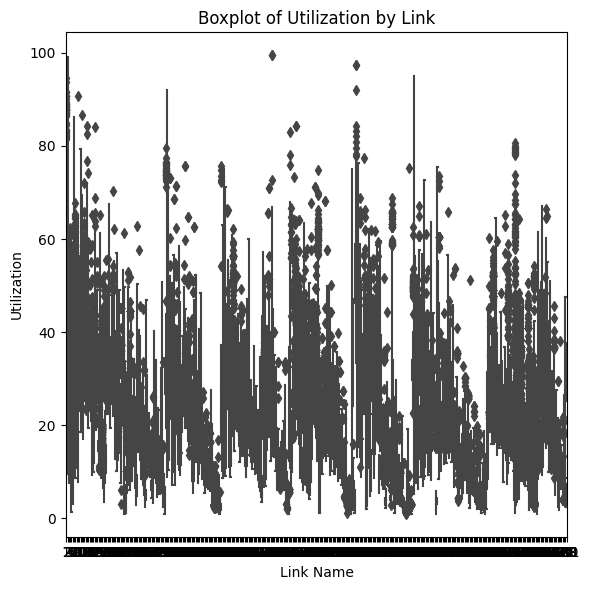

In [ ]:
# Step 4.1: Boxplot
plt.figure(figsize=(6, 6))
sns.boxplot(x='Link Name', y='Utilization', data=links_data)
plt.title('Boxplot of Utilization by Link')
plt.xlabel('Link Name')
plt.ylabel('Utilization')
plt.tight_layout()
plt.show()

The boxplot above shows the statistical summary of utilization for each link.

- Link 1: This link has a median utilization around 70, with a few outliers on the lower side. The data is slightly skewed towards higher utilization values.

- Link 2: This link has a median utilization slightly below 70. It has a fairly symmetrical distribution of utilization values with a few outliers on both the lower and higher side.

- Link 3: The median utilization for this link is around 65. The data for this link is more spread out compared to the other links, and it has a few outliers on the lower side.

IndexError: ignored

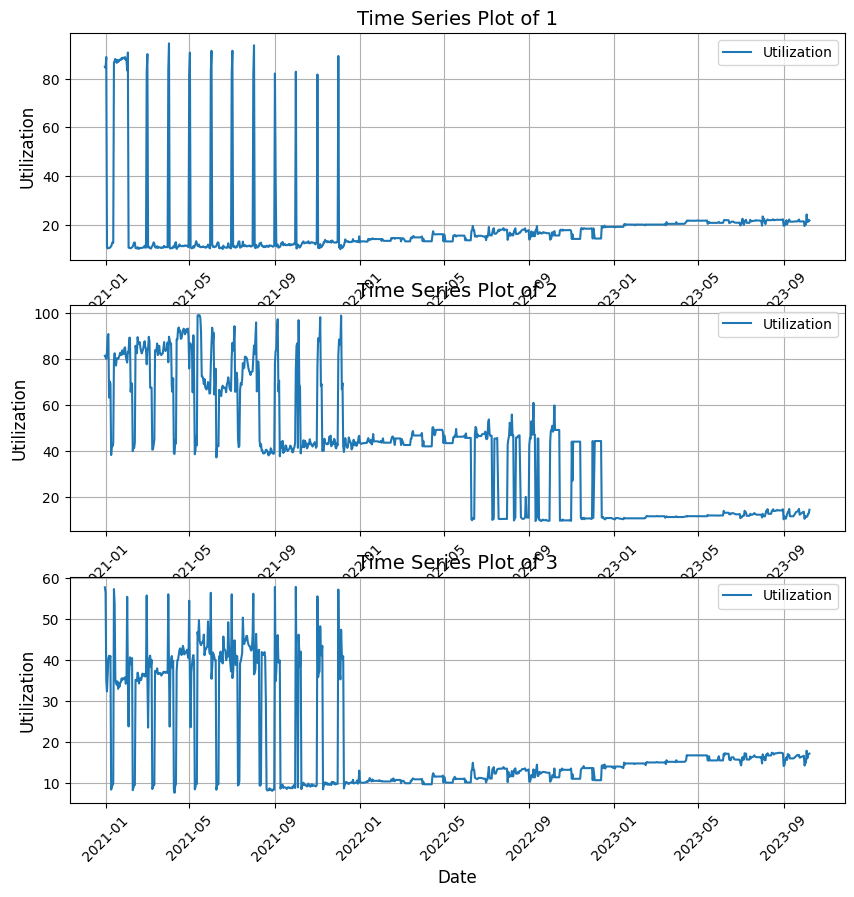

In [ ]:
# Create separate time series plots for each link with legends
fig, axes = plt.subplots(3, 1, figsize=(10, 10))

# List of unique link names
link_names = links_data['Link Name'].unique()

# Loop through the link names and create separate plots with legends
for i, link_name in enumerate(link_names):
    link_data = links_data[links_data['Link Name'] == link_name]
    sns.lineplot(x='Date', y='Utilization', data=link_data, ax=axes[i], label='Utilization')
    axes[i].set_title(f'Time Series Plot of {link_name}', fontsize=14)
    axes[i].set_xlabel('Date', fontsize=12)
    axes[i].set_ylabel('Utilization', fontsize=12)
    #axes[i].legend(loc='upper right')
    axes[i].grid(True)
    axes[i].tick_params(axis='x', rotation=45)

# Adjust the layout
plt.tight_layout()
plt.show()


The time series plot above shows the utilization over time for each link.

We can observe certain trends and fluctuations in the utilization over time.

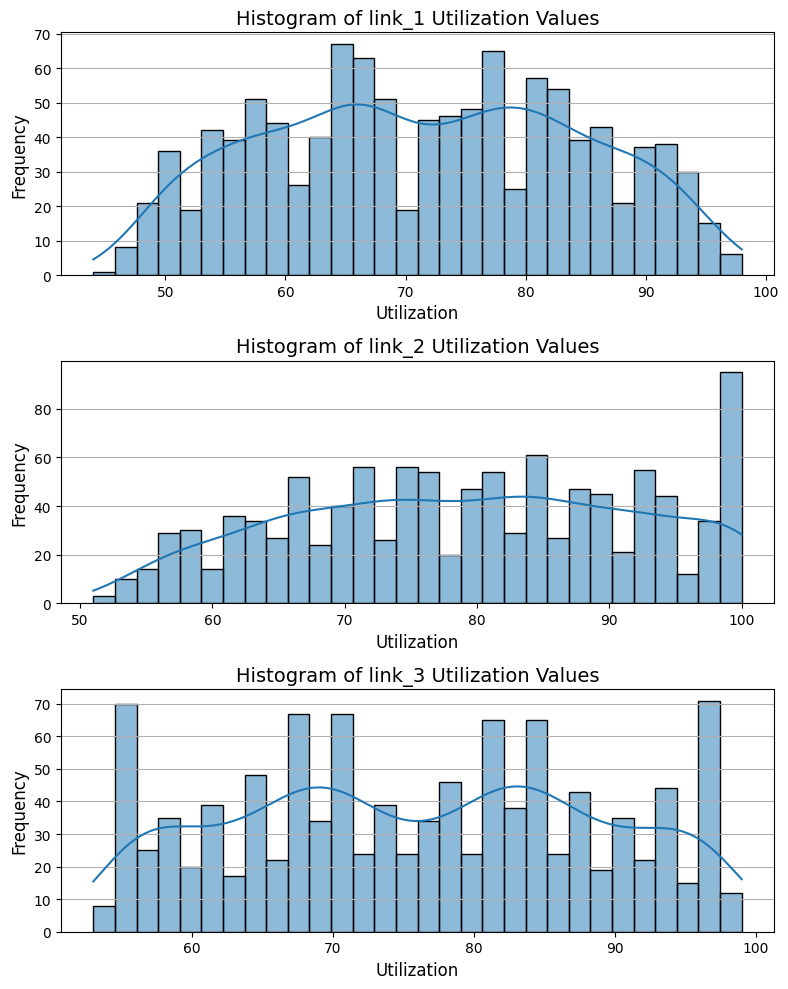

In [ ]:
# Create separate histogram plots for each link using subplots
fig, axes = plt.subplots(3, 1, figsize=(8, 10))

# Loop through the link names and create separate histograms
for i, link_name in enumerate(link_names):
    link_data = links_data[links_data['Link Name'] == link_name]
    sns.histplot(link_data['Utilization'], bins=30, kde=True, ax=axes[i])
    axes[i].set_title(f'Histogram of {link_name} Utilization Values', fontsize=14)
    axes[i].set_xlabel('Utilization', fontsize=12)
    axes[i].set_ylabel('Frequency', fontsize=12)
    axes[i].grid(axis='y')

# Adjust the layout
plt.tight_layout()
plt.show()


For Link 1:

- The distribution of utilization values is slightly right-skewed, indicating that there are more days with higher utilization.

- The majority of the data points lie in the range of approximately 65 to 75, which seems to be the common operating range for this link.


For Link 2:

- The distribution seems to be fairly symmetrical, indicating a normal distribution. This means that the utilization values for most of the days are centered around the mean.

For Link 3:

- The distribution is slightly left-skewed, indicating that there are more days with lower utilization compared to higher utilization days.

- The most common utilization values are between approximately 60 and 65.

In [ ]:


def separate_link_dataframes(dataframe):
    """
    This function takes a dataframe as input and returns a dictionary of dataframes for each unique link.

    :param dataframe: The input dataframe with telecommunication link data.
    :return: A dictionary where keys are link names and values are dataframes corresponding to each unique link.
    """
    # Get the unique link names
    link_names = dataframe['Link Name'].unique()

    # Create a dictionary to store the dataframes for each link
    link_dataframes = {}

    # Loop through the link names and create separate dataframes for each link
    for link_name in link_names:
        link_dataframes[link_name] = dataframe[dataframe['Link Name'] == link_name]

    return link_dataframes


# Get individual data frames for each link
link_dataframes = separate_link_dataframes(links_data)


In [ ]:
link_dataframes

{1:            Date  Link Name MTX_M Hub_M  Utilization trend\Abrupt  \
 0    2020-12-31          1    MK  H085        84.91       Trend    
 1    2021-01-01          1    MK  H085        84.45       Trend    
 2    2021-01-02          1    MK  H085        88.93       Trend    
 3    2021-01-03          1    MK  H085        10.69       Trend    
 4    2021-01-04          1    MK  H085        10.28       Trend    
 ...         ...        ...   ...   ...          ...          ...   
 1009 2023-10-04          1    MK  H085        24.26       Trend    
 1010 2023-10-05          1    MK  H085        21.18       Trend    
 1011 2023-10-06          1    MK  H085        22.11       Trend    
 1012 2023-10-07          1    MK  H085        21.39       Trend    
 1013 2023-10-08          1    MK  H085        21.80       Trend    
 
          Capacity status  remain_percent  Day_Diff  num_non_continuous_days  
 0     No Capacity Change            57.0       NaN                    489.0  
 1     No

### Forcasting

#### Data Preparation

In [ ]:
# Get the data for Link 1 and set the date column as the index

link1_data = link_dataframes['link_1']
link1_data.set_index('Date', inplace=True)


In [ ]:
link1_data.head()

,Link Name,Utilization
Date,,
2020-01-01,link_1,48
2020-01-02,link_1,44
2020-01-03,link_1,50
2020-01-04,link_1,53
2020-01-05,link_1,50


#### Exploratory Data Analysis (EDA)

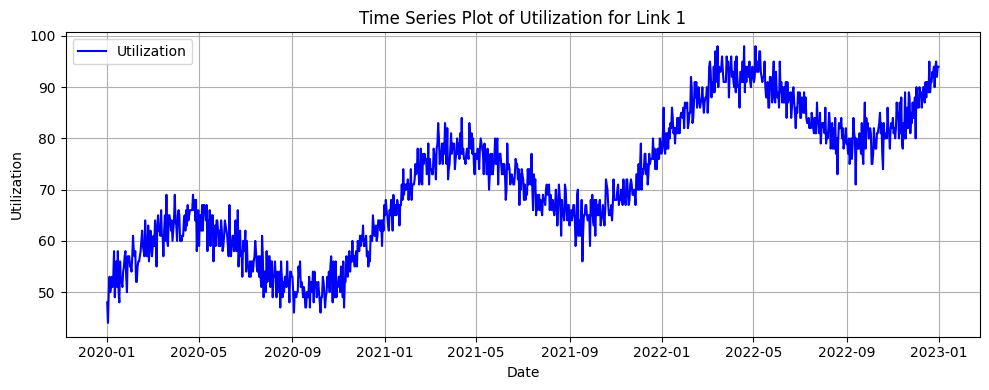

In [ ]:


# Plot the time series data for Link 1
plt.figure(figsize=(10, 4))
plt.plot(link1_data.index, link1_data['Utilization'], label='Utilization', color='blue')
plt.title('Time Series Plot of Utilization for Link 1')
plt.xlabel('Date')
plt.ylabel('Utilization')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


We can observe certain trends and fluctuations in the data, but it's relatively stable without any significant spikes or drops.

##### Augmented Dickey-Fuller (ADF) test

To build an ARIMA model, it's essential to ensure that the time series is stationary, i.e., its properties such as mean and variance remain constant over time. We can check for stationarity using the Augmented Dickey-Fuller (ADF) test.



In [ ]:
# Perform Augmented Dickey-Fuller test to check for stationarity
result = adfuller(link1_data['Utilization'])
adf_statistic = result[0]
p_value = result[1]
critical_values = result[4]

print(f"ADF Statistic:{adf_statistic} \n\nP_value: {p_value} \n\ncritical_values : {critical_values}")


ADF Statistic:-0.5691849914644109 

P_value: 0.8777940497721157 

critical_values : {'1%': -3.4363857496063455, '5%': -2.8642050392821794, '10%': -2.5681889563132314}


- Here, the ADF statistic is greater than the critical values at 1%, 5%, and 10% levels, and the p-value is greater than 0.05.

- This indicates that we fail to reject the null hypothesis that the time series has a unit root and is non-stationary

- To make the series stationary, we may need to differentiate it. Then, we can again check for stationarity.

ADF Statistic:-6.008067162706217 

P_value: 1.5977560142204965e-07 

critical_values : {'1%': -3.4364647646486093, '5%': -2.864239892228526, '10%': -2.5682075189699822}


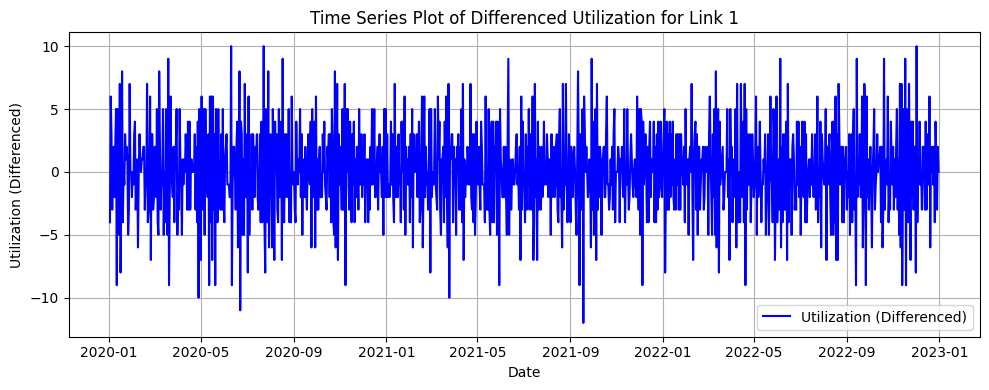

In [ ]:
# Differentiating the series to make it stationary
link1_data_diff = link1_data['Utilization'].diff().dropna()

# Performing ADF test again on the differentiated series
result_diff = adfuller(link1_data_diff)
adf_statistic_diff = result_diff[0]
p_value_diff = result_diff[1]
critical_values_diff = result_diff[4]

print(f"ADF Statistic:{adf_statistic_diff} \n\nP_value: {p_value_diff} \n\ncritical_values : {critical_values_diff}")

# Plotting the differentiated series
plt.figure(figsize=(10, 4))
plt.plot(link1_data_diff.index, link1_data_diff, label='Utilization (Differenced)', color='blue')
plt.title('Time Series Plot of Differenced Utilization for Link 1')
plt.xlabel('Date')
plt.ylabel('Utilization (Differenced)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()




The p-value has decreased compared to the original series, but it is still greater than 0.05, indicating that the series is still not stationary at the 95% confidence level.

We can try differentiating the series again or consider transforming the data in other ways (like logarithmic transformation) to achieve stationarity.

ADF Statistic:-16.099478726667673 

P_value: 5.150076552935324e-29 

critical_values : {'1%': -3.4364647646486093, '5%': -2.864239892228526, '10%': -2.5682075189699822}


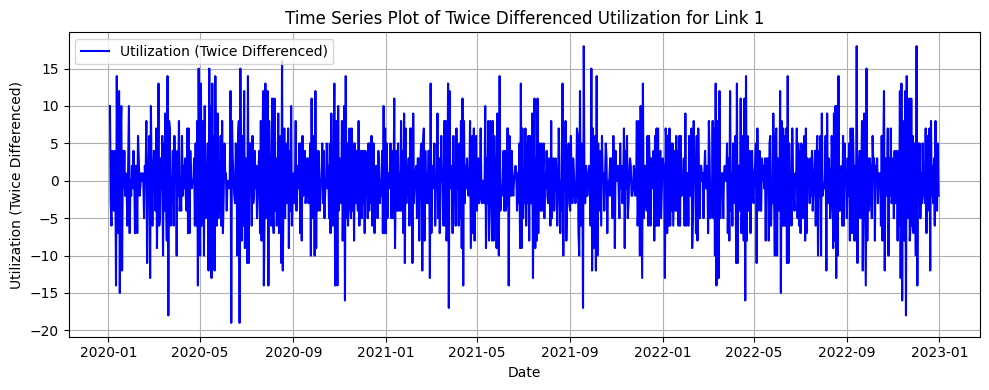

In [ ]:
# Differentiating the series again to make it stationary
link1_data_diff2 = link1_data_diff.diff().dropna()

# Performing ADF test again on the twice differentiated series
result_diff2 = adfuller(link1_data_diff2)
adf_statistic_diff2 = result_diff2[0]
p_value_diff2 = result_diff2[1]
critical_values_diff2 = result_diff2[4]

print(f"ADF Statistic:{adf_statistic_diff2} \n\nP_value: {p_value_diff2} \n\ncritical_values : {critical_values_diff2}")

# Plotting the twice differentiated series
plt.figure(figsize=(10, 4))
plt.plot(link1_data_diff2.index, link1_data_diff2, label='Utilization (Twice Differenced)', color='blue')
plt.title('Time Series Plot of Twice Differenced Utilization for Link 1')
plt.xlabel('Date')
plt.ylabel('Utilization (Twice Differenced)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



- After differentiating the series twice (i.e., computing the difference of differences between consecutive observations)

- The ADF statistic is less than the critical values at the 1%, 5%, and 10% levels, and the p-value is significantly less than 0.05. This indicates that we can reject the null hypothesis that the time series has a unit root, and we can consider the twice-differenced series to be stationary.

- With a stationary series, we can proceed to build the ARIMA model for forecasting. The order of differencing that we found to be effective is d=2.


#### Model Selection

Before we build the ARIMA model, we need to determine the appropriate values for the AR (p) and MA (q) components.

 We can use the ACF and PACF plots to determine these values.

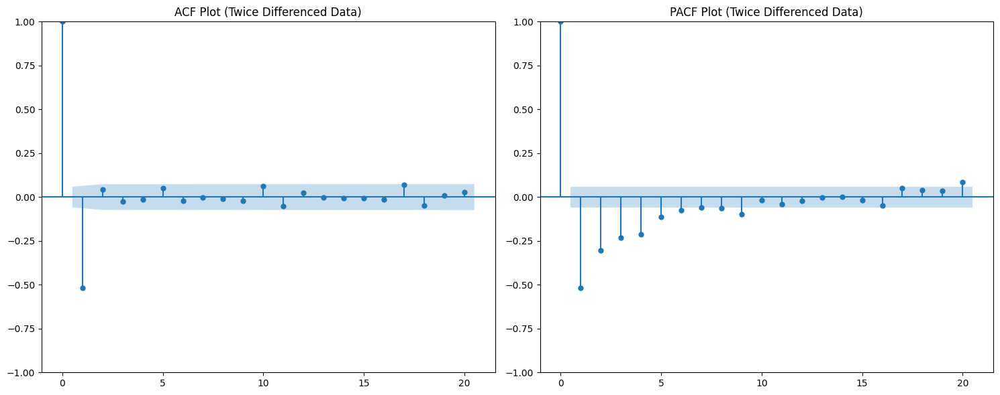

In [ ]:
# Plot ACF and PACF
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

# Plot ACF
plot_acf(link1_data_diff, lags=20, ax=ax[0])
ax[0].set_title('ACF Plot (Twice Differenced Data)')

# Plot PACF
plot_pacf(link1_data_diff, lags=20, ax=ax[1])
ax[1].set_title('PACF Plot (Twice Differenced Data)')

plt.tight_layout()
plt.show()


From the PACF plot, we see a significant spike at lag 1, and then it cuts off. This suggests that we can try using an AR(1) model.

From the ACF plot, we observe a gradual decline, which suggests a MA component might be necessary. We could start with a MA(1) model.

Therefore, as a starting point, we can try fitting an ARIMA model with p=1, d=2 (from our differencing step), and q=1.

In [ ]:
class ARIMAForecast():
    def __init__(self, dates, train_values, frequency, validation_values=None, forecast_test_peroid=0, seasonality=None):
        self.dates = dates
        self.train_values = train_values
        self.frequency = frequency
        self.validation_values = validation_values
        self.forecast_test_peroid = forecast_test_peroid
        self.seasonality = seasonality
        self.fitted_model = None
        self.forecasted_train = None
        self.forecasted_validation = None
        self.forecasted_test = None
        self.train_dates = self.dates[:len(self.train_values)].reset_index(drop=True)
        self.test_dates = None
        self.validation_dates = self.dates[len(self.train_values):].reset_index(drop=True)
        self.validation_len = len(validation_values)
        self.fitted_model = None

    # def decompose(self):
    #     # Perform seasonal decomposition
    #     decomposition = seasonal_decompose(self.train_values, model='multiplicative', period=self.seasonality)
    #     self.seasonal = decomposition.seasonal

    def fit(self, optimized=True):
        # You can access the seasonal component here if needed
        # if self.seasonal is None:
        #     self.decompose()

        # Fit ARIMA model using auto_arima
        model = pm.auto_arima(self.train_values,
                              start_p=1, start_q=1,d=1,

                               seasonal=False,
                               trace=False,
                              error_action='ignore',
                              suppress_warnings=True,
                              stepwise=True)

        self.fitted_model = model
        self.forecasted_train = model.predict_in_sample(start=1, end=len(self.train_values))

    def forecast(self):
        forecast_length = 0
        if len(self.validation_values) > 0:
            forecast_length += len(self.validation_values)
        if self.forecast_test_peroid != 0:
            forecast_length += self.forecast_test_peroid
            # start_date = self.dates.max() + pd.DateOffset(days=1)
            start_date = pd.Timestamp(self.dates.max()) + pd.DateOffset(days=1)
            self.test_dates = pd.date_range(start=start_date, periods=self.forecast_test_peroid, freq=self.frequency)

        # Generate forecasts
        forecast_values = self.fitted_model.predict(n_periods=forecast_length)
        self.forecasted_validation = forecast_values[:self.validation_len].reset_index(drop=True)
        self.forecasted_test = forecast_values[self.validation_len:].reset_index(drop=True)


#### Monthly_forcast

In [ ]:

monthly_Metrics_df, monthly_all_forecasted_values_df = forecast_links_utilization(monthly_links_utilization_df, 'M', 'Month_Full_Date', 5, seasonality=12)


ARIMA model forcast the link 1


ARIMA model forcast the link 2


ARIMA model forcast the link 3


ARIMA model forcast the link 4


ARIMA model forcast the link 5


ARIMA model forcast the link 6


ARIMA model forcast the link 7


ARIMA model forcast the link 8


ARIMA model forcast the link 9


ARIMA model forcast the link 10


ARIMA model forcast the link 11


ARIMA model forcast the link 12


ARIMA model forcast the link 13


ARIMA model forcast the link 14


ARIMA model forcast the link 15


ARIMA model forcast the link 16
ARIMA model forcast the link 17
ARIMA model forcast the link 18
ARIMA model forcast the link 19
ARIMA model forcast the link 20
ARIMA model forcast the link 21
ARIMA model forcast the link 22
ARIMA model forcast the link 23
ARIMA model forcast the link 24
ARIMA model forcast the link 25
ARIMA model forcast the link 26
ARIMA model forcast the link 27
ARIMA model forcast the link 28
ARIMA model forcast the link 29
ARIMA model forcast the link 30
ARIMA model forcast the link 31
ARIMA model forcast the link 32
ARIMA model forcast the link 33
ARIMA model forcast the link 34
ARIMA model forcast the link 35
ARIMA model forcast the link 36
ARIMA model forcast the link 37
ARIMA model forcast the link 38
ARIMA model forcast the link 39
ARIMA model forcast the link 40
ARIMA model forcast the link 41
ARIMA model forcast the link 42
ARIMA model forcast the link 43
ARIMA model forcast the link 44
ARIMA model forcast the link 45
ARIMA model forcast the link 46
ARIMA mo

In [ ]:
# Assuming scaled_df is your scaled dataframe
monthly_Metrics_df['Model_Name'] = 'ARIMA'
monthly_Metrics_df.to_csv('monthly_Metrics_df.csv', index=False)
monthly_Metrics_df.head()

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE,Model_Name
0,link 1,4.351223,22.520759,4.321418,19.822887,ARIMA
0,link 2,3.635253,9.579840,8.631822,57.065304,ARIMA
0,link 3,1.967036,20.492919,16.434535,92.792276,ARIMA
0,link 4,6.168218,21.533378,22.636819,69.886613,ARIMA
0,link 5,2.009449,26.937485,1.167236,7.453655,ARIMA


In [ ]:
monthly_all_forecasted_values_df['Model_Name'] = 'ARIMA'
monthly_all_forecasted_values_df.to_csv('monthly_all_forecasted_values_df.csv', index=False)
monthly_all_forecasted_values_df.head()

,DataSet Type,Link,Date,Forecasted_Utilization,Model_Name
0,Train,link 1,2020-12-31,84.913772,ARIMA
1,Train,link 1,2021-01-31,54.533163,ARIMA
2,Train,link 1,2021-02-28,-1.147515,ARIMA
3,Train,link 1,2021-03-31,23.737899,ARIMA
4,Train,link 1,2021-04-30,12.854051,ARIMA


#### Weekly_forcast


In [ ]:
weekly_Metrics_df, weekly_all_forecasted_values_df = forecast_links_utilization(weekly_links_utilization_df, 'W', 'Week_Full_Date', 12, seasonality=7)
weekly_Metrics_df,

ARIMA model forcast the link 1


ARIMA model forcast the link 2


ARIMA model forcast the link 3


ARIMA model forcast the link 4


ARIMA model forcast the link 5


ARIMA model forcast the link 6


ARIMA model forcast the link 7


ARIMA model forcast the link 8


ARIMA model forcast the link 9


ARIMA model forcast the link 10


ARIMA model forcast the link 11


ARIMA model forcast the link 12


ARIMA model forcast the link 13


ARIMA model forcast the link 14


ARIMA model forcast the link 15


ARIMA model forcast the link 16
ARIMA model forcast the link 17
ARIMA model forcast the link 18
ARIMA model forcast the link 19
ARIMA model forcast the link 20
ARIMA model forcast the link 21
ARIMA model forcast the link 22
ARIMA model forcast the link 23
ARIMA model forcast the link 24
ARIMA model forcast the link 25
ARIMA model forcast the link 26
ARIMA model forcast the link 27
ARIMA model forcast the link 28
ARIMA model forcast the link 29
ARIMA model forcast the link 30
ARIMA model forcast the link 31
ARIMA model forcast the link 32
ARIMA model forcast the link 33
ARIMA model forcast the link 34
ARIMA model forcast the link 35
ARIMA model forcast the link 36
ARIMA model forcast the link 37
ARIMA model forcast the link 38
ARIMA model forcast the link 39
ARIMA model forcast the link 40
ARIMA model forcast the link 41
ARIMA model forcast the link 42
ARIMA model forcast the link 43
ARIMA model forcast the link 44
ARIMA model forcast the link 45
ARIMA model forcast the link 46
ARIMA mo

(        Link    Trian RMSE  Train MAPE  Validation RMSE  Validation MAPE
 0     link 1  8.887215e+00   37.976053         4.198833        19.286604
 0     link 2  1.181285e+01   19.352705         7.956435        52.125601
 0     link 3  5.171745e+00   27.159176         3.063858        18.431533
 0     link 4  3.911105e+00   16.904972         3.626267         9.049698
 0     link 5  8.263767e-01   20.084922         1.924326        11.969055
 ..       ...           ...         ...              ...              ...
 0   link 384  5.746970e-01    3.871128         1.160809         7.652929
 0   link 385  1.489860e-12   10.991571         0.521415         4.844960
 0   link 386  1.827409e+00    8.354833         4.328577        18.832309
 0   link 387  3.881888e+00   22.709774         2.231391         4.616884
 0   link 388  1.808890e-01    4.786407         0.460185         7.313894
 
 [388 rows x 5 columns],)

In [ ]:
weekly_Metrics_df['Model_Name'] = 'ARIMA'
weekly_Metrics_df.to_csv('weekly_Metrics_df.csv', index=False)
weekly_Metrics_df.head()

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE,Model_Name
0,link 1,8.887215,37.976053,4.198833,19.286604,ARIMA
0,link 2,11.812849,19.352705,7.956435,52.125601,ARIMA
0,link 3,5.171745,27.159176,3.063858,18.431533,ARIMA
0,link 4,3.911105,16.904972,3.626267,9.049698,ARIMA
0,link 5,0.826377,20.084922,1.924326,11.969055,ARIMA


In [ ]:
weekly_all_forecasted_values_df['Model_Name'] = 'ARIMA'
weekly_all_forecasted_values_df.to_csv('weekly_all_forecasted_values_df.csv', index=False)
weekly_all_forecasted_values_df.head()

,DataSet Type,Link,Date,Forecasted_Utilization,Model_Name
0,Train,link 1,2020-12-28,67.242983,ARIMA
1,Train,link 1,2021-01-04,19.139892,ARIMA
2,Train,link 1,2021-01-11,70.075883,ARIMA
3,Train,link 1,2021-01-18,98.380938,ARIMA
4,Train,link 1,2021-01-25,40.880464,ARIMA


#### Daily_forcast

In [ ]:
daily_Metrics_df, daily_all_forecasted_values_df = forecast_links_utilization(daily_links_utilization_df, 'd', 'DateTime', 50, seasonality=3)



ARIMA model forcast the link 1


ARIMA model forcast the link 2


ARIMA model forcast the link 3


ARIMA model forcast the link 4


ARIMA model forcast the link 5


ARIMA model forcast the link 6


ARIMA model forcast the link 7


ARIMA model forcast the link 8


ARIMA model forcast the link 9


ARIMA model forcast the link 10


ARIMA model forcast the link 11


ARIMA model forcast the link 12


ARIMA model forcast the link 13


ARIMA model forcast the link 14


ARIMA model forcast the link 15


ARIMA model forcast the link 16
ARIMA model forcast the link 17
ARIMA model forcast the link 18
ARIMA model forcast the link 19
ARIMA model forcast the link 20
ARIMA model forcast the link 21
ARIMA model forcast the link 22
ARIMA model forcast the link 23
ARIMA model forcast the link 24
ARIMA model forcast the link 25
ARIMA model forcast the link 26
ARIMA model forcast the link 27
ARIMA model forcast the link 28
ARIMA model forcast the link 29
ARIMA model forcast the link 30
ARIMA model forcast the link 31
ARIMA model forcast the link 32
ARIMA model forcast the link 33
ARIMA model forcast the link 34
ARIMA model forcast the link 35
ARIMA model forcast the link 36
ARIMA model forcast the link 37
ARIMA model forcast the link 38
ARIMA model forcast the link 39
ARIMA model forcast the link 40
ARIMA model forcast the link 41
ARIMA model forcast the link 42
ARIMA model forcast the link 43
ARIMA model forcast the link 44
ARIMA model forcast the link 45
ARIMA model forcast the link 46
ARIMA mo

In [ ]:
daily_Metrics_df['Model_Name'] = 'ARIMA'
daily_Metrics_df.to_csv('daily_Metrics_df.csv', index=False)
daily_Metrics_df.head()

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE,Model_Name
0,link 1,5.828171,25.641724,4.470756,20.811376,ARIMA
0,link 2,1.102012,12.011355,32.159258,268.686943,ARIMA
0,link 3,2.936523,21.562662,11.028853,64.075960,ARIMA
0,link 4,4.422301,15.788281,8.566580,26.286785,ARIMA
0,link 5,2.268138,14.003188,2.742666,11.888041,ARIMA


In [ ]:
daily_all_forecasted_values_df['Model_Name'] = 'ARIMA'
daily_all_forecasted_values_df.to_csv('daily_all_forecasted_values_df.csv', index=False)
daily_all_forecasted_values_df.head()

,DataSet Type,Link,Date,Forecasted_Utilization,Model_Name
0,Train,link 1,2020-12-31,84.907680,ARIMA
1,Train,link 1,2021-01-01,84.513983,ARIMA
2,Train,link 1,2021-01-02,88.194840,ARIMA
3,Train,link 1,2021-01-03,27.240341,ARIMA
4,Train,link 1,2021-01-04,38.321766,ARIMA


## MLP

### 4.1 Model Blue Print

In [ ]:
class MLP():
    def __init__(self, dates, x_train_values, y_train_values,
                 frequency, x_validation_values=None, y_validation_values=None, forecast_test_peroid=0, look_back=1):
        self.dates = dates
        self.look_back = look_back
        self.x_train_values = x_train_values
        self.y_train_values = y_train_values
        self.frequency = frequency
        self.x_validation_values = x_validation_values
        self.y_validation_values = y_validation_values
        self.forecast_test_peroid = forecast_test_peroid
        self.fitted_model = Sequential()
        self.__forecasted_validation_and_test = None
        self.forecasted_train = None
        self.forecasted_validation = None
        self.forecasted_test = np.array([])
        self.train_dates = self.dates[look_back:len(self.x_train_values) + look_back].reset_index(drop=True)
        #print(self.train_dates)
        self.test_dates = None
        self.validation_dates = self.dates[len(self.x_train_values) + 2*look_back:].reset_index(drop=True)
        self.validation_len = len(self.x_validation_values)
        self.train_and_validation_x_data = np.concatenate((self.x_train_values, self.x_validation_values))
    def add(self, dense):
        self.fitted_model.add(dense)
    def compile(self, los='mean_squared_error', optimize='adam'):
        self.fitted_model.compile(loss=los, optimizer=optimize)
    def fit(self, X_train, y_train, epochs=100, batch_size=1, verbose=1):
        self.fitted_model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=verbose)

    def predict(self, x=[]):
        predicted_values = None
        if len(x) > 0:
            predicted_values = self.fitted_model.predict(x)
        self.forecasted_train = self.fitted_model.predict(self.x_train_values).ravel()
        # print(f"forecasted Train_class {self.forecasted_train}")
        if len(self.x_validation_values) > 0:
            self.forecasted_validation = self.fitted_model.predict(self.x_validation_values).ravel()
        last_value_index = len(self.x_train_values)
        #forecast_length = len(self.x_train_values)
        #if len(self.validation_values) > 0:
        #    forecast_length += len(self.validation_values)
        if self.forecast_test_peroid != 0:
            #forecast_length += self.forecast_test_peroid
            start_date = self.dates.max() + datetime.timedelta(days=1)
            self.test_dates = pd.date_range(start=start_date, periods=self.forecast_test_peroid, freq=self.frequency)
        #print("Train: ")
        #print(self.x_train_values)
        #print("Train and Validation: ")
        #print(self.train_and_validation_x_data)
        x_test = self.train_and_validation_x_data[-1]
        #print(f"x_test: {np.array([list(x_test)])}")

        for i in range(self.forecast_test_peroid):
            #print(f"x_test: {np.array([list(x_test)])}")
            #x_test = np.reshape(x_test, (-1, 1))
            x_test = np.array([list(x_test)])
            predicted_test = self.fitted_model.predict(x_test, verbose=0)
            #print(f"predicted test: {predicted_test}")
            self.forecasted_test = np.append(self.forecasted_test, predicted_test)
            x_test = x_test[-1][1:]
            x_test = np.append(x_test, predicted_test)
        return predicted_values

### 4.2 Model Creation And Prediction

In [ ]:

def forecast_links_utilization_MLP(links_df, frequency, date_column_name, forecasted_peroid, look_back=1, epochs=100, batch_size=1, validation_split_percent=0.7):
    # create Metrics dataframe to save metrics of validation and train on it.
    Metrics_df = pd.DataFrame({'Link': [], 'Trian RMSE': [], 'Train MAPE': [], 'Validation RMSE': [], 'Validation MAPE': []})
    all_forecasted_values_df = pd.DataFrame({'DataSet Type':[],'Link':[], 'Date':[], 'Forecasted_Utilization':[]})
    for link_no in range(len(links_df)):
        # train and validation split
        train, validation = ModelingUtilities.train_validation_split(links_df[link_no], validation_split_percent)
#         print(pd.DataFrame(validation['Utilization']))
        X_train, y_train = Preprocessor.create_dataset_for_machine_learning_model(pd.DataFrame(train['Utilization']).values, look_back=look_back)
        X_val, y_val = Preprocessor.create_dataset_for_machine_learning_model(pd.DataFrame(validation['Utilization']).values, look_back=look_back)
        model = MLP(links_df[link_no][date_column_name], X_train, y_train, frequency, X_val, y_val, forecasted_peroid, look_back)
        model.add(Dense(50, input_dim=look_back, activation='relu'))
        model.add(Dense(25, activation='relu'))
        model.add(Dense(1))
        model.compile(los='mean_squared_error', optimize='adam')
        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)
        model.predict()

        # calculate the root mean squre error and mean absoulte precentage error for train and validation
        rmse_train = ModelingUtilities.rmse(train['Utilization'][look_back:], model.forecasted_train)

        #np.sqrt(mean_squared_error(y_true, y_pred))
        rmse_validation = ModelingUtilities.rmse(validation['Utilization'][look_back:], model.forecasted_validation)
        #rmse_validation = np.sqrt(mean_squared_error(y_true, y_pred))
        #print(exp.forecasted_validation)
        # print("Train: ")
        # print(train['Utilization'][look_back:])
        # print("\n Forecasted Train: ")
        # print(model.forecasted_train)

        mape_train = ModelingUtilities.mape(pd.Series(train['Utilization'][look_back:]), pd.Series(model.forecasted_train))
        mape_validation = ModelingUtilities.mape(pd.Series(validation['Utilization'][look_back:]), pd.Series(model.forecasted_validation))

        temp_df = pd.DataFrame([['link {}'.format(link_no + 1), rmse_train, mape_train, rmse_validation, mape_validation, 'MLP', model]], columns=['Link','Trian RMSE','Train MAPE', 'Validation RMSE', 'Validation MAPE', 'Model Name', 'Model Object'])
        Metrics_df = pd.concat([Metrics_df, temp_df])

        # creating forecasted_values_df to save all forecasted values on it.
        train_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Train', 'link {}'.format(link_no + 1), model.train_dates, model.forecasted_train)
        validation_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Validation','link {}'.format(link_no + 1), model.validation_dates, model.forecasted_validation)
        test_forecasted_values_df = ModelingUtilities.create_forcaseted_values_df('Test', 'link {}'.format(link_no + 1), model.test_dates, model.forecasted_test)

        all_forecasted_values_df = pd.concat([all_forecasted_values_df, train_forecasted_values_df, validation_forecasted_values_df, test_forecasted_values_df])
        # ploting the actual, train, validation and test data
        actual_data_dates = links_df[link_no][date_column_name]
        actual_values = links_df[link_no]['Utilization']
        if link_no > 15:
          continue
        ModelingUtilities.plot('Utilization', f'MLP - Link {link_no+1}',
                               actual_data_dates, actual_values,
                               model.train_dates, model.forecasted_train,
                               model.validation_dates, model.forecasted_validation,
                               model.test_dates, model.forecasted_test
                              )
    all_forecasted_values_df = all_forecasted_values_df.reset_index(drop=True)

    return Metrics_df, all_forecasted_values_df


In [ ]:
monthly_Metrics_df, monthly_all_forecasted_values_df = forecast_links_utilization_MLP(links_df=monthly_links_utilization_df, frequency='M',
                                                                                      date_column_name='Month_Full_Date', forecasted_peroid=5,
                                                                                      look_back=4, epochs=100,batch_size=1, validation_split_percent=0.7)

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 38ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


In [ ]:
monthly_Metrics_df

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE,Model Name,Model Object
0,link 1,0.975555,6.344099,0.734941,5.339138,MLP,<__main__.MLP object at 0x7a9741b92d70>
0,link 2,5.955305,18.774817,1.120885,2.344698,MLP,<__main__.MLP object at 0x7a97433e16f0>
0,link 3,3.713059,21.172177,0.807387,1.557569,MLP,<__main__.MLP object at 0x7a972f27d270>
0,link 4,0.888267,12.422947,3.186392,15.805439,MLP,<__main__.MLP object at 0x7a972d830dc0>
0,link 5,3.239403,24.770939,1.468626,12.170837,MLP,<__main__.MLP object at 0x7a972deefeb0>
...,...,...,...,...,...,...,...
0,link 384,0.390289,10.268211,0.480258,7.393726,MLP,<__main__.MLP object at 0x7a958f337190>
0,link 385,1.418458,16.704369,0.619061,11.649256,MLP,<__main__.MLP object at 0x7a958e6df160>
0,link 386,0.848371,26.308708,1.215713,11.509936,MLP,<__main__.MLP object at 0x7a958e6df0a0>
0,link 387,1.263342,13.312346,1.941262,8.783907,MLP,<__main__.MLP object at 0x7a958e46a8f0>


In [ ]:
monthly_all_forecasted_values_df

In [ ]:
daily_Metrics_df, daily_all_forecasted_values_df = forecast_links_utilization_MLP(links_df=daily_links_utilization_df, frequency='d',
                                                                                      date_column_name='DateTime', forecasted_peroid=50,
                                                                                      look_back=100, epochs=100,batch_size=1, validation_split_percent=0.7)

7/7 [==============================] - 0s 3ms/step


7/7 [==============================] - 0s 2ms/step


7/7 [==============================] - 0s 2ms/step


7/7 [==============================] - 0s 4ms/step


7/7 [==============================] - 0s 2ms/step


7/7 [==============================] - 0s 3ms/step


7/7 [==============================] - 0s 3ms/step


7/7 [==============================] - 0s 2ms/step


7/7 [==============================] - 0s 3ms/step


7/7 [==============================] - 0s 4ms/step


7/7 [==============================] - 0s 3ms/step


7/7 [==============================] - 0s 3ms/step


7/7 [==============================] - 0s 3ms/step


7/7 [==============================] - 0s 3ms/step


7/7 [==============================] - 0s 4ms/step


7/7 [==============================] - 0s 6ms/step


7/7 [==============================] - 0s 4ms/step


In [ ]:
daily_Metrics_df

,Link,Trian RMSE,Train MAPE,Validation RMSE,Validation MAPE
0,link 1,2.746446,15.880368,3.426912,8.608478
0,link 2,4.221375,14.490411,4.370272,7.612354
0,link 3,0.838502,14.855076,0.870105,8.056739


In [ ]:
daily_Metrics_df.mean()

Trian RMSE          2.602107
Train MAPE         15.075285
Validation RMSE     2.889096
Validation MAPE     8.092524
dtype: float64

In [ ]:
daily_all_forecasted_values_df

,DataSet Type,Link,Date,Forecasted_Utilization
0,Train,link 1,2020-04-10,61.567623
1,Train,link 1,2020-04-11,61.950798
2,Train,link 1,2020-04-12,62.692047
3,Train,link 1,2020-04-13,64.130280
4,Train,link 1,2020-04-14,61.803822
...,...,...,...,...
2833,Test,link 3,2023-02-15,110.850189
2834,Test,link 3,2023-02-16,111.123795
2835,Test,link 3,2023-02-17,111.408241
2836,Test,link 3,2023-02-18,111.599045


In [ ]:


weekly_Metrics_df, weekly_all_forecasted_values_df = forecast_links_utilization_MLP(links_df=weekly_links_utilization_df, frequency='W',
                                                                                      date_column_name='Week_Full_Date', forecasted_peroid=5,
                                                                                      look_back=15, epochs=100,batch_size=1, validation_split_percent=0.7)

1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 17ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 22ms/step


In [ ]:
weekly_Metrics_df.to_csv('MLP_Weekly.csv')

## KMeans

#### Utilities

In [ ]:
def create_link_dataframes(data_frame, start_date, end_date):
    # Filter the data frame for the specified time range
    data_frame['Date'] = pd.to_datetime(data_frame['Date'])
    filtered_data = data_frame[(data_frame['Date'] >= start_date) & (data_frame['Date'] <= end_date)]

    # Create an empty dictionary to store DataFrames for each link
    links_dataframes = {}

    # Loop through unique Link_Names and create DataFrames
    unique_links = sorted(filtered_data['Link Name'].unique())

    # Create a list to store the names of the series
    allMySeries = []

    for link in unique_links:
        link_df = filtered_data[filtered_data['Link Name'] == link][['Date', 'Utilization']]
        links_dataframes[link] = link_df

        # Append the Link_Name to the list
        allMySeries.append(link)

    # Create a list to store all DataFrames
    all_Series = []

    # Loop over all links, add their respective DataFrames to the list
    for link_name, link_df in links_dataframes.items():
        link_df.set_index('Date', inplace=True)

        # Add the DataFrame to the list
        all_Series.append(link_df)

    # Sort the names of MySeries in ascending order
    allMySeries.sort()

    return all_Series, allMySeries

In [ ]:
def plot_link_by_number(link_number, all_Series, allMySeries, start_date, end_date):
    # Check if all_Series is empty or not
    if len(all_Series) == 0:
        print("The 'all_Series' list is empty. Make sure you have populated it.")
    else:
        if 1 <= link_number <= 388:
            link_name = allMySeries[link_number - 1]  # Adjust for 0-based indexing
            link_df = all_Series[link_number - 1]  # Adjust for 0-based indexing

            # Extract the data in the specified time period
            link_df = link_df[(link_df.index >= start_date) & (link_df.index <= end_date)]

            fig, axs = plt.subplots(figsize=(10, 5))
            axs.plot(link_df.index, link_df['Utilization'])
            axs.set_title(f"Link {link_name}")
            axs.set_xlabel('Date')
            axs.set_ylabel('Utilization')
            axs.grid(True)
            plt.show()
        else:
            print("Link number should be between 1 and 388.")

In [ ]:
def cluster_time_period(data, start_date, end_date):
    # Create a new list of data frames by filtering all_Series
    filtered_series_list = [df.loc[start_date:end_date] for df in all_Series]
    # check if our data is uniform in length
    ser_lengs = {len(series) for series in filtered_series_list}

    # find the longest series of the series and elongate others according to that
    max_len = max(ser_lengs)
    longest_series = None
    for series in filtered_series_list:
        if len(series) == max_len:
            longest_series = series

    # reindex the series that are not as long as the longest one and fill the empty dates with np.nan
    problems_index = []

    for i in range(len(filtered_series_list)):
        if len(filtered_series_list[i])!= max_len:
            problems_index.append(i)
            filtered_series_list[i] = filtered_series_list[i].reindex(longest_series.index)

    # check how many series are polluted with nan values with this function
    def nan_counter(list_of_series):
        nan_polluted_series_counter = 0
        for series in list_of_series:
            if series.isnull().sum().sum() > 0:
                nan_polluted_series_counter+=1
        print(nan_polluted_series_counter)

    for i in problems_index:
      filtered_series_list[i].interpolate(limit_direction="both",inplace=True)


    # Create a MinMaxScaler instance
    scaler = MinMaxScaler()

    for i in range(len(filtered_series_list)):
        # Extract the 'Utilization' column for scaling
        utilization_values = filtered_series_list[i]['Utilization'].values.reshape(-1, 1)

        # Apply MinMax scaling to the 'Utilization' column
        scaled_values = scaler.fit_transform(utilization_values)

        # Replace the 'Utilization' column with scaled values
        filtered_series_list[i]['Utilization'] = scaled_values

        # we can reshape the 'Utilization' column to a 1D array
        filtered_series_list[i] = filtered_series_list[i]['Utilization'].values.reshape(-1)


    cluster_count = math.ceil(math.sqrt(len(filtered_series_list)))
    km = TimeSeriesKMeans(n_clusters=cluster_count, metric="euclidean")
    labels = km.fit_predict(filtered_series_list)


    som_x = som_y = math.ceil(math.sqrt(math.sqrt(len(filtered_series_list))))

    plot_count = math.ceil(math.sqrt(cluster_count))

    fig, axs = plt.subplots(plot_count, plot_count, figsize=(20, 20))
    fig.suptitle('Clusters')

    for ax in axs.ravel():
        ax.grid(True)

    row_i = 0
    column_j = 0

    # For each label there is, plots every series with that label
    for label in set(labels):
        cluster = []
        for i in range(len(labels)):
            if labels[i] == label:
                axs[row_i, column_j].plot(filtered_series_list[i], c="gray", alpha=0.4)
                cluster.append(filtered_series_list[i])
        if len(cluster) > 0:
            axs[row_i, column_j].plot(np.average(np.vstack(cluster), axis=0), c="red")
        axs[row_i, column_j].set_title("Cluster " + str(row_i * som_y + column_j))
        column_j += 1
        if column_j % plot_count == 0:
            row_i += 1
            column_j = 0

    plt.show()
    return labels, filtered_series_list

In [ ]:
def plot_link_and_cluster(link_number, all_Series, allMySeries, labels, start_date, end_date):
    # Check if all_Series is empty or not
    if len(all_Series) == 0:
        print("The 'all_Series' list is empty. Make sure you have populated it.")
    else:
        if 1 <= link_number <= 388:
            link_name = allMySeries[link_number - 1]  # Adjust for 0-based indexing
            cluster_label = labels[link_number - 1]  # Get the cluster label of the link

            # Print the cluster information
            print(f"Link {link_name} belongs to (Cluster {cluster_label}):")

            # Extract all other links in the same cluster
            cluster_indices = [i for i, label in enumerate(labels) if label == cluster_label]
            print(f"These are all links in Cluster {cluster_label}: {cluster_indices}")
            for idx in cluster_indices:
                if 1 <= idx + 1 <= 388:
                    link_df = all_Series[idx]
                    link_name = allMySeries[idx]

                    # Extract the data in the specified time period
                    link_df = link_df[(link_df.index >= start_date) & (link_df.index <= end_date)]

                    # Plot the link
                    fig, axs = plt.subplots(figsize=(10, 5))
                    axs.plot(link_df.index, link_df['Utilization'])
                    axs.set_title(f"Link {link_name}")
                    axs.set_xlabel('Date')
                    axs.set_ylabel('Utilization')
                    axs.grid(True)
                    plt.show()
        else:
            print("Link number should be between 1 and 388.")

### Weekly Clustering

In [ ]:
link_number_to_plot = 10
start_date = '2022-01-31'
end_date = '2023-09-30'

In [ ]:
all_links = pd.read_csv('388_links_weekly_after_prepro.csv').reset_index(drop=True)
all_Series, allMySeries = create_link_dataframes(all_links, start_date, end_date)

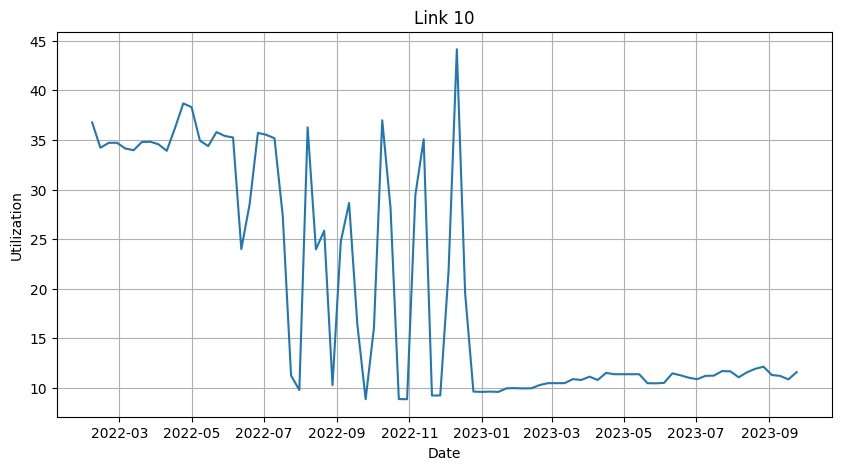

In [ ]:
plot_link_by_number(link_number_to_plot, all_Series, allMySeries, start_date, end_date)

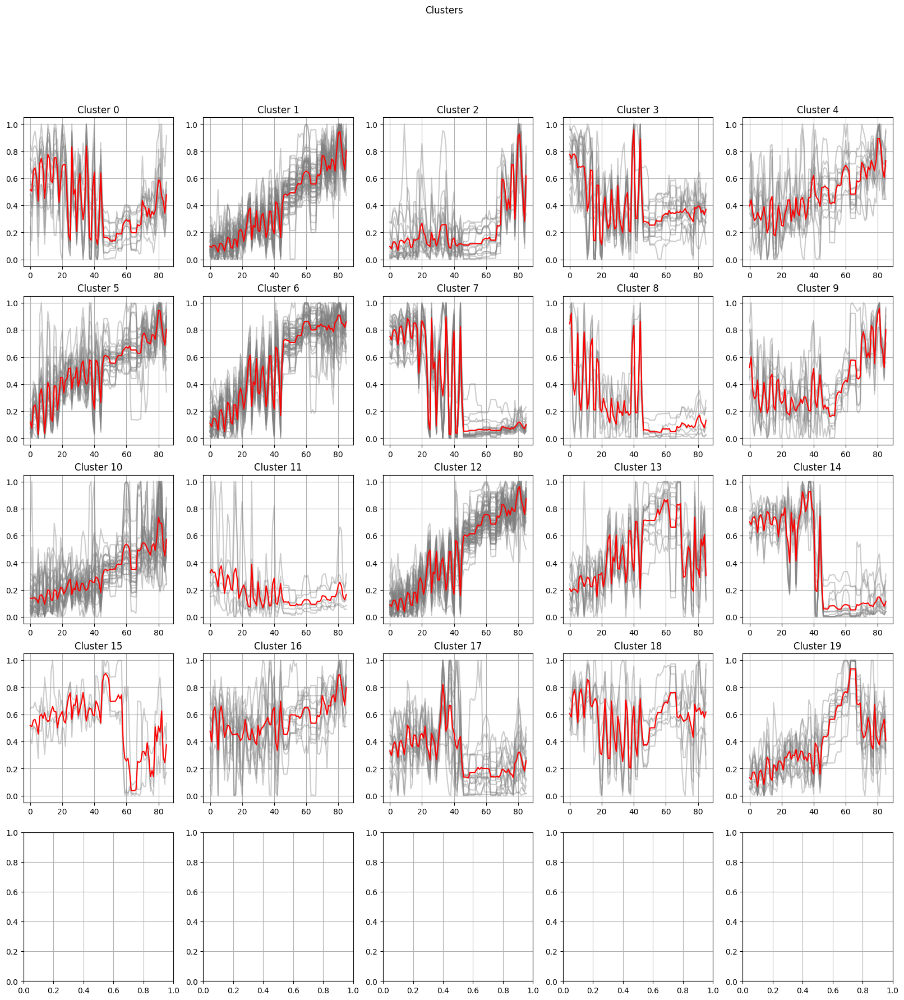

In [ ]:
labels, filtered_series_list = cluster_time_period(all_Series, start_date, end_date)

Link 10 belongs to (Cluster 7):
These are all links in Cluster 7: [1, 9, 11, 21, 26, 33, 78, 79, 88, 91, 121, 123, 173, 181, 182, 184, 225, 233, 275, 312, 368]


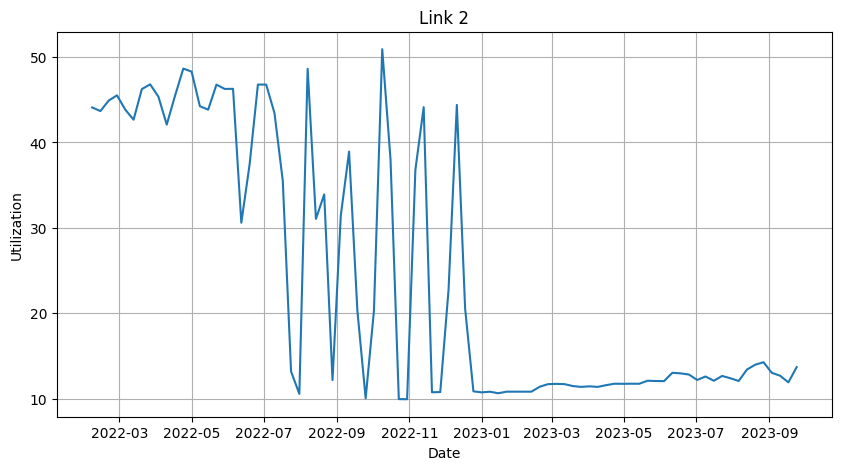

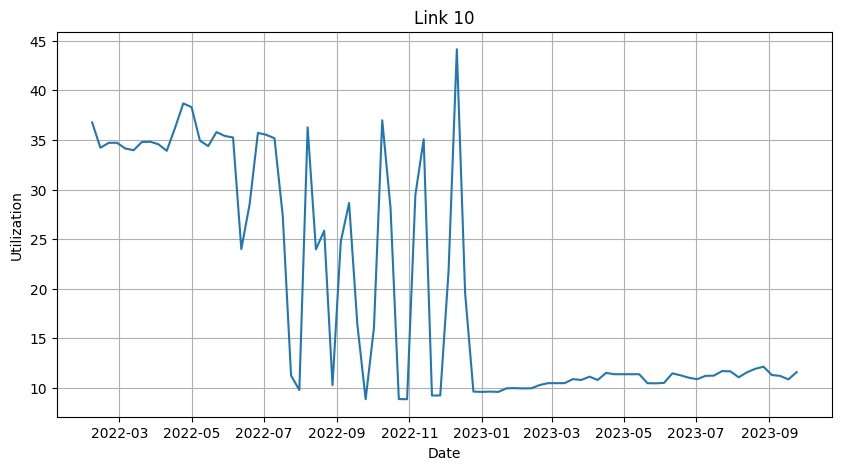

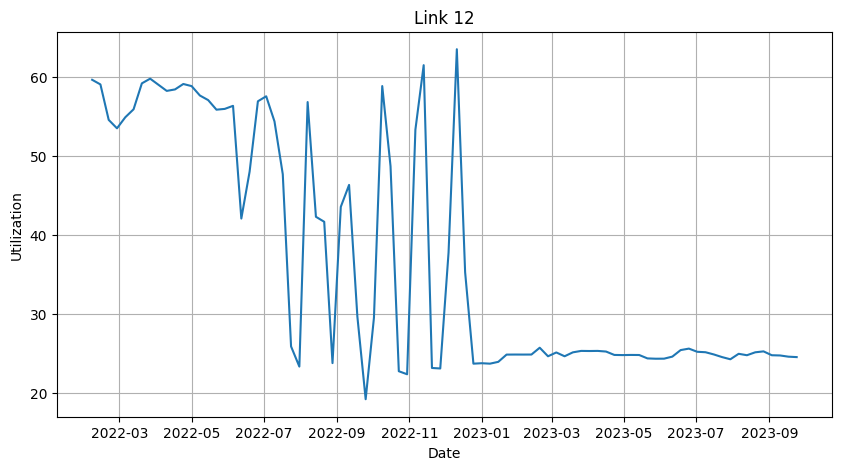

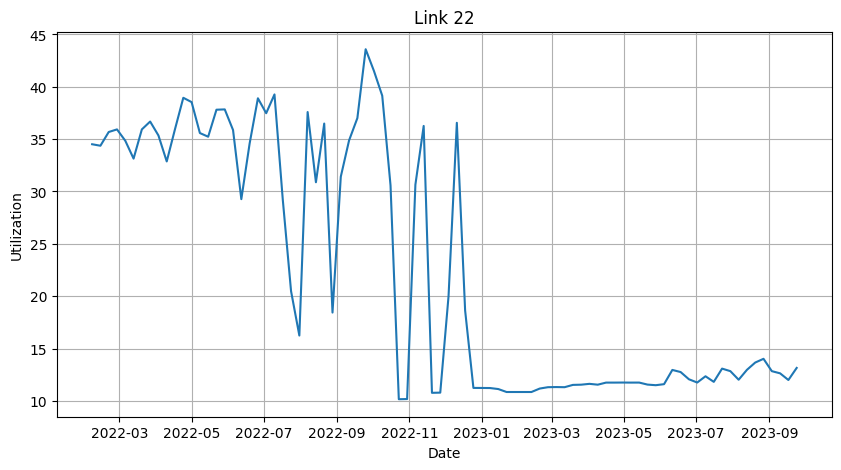

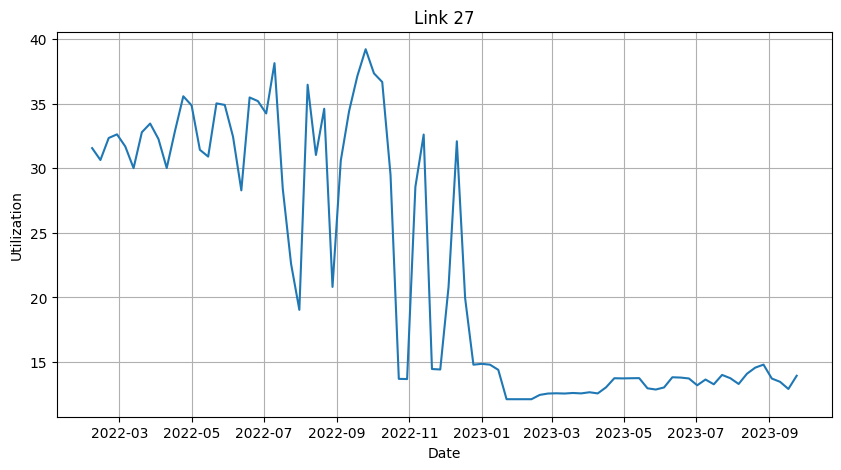

...

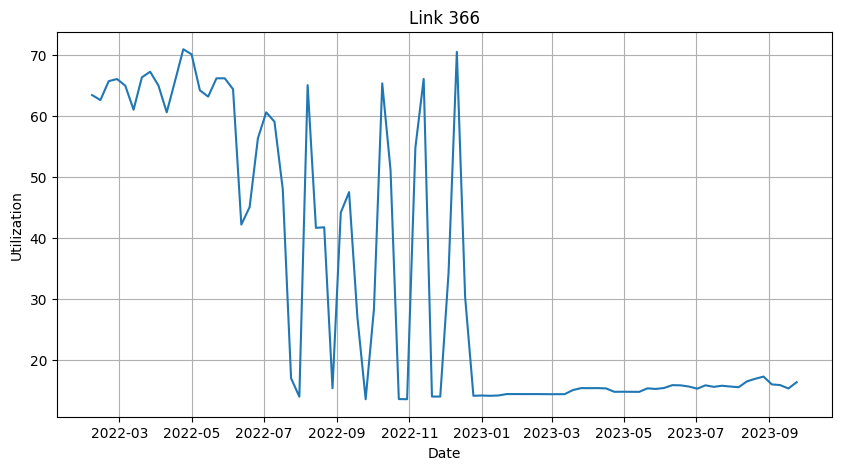

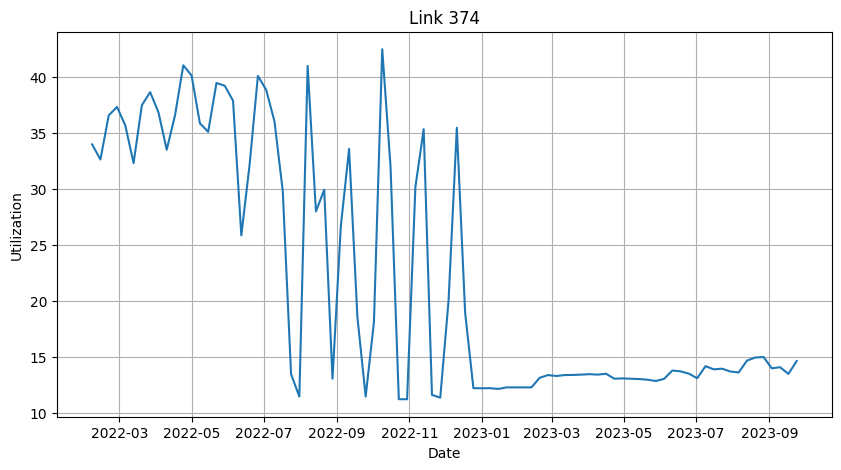

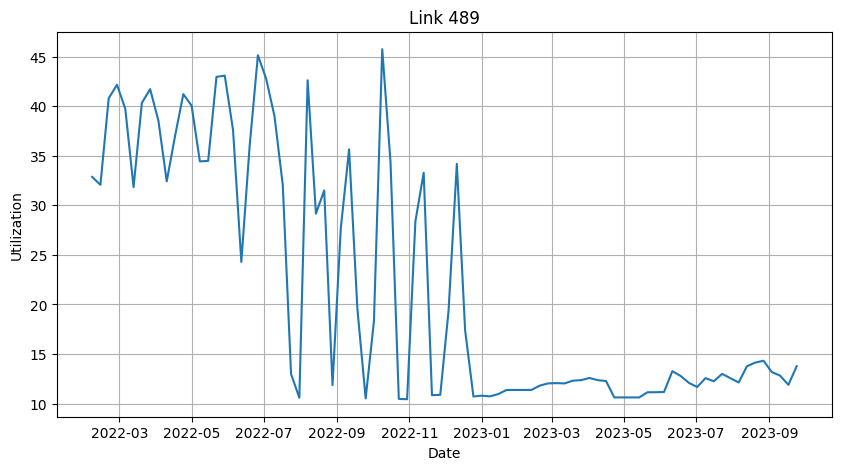

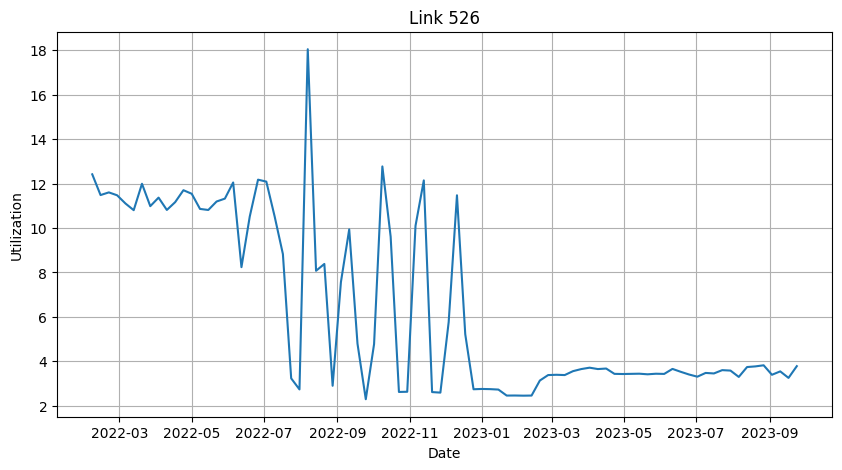

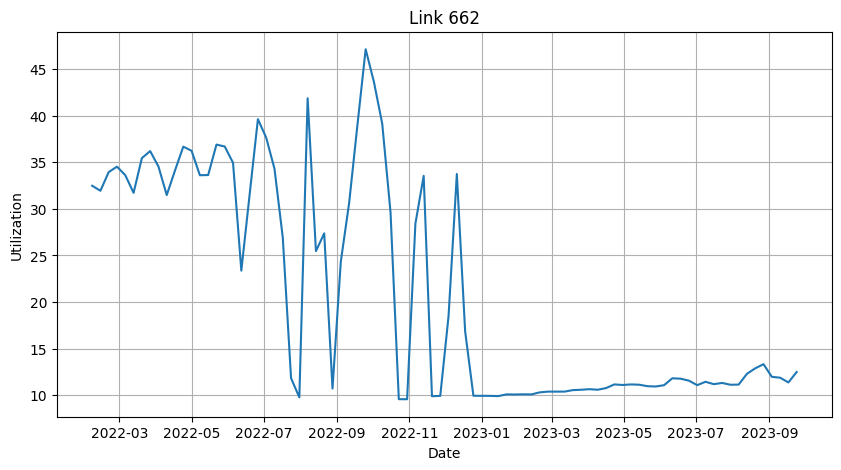

In [ ]:
plot_link_and_cluster(link_number_to_plot, all_Series, allMySeries, labels, start_date, end_date)

### Monthly Clustering

In [ ]:
link_number_to_plot = 10
start_date = '2022-01-31'
end_date = '2023-09-30'

In [ ]:
all_links = pd.read_csv('388_links_monthly_after_prepro.csv').reset_index(drop=True)
all_Series, allMySeries = create_link_dataframes(all_links, start_date, end_date)

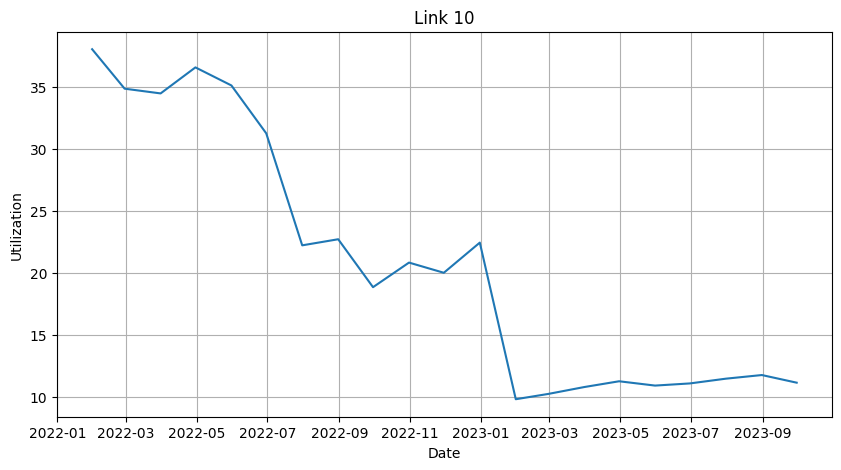

In [ ]:
plot_link_by_number(link_number_to_plot, all_Series, allMySeries, start_date, end_date)

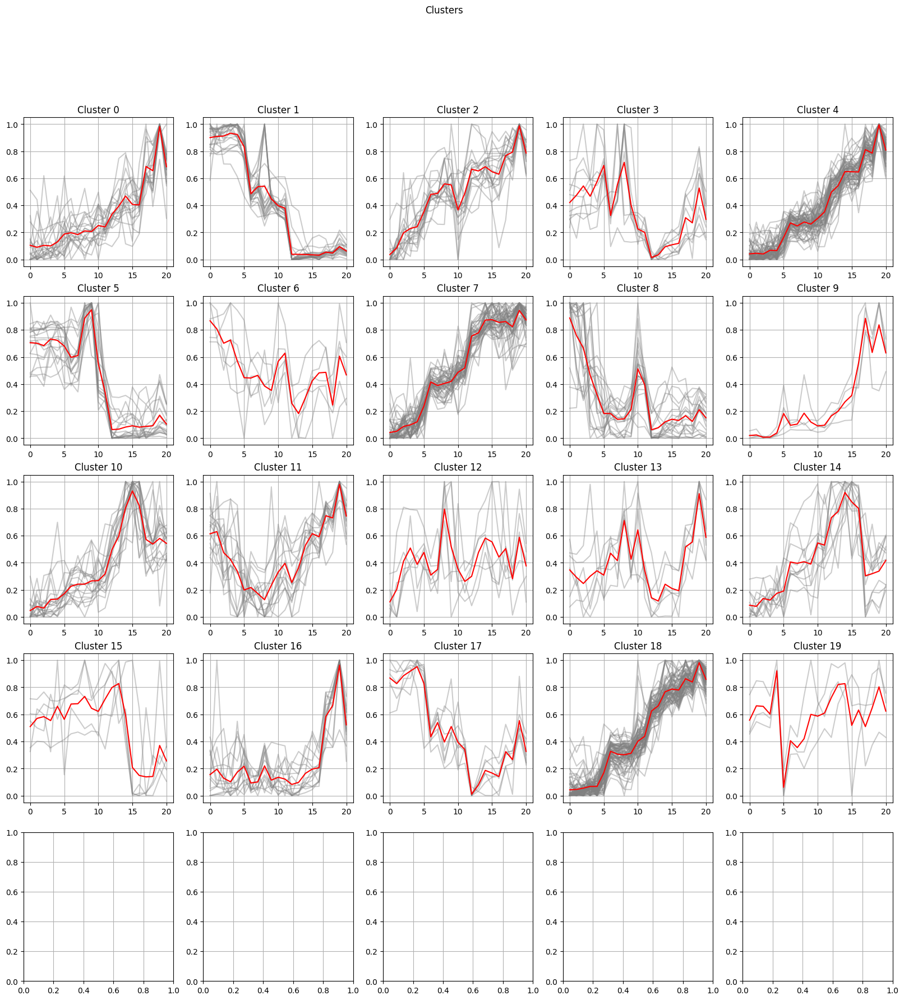

In [ ]:
labels, filtered_series_list = cluster_time_period(all_Series, start_date, end_date)

Link 10 belongs to (Cluster 1):
These are all links in Cluster 1: [1, 9, 11, 21, 26, 33, 78, 79, 88, 91, 121, 123, 126, 173, 181, 182, 184, 225, 233, 275, 288, 312, 368]


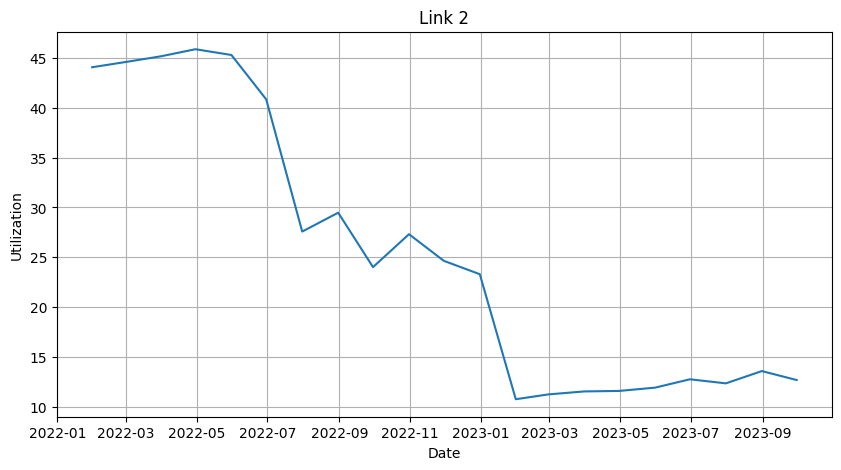

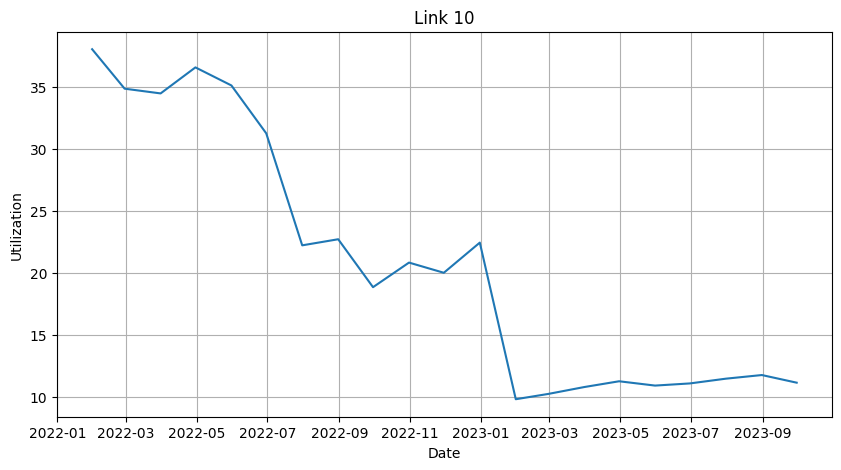

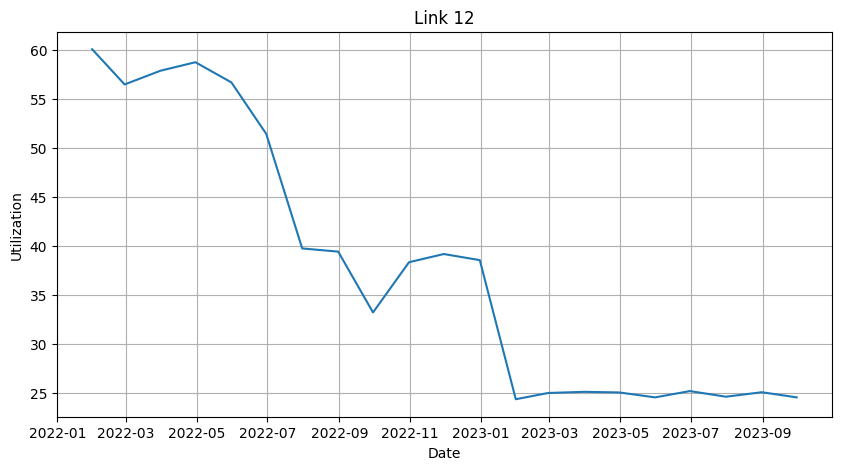

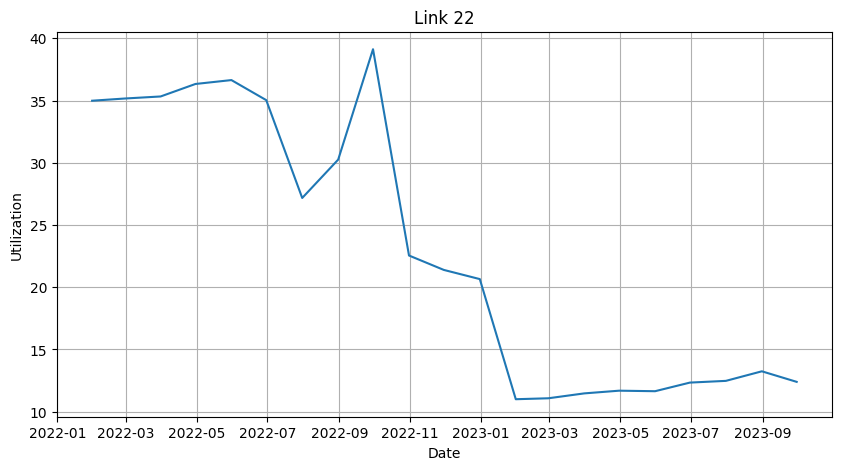

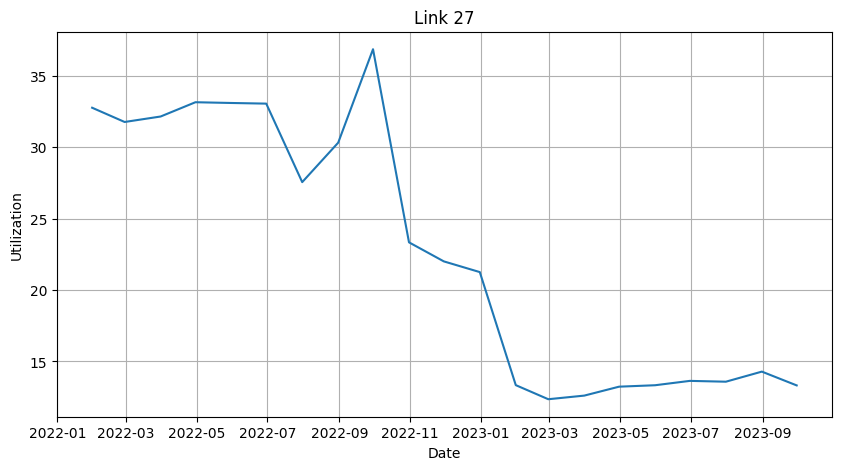

...

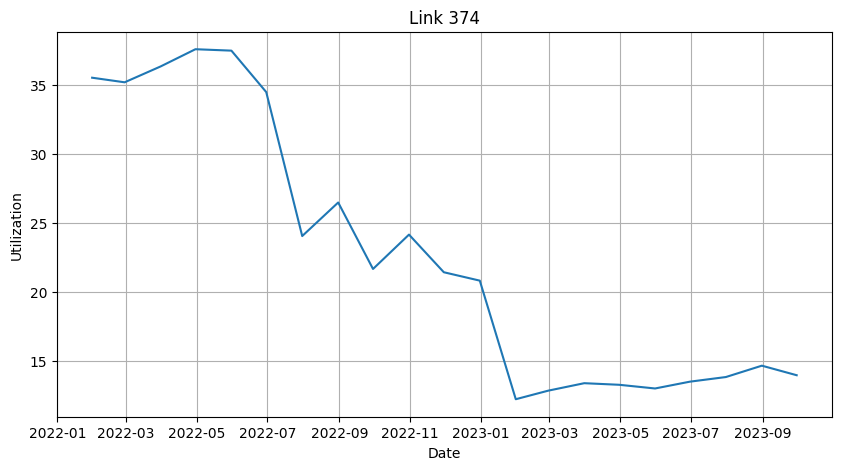

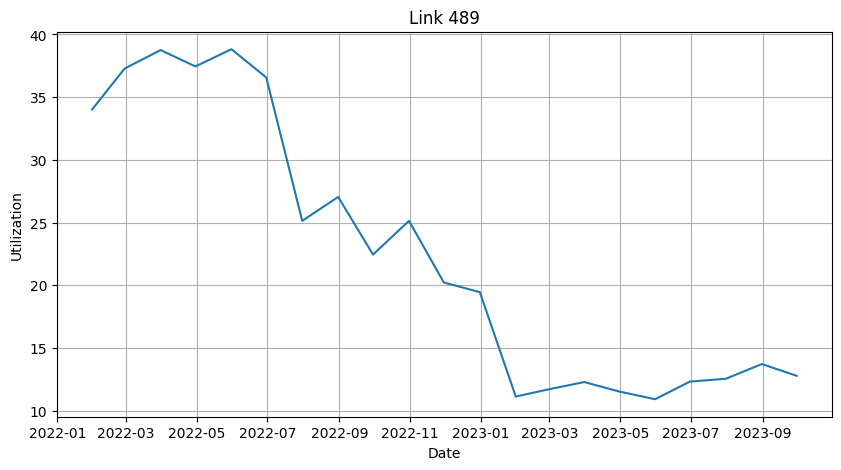

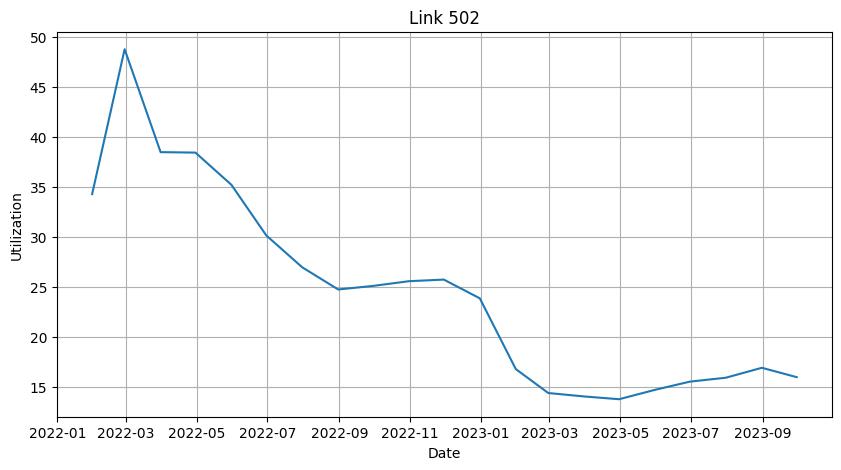

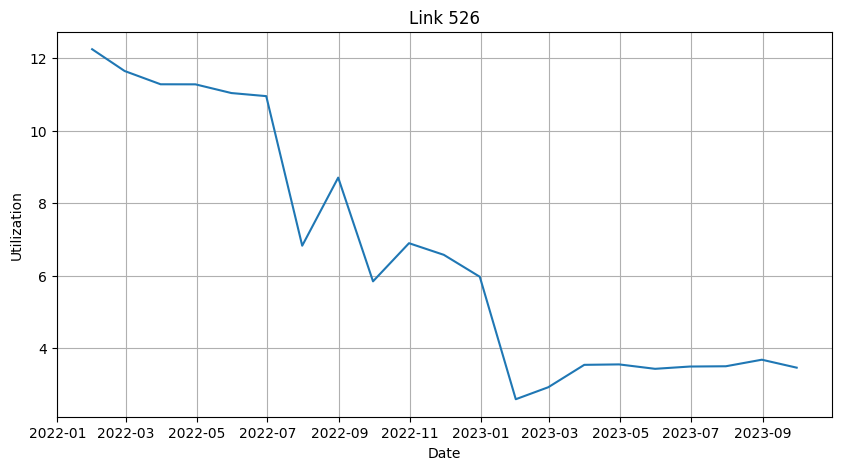

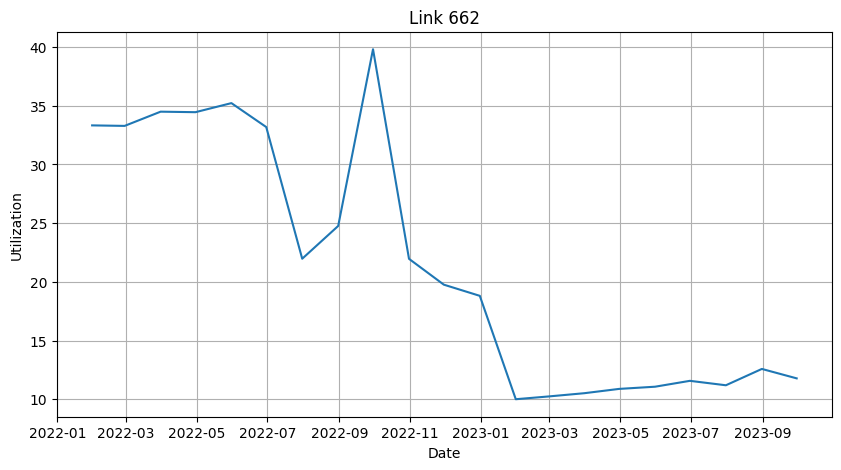

In [ ]:
plot_link_and_cluster(link_number_to_plot, all_Series, allMySeries, labels, start_date, end_date)

## DSCAN

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
import numpy as np

In [ ]:
# Load the dataset
data = pd.read_csv('/content/International_Concatenated_Summary.csv')
data.head()

,LinkName,GW_localtion,PeakTraffic(Gbps),Availability %,Max_DL_Traffic(Gbps),Utilization %,available capacity,Date
0,Link - 16,GW - 1,72.5,100,72.5,72.5,100,8/16/2023
1,Link - 31,GW - 4,71.5,100,71.5,71.5,100,8/16/2023
2,Link - 32,GW - 1,68.9,100,68.9,68.9,100,8/16/2023
3,Link - 25,GW - 4,64.4,100,64.4,64.4,100,8/16/2023
4,Link - 24,GW - 2,63.9,100,63.9,63.9,100,8/16/2023


In [ ]:
# Identify backup links based on zero values
data['IsBackupLink'] = (data['PeakTraffic(Gbps)'] == 0) & (data['Availability %'] == 0) & (data['Max_DL_Traffic(Gbps)'] == 0) & (data['Utilization %'] == 0)

# Set the columns to be used for clustering
columns_to_normalize = ['PeakTraffic(Gbps)', 'Max_DL_Traffic(Gbps)', 'Utilization %', 'available capacity']

# Separate the data into two groups: backup links and non-backup links
backup_links = data[data['IsBackupLink']]
non_backup_links = data[~data['IsBackupLink']]

In [ ]:
# Display mean and standard deviation before normalization
means_before = non_backup_links[columns_to_normalize].mean()
stds_before = non_backup_links[columns_to_normalize].std()

print("Mean before normalization:")
print(means_before)
print("\nStandard Deviation before normalization:")
print(stds_before)

Mean before normalization:
PeakTraffic(Gbps)       17.551163
Max_DL_Traffic(Gbps)    17.546977
Utilization %           49.708372
available capacity      30.930233
dtype: float64

Standard Deviation before normalization:
PeakTraffic(Gbps)       23.846730
Max_DL_Traffic(Gbps)    23.848709
Utilization %           10.395845
available capacity      38.065944
dtype: float64


In [ ]:
# Normalize the non-backup links data
scaler = StandardScaler()
non_backup_links[columns_to_normalize] = scaler.fit_transform(non_backup_links[columns_to_normalize])

<ipython-input-5-a59d620495ce>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  non_backup_links[columns_to_normalize] = scaler.fit_transform(non_backup_links[columns_to_normalize])


In [ ]:
# Display mean and standard deviation after normalization
means_after = non_backup_links[columns_to_normalize].mean()
stds_after = non_backup_links[columns_to_normalize].std()

print("\nMean after Z-score normalization:")
print(means_after)
print("\nStandard Deviation after Z-score normalization:")
print(stds_after)


Mean after Z-score normalization:
PeakTraffic(Gbps)      -1.198008e-16
Max_DL_Traffic(Gbps)   -2.065531e-17
Utilization %           5.287760e-16
available capacity     -4.957275e-17
dtype: float64

Standard Deviation after Z-score normalization:
PeakTraffic(Gbps)       1.001165
Max_DL_Traffic(Gbps)    1.001165
Utilization %           1.001165
available capacity      1.001165
dtype: float64


Optimal Epsilon for Non-Backup Links (knee point): 1.2897339743417773
Optimal Min Samples for Non-Backup Links (knee point): 1


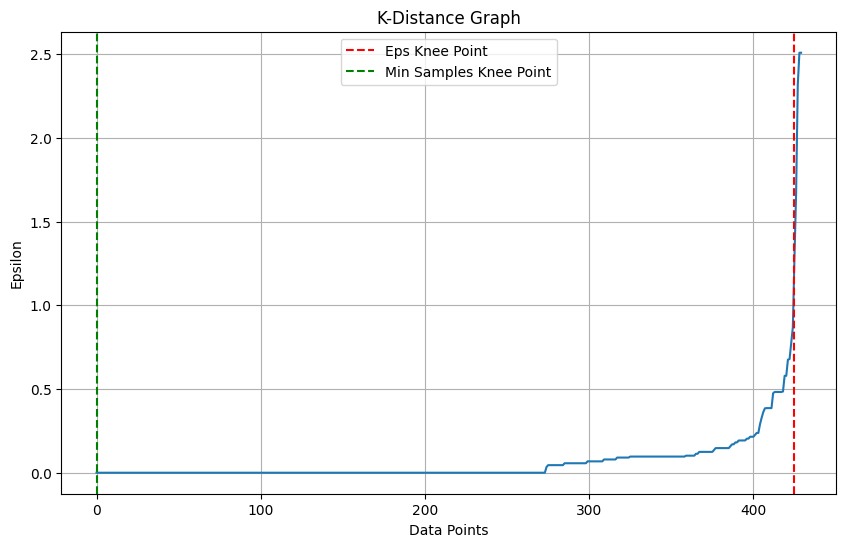

In [ ]:
# Fit the Nearest Neighbors model for non-backup links
neighbors = NearestNeighbors(n_neighbors=7)
neighbors.fit(non_backup_links[columns_to_normalize])

# Compute the distances and indices of the nearest neighbors for non-backup links
distances, indices = neighbors.kneighbors(non_backup_links[columns_to_normalize])

# Sort the distances in ascending order for non-backup links
distances = np.sort(distances, axis=0)

# Calculate the rate of change (slope) for each point for non-backup links
rate_of_change = np.diff(distances[:, -1], 2)

# Find the index of the knee point (where rate_of_change is maximum) for non-backup links
knee_point_index = np.argmax(rate_of_change) + 2  # Add 2 to account for the diff operation

# Get the corresponding epsilon value for non-backup links
optimal_eps_non_backup = distances[knee_point_index, -1]

# Calculate the optimal min_samples for non-backup links
min_samples_values = range(1, 11)  # You can adjust this range as needed
num_clusters = []

for min_samples in min_samples_values:
    dbscan = DBSCAN(eps=optimal_eps_non_backup, min_samples=min_samples)
    dbscan.fit(non_backup_links[columns_to_normalize])
    num_clusters.append(len(np.unique(dbscan.labels_)))

# Find the index of the knee point for min_samples (where num_clusters increases the least) for non-backup links
knee_point_min_samples = np.argmin(np.diff(num_clusters))

# Get the corresponding min_samples value for non-backup links
optimal_min_samples_non_backup = min_samples_values[knee_point_min_samples]

# Print the optimal values for non-backup links
print(f'Optimal Epsilon for Non-Backup Links (knee point): {optimal_eps_non_backup}')
print(f'Optimal Min Samples for Non-Backup Links (knee point): {optimal_min_samples_non_backup}')

# Plot the k-distance graph
plt.figure(figsize=(10, 6))
plt.plot(np.arange(len(distances)), distances[:, -1])
plt.xlabel('Data Points')
plt.ylabel('Epsilon')
plt.title('K-Distance Graph')
plt.axvline(x=knee_point_index, color='r', linestyle='--', label='Eps Knee Point')
plt.axvline(x=knee_point_min_samples, color='g', linestyle='--', label='Min Samples Knee Point')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
# Create and fit the DBSCAN model for non-backup links
dbscan = DBSCAN(eps=optimal_eps_non_backup, min_samples=optimal_min_samples_non_backup)
non_backup_cluster_labels = dbscan.fit_predict(non_backup_links[columns_to_normalize])

In [ ]:
# Count the number of clusters (excluding noise) for non-backup links
num_clusters = len(np.unique(non_backup_cluster_labels[non_backup_cluster_labels != -1]))

# Print the number of clusters
print(f'Number of Clusters (Excluding Noise) - Non-Backup Links: {num_clusters}')

Number of Clusters (Excluding Noise) - Non-Backup Links: 3


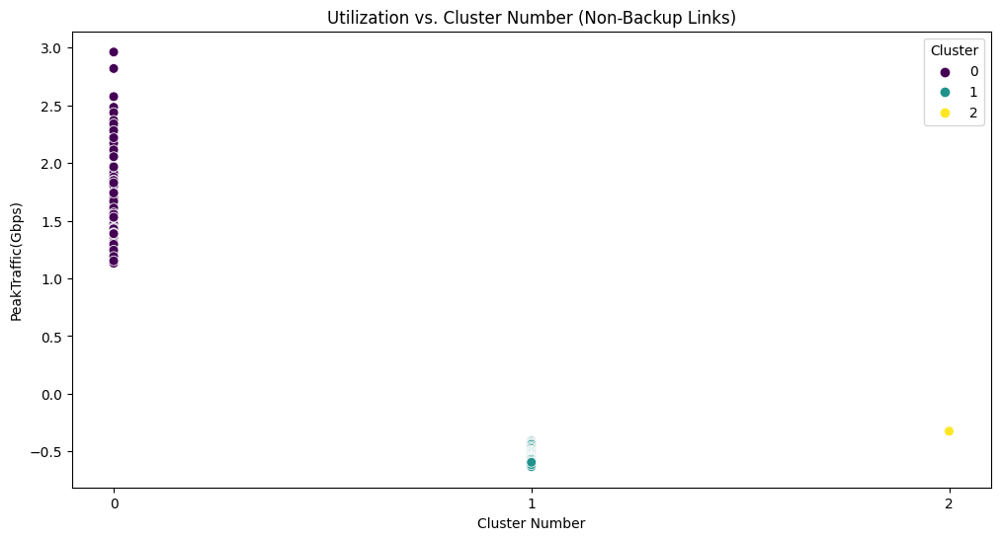

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select the relevant features
feature1 = 'PeakTraffic(Gbps)'
feature2 = 'Max_DL_Traffic(Gbps)'

# Create a scatter plot for non-backup links, color-coded by cluster labels
plt.figure(figsize=(12, 6))
sns.scatterplot(
    x=non_backup_cluster_labels,  # Cluster number on the x-axis
    y=non_backup_links[feature1],  # Utilization on the y-axis
    hue=non_backup_cluster_labels,  # Color by cluster
    palette='viridis',
    s=50  # Marker size
)
plt.title(f'Utilization vs. Cluster Number (Non-Backup Links)')
plt.xlabel('Cluster Number')
plt.ylabel(feature1)

# Set x-axis ticks to integers
plt.xticks(range(int(min(non_backup_cluster_labels)), int(max(non_backup_cluster_labels)) + 1))

plt.legend(title='Cluster', loc='upper right')
plt.show()


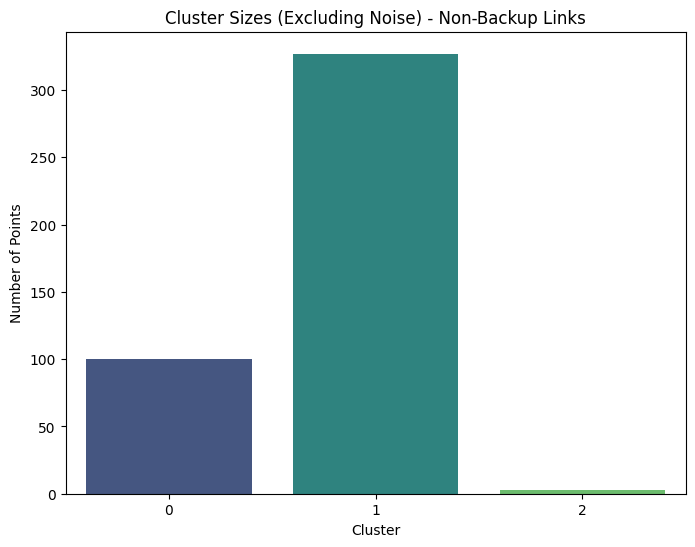

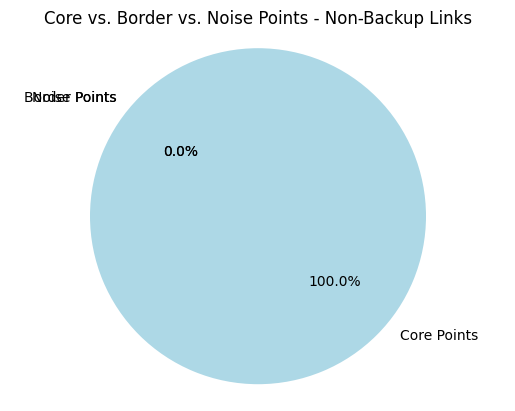

In [ ]:
# Count the number of points in each cluster (excluding noise) for non-backup links
cluster_sizes = pd.Series(non_backup_cluster_labels[non_backup_cluster_labels != -1]).value_counts()

# Create a bar plot of cluster sizes for non-backup links
plt.figure(figsize=(8, 6))
sns.barplot(x=cluster_sizes.index, y=cluster_sizes.values, palette='viridis')
plt.title('Cluster Sizes (Excluding Noise) - Non-Backup Links')
plt.xlabel('Cluster')
plt.ylabel('Number of Points')
plt.show()

# Count the number of core, border, and noise points for non-backup links
num_core_points = np.sum(non_backup_cluster_labels != -1)
num_border_points = np.sum(non_backup_cluster_labels == -1)
num_noise_points = np.sum(non_backup_cluster_labels == -1)

# Create a pie chart for non-backup links
labels = ['Core Points', 'Border Points', 'Noise Points']
sizes = [num_core_points, num_border_points, num_noise_points]
colors = ['lightblue', 'lightgreen', 'lightcoral']
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Core vs. Border vs. Noise Points - Non-Backup Links')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score

# Calculate the Silhouette Score for non-backup links
silhouette_avg = silhouette_score(non_backup_links[columns_to_normalize], non_backup_cluster_labels)

print(f'Silhouette Score for Non-Backup Links: {silhouette_avg}')

Silhouette Score for Non-Backup Links: 0.8114553578099211


In [ ]:
# Add a new column 'Cluster' to 'non_backup_links' DataFrame
non_backup_links['Cluster'] = non_backup_cluster_labels

# Display the resulting DataFrame
print(non_backup_links[['LinkName','Cluster']])

      LinkName  Cluster
0    Link - 16        0
1    Link - 31        0
2    Link - 32        0
3    Link - 25        0
4    Link - 24        0
..         ...      ...
443  Link - 05        1
444  Link - 12        1
445  Link - 14        1
446  Link - 15        1
447  Link - 03        1

[430 rows x 2 columns]


<ipython-input-13-cc698605c93c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  non_backup_links['Cluster'] = non_backup_cluster_labels
